#✈ Final Project: Phase 4 Report ✈
##An Algorithmic Approach to Predicting Flight Delays
###Section 3 Group 2 | Ramki Gummadi
###Job Bangayan, Justin Chan, Matthew Rubino, Steven Sung
#####Phase Leader: Job Bangayan

**Run the cells below to obtain information about Azure blob storage and dataframes**

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pyspark.sql.types as T
import pyspark.sql.functions as F
import numpy as np
import plotly
import pandas as pd
import datetime as dt
import re
import networkx as nx
import threading
import statistics
import time
# import squarify

from pyspark.sql.window import Window
from pyspark.sql.types import DoubleType
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import Normalizer
from pyspark.ml.feature import MinMaxScaler
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml.linalg import Vectors
from pyspark.ml.classification import LogisticRegression
from pyspark.ml import Pipeline
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.feature import StandardScaler
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml.functions import vector_to_array
from sklearn.metrics import roc_curve, auc

In [0]:
data_BASE_DIR = "dbfs:/mnt/mids-w261/datasets_final_project_2022/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))

path,name,size,modificationTime
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data/,parquet_airlines_data/,0,1656618287000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_1y/,parquet_airlines_data_1y/,0,1656630272000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0,1656630114000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0,1656630205000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data/,parquet_weather_data/,0,1656622074000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_1y/,parquet_weather_data_1y/,0,1656631614000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_3m/,parquet_weather_data_3m/,0,1656630651000
dbfs:/mnt/mids-w261/datasets_final_project_2022/parquet_weather_data_6m/,parquet_weather_data_6m/,0,1656631047000
dbfs:/mnt/mids-w261/datasets_final_project_2022/stations_data/,stations_data/,0,1656713663000


In [0]:
raw_airlines_df = spark.read.parquet(f"{data_BASE_DIR}parquet_airlines_data/")
raw_stations_df = spark.read.parquet(f"{data_BASE_DIR}stations_data/*")
raw_weather_df = spark.read.parquet(f"{data_BASE_DIR}parquet_weather_data/")

In [0]:
blob_container = "latam" # The name of your container created in https://portal.azure.com
storage_account = "mrubino" # The name of your Storage account created in https://portal.azure.com
secret_scope = "sect3group2" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "sect3group2key" # saskey The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

spark.conf.set(f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net", dbutils.secrets.get(scope = secret_scope, key = secret_key))

In [0]:
# Make sure that the filepath version is the latest one
clean_airlines_df = spark.read.parquet(f"{blob_url}/clean_airlines_4")
clean_stations_df = spark.read.parquet(f"{blob_url}/clean_stations_1")
clean_weather_df = spark.read.parquet(f"{blob_url}/clean_weather_2")
final_df = spark.read.parquet(f"{blob_url}/final_df_13")

## Abstract

The FAA has tasked us to set new flight regulations based on hazardous weather conditions using machine learning models for predict flight delays based on hazardous weather conditions from airline, weather, and station data. In the first three phases of this project, we explored the datasets through EDA, crafted logistic regression and decision tree models to predict delays, and varied hyperparameters and engineered features like PageRank. In this phase, we explored model improvements through time-based holiday feature and MLP neural networks. Unfortunately, we couldn't find any model better than our Decision Tree baseline model with a 8% recall metric as our MLP had a 0% test recall. This is due to the imbalanced dataset and small sample size of weather-delayed flights. As next steps, we suggest to collect more data related to weather delays or broaden the problem statement ot include all types of delays.

## Introduction

According to the U.S. Bureau of Transportation Statistics, over the last 10 years, on average 18.74% of scheduled flights are delayed by 15 minutes or more per year, with 2022 representing the highest percentage (21.16%) of flights delayed since 2014. Delays represent a significant headache for both travelers and airlines alike. Researchers from the University of California Berkeley commissioned by the Federal Aviation Administration (FAA) found that domestic flight delays cost the U.S. economy $32.9 billion, with about half of the cost borne by airline passengers and the other half borne by the airline operators. Today, flight delays remain a widespread issue that places a significant burden on airlines, travelers, and the broader economy at large.

### Problem

We have been tasked by the FAA to help them set new flight regulations based on hazardous weather conditions. Dangerous weather can risk the health of many passengers and employees. One of the flight regulations we aim to change is how flight delays are defined. There are many influences that can delay a flight such as National Air Systems and late arrivals, but we want to specifically examine the impact of inclement weather. More specifically, we will explore what type of weather conditions will create flight delays longer than 15 minutes. If flights are cancelled or delayed due to severe and hazardous weather like rainstorms, floods, or blizzards, it can decrease our customer satisfaction, revenue, and long term economic growth. By decreasing delays, airlines can send out more flights at approriate times to increase their revenue and decrease flight fatalities.

Note:
We define a flight delay as any flight departing 15 minutes later than expected scheduled departure time. Data on severe weather such as tornados, heavy winds, and floods is captured by weather data, where we can correlate this data with air flight delays.

#### Business Case

To clarify the foundations of this problem, we want to expand on the actual business case we formed. Since the FAA has tasked us to explore the potential for machine learning models for predicting flight delays based on hazardous weather conditions. Of course, weather conditions are not the only contributing factor to flight delays, but in this very complex problem of predicting the delays before they occur, every bit of information is beneficial even if it is only a piece of the puzzle. But in a step towards understanding each factor that plays into flight delays, this is the FAA's attempt in doing so. The goal of our team's model/models is to identify the highest correlated features of weather data that can help best predict a flight delay. With that being said, providing the FAA with these features based on historical data from airports and airlines around the United States will shed new light on what aspects of weather reports to clue in on. It is clear to both the FAA and our team that a model based on purely weather data will not provide a good enough success metric to base future delays off of, however, like we said before- weather data is not the only contributing factor to flight delays across the country.

### Datasets

We will leverage three data sets which are airline, station, and weather data. The airline and station dataset were retrieved from the [US Department of Transportation](https://www.transtats.bts.gov/homepage.asp) and the weather data was obtained by the [National Oceanic and Atmospheric Administration Repository](https://www.ncei.noaa.gov/access/metadata/landing-page/bin/iso?id=gov.noaa.ncdc:C00679). We used these specific datasets since they were open source and contained a lot of recent information about flights and weather data. Since these datasets come from different data sources with no guarantees about data integrity, we must do our own exploratory data anlaysis on each table

The datasets were downloaded and converted into parquet files into Azure Blob Cloud Storage so that reading and writing the files over millions of records would be fast. When ready to analyze the data, we pulled the data from the cloud into PySpark dataframes through EDA like plots and histograms. Once we have a better understanding of each dataset, we will clean each dataframe based on null counts and create checkpoints for the celan dataframes so that they can be referenced later. A join on keys like date, time, and location will combine all three datasets into one master table which will be used to train our models as well as any additional EDA.

We will discuss more about the cleaning process of each dataset in detail in each of the subsections below. We also show a visual diagram below. As a disclaimer, throughout this report, we will be refering to the airline data as both "flight" and "airline" data interchangeably depending on the context of our analysis.

<img src="https://github.com/sysung/w261-final-project/blob/master/full_workflow_pipeline.drawio%20(1).png?raw=true" width=80%>

#### Airlines / Flight Data

##### Data Description

The airline/flight dataset contains flights from 2015 to 2021 and has 74,177,433 total rows and 109 fields of data. Each row corresponds to an individual flight within the United States. Looking at their database dictionary from the [Bureau of Transportation Statistics](https://www.transtats.bts.gov/Fields.asp?gnoyr_VQ=FGJ) under the US Department of Transportation, we can delve into each feature family and how it relates to our problem statement. 

This dataset is important in understanding how weather impacts flights since it holds the data of which flights were delayed or not delayed. Therefore, we will only be keeping data about the airport station, date, and the delay variable and removing nuanced information like cancellation, diversion, and other measured data not associated with weather or airport stations.

###### Time Period
Time Period contains all of the information related to the flights time like Year, Quarter, Month, Day of Month, Day of Week, and Flight Date. This will be used as our join key with the weather dataset so that we can get weather information that is tuned to the surrounding time of flight departure.

###### Airline
Airline fields contain information about the airline like unique carrier codes for the airline company, the flights coming in and out of airports, and tail numbers for specific planes. There are many codes used for an individual airline company where some of them are assigned by the International Air Transport Association (IATA) while others are assigned by the U.S. Department of Transportation. Therefore, we picked the field `OP_UNIQUE_CARRIER` which is a unique identifier for a specific carrier.

###### Origin and Destination
The fields within Origin and Destination are very similar where they had information on the origin and destinatino airport like the ID, city, State, FIPS code, etc. Since we're only interested in departing flight delays, we'll mostly be looking at the Origin airport information.

###### Departure and Arrival Performance
Departure and Arrival Performance has infromation about the flight status which includes minute details from wheels off, wheels on, taxi in, taxi, out, and delays. We'll be focusing on departure performance as this is our main motvie. More importantly it has a field called `DEP_DEL15` which is a binary variable that states if a flight is delayed by more than 15 minutes or not. This variable will be our main predictor variable.

###### Cancellations and Diversions
This section does not contain a lot of fields, but is somewhat relevant in flights. However, in our use case, cancellations and diversions occur during a flight of a specific tail number, not pre-flight information. Therefore, we can probably ignore this field.

###### Cause of Delay
The data dictionary lists multiple causes of delays such as carrier delay, weather delay, national air system delay, and others. While these may seem intriguing, some of these delays can be handled through human intervention. We can see how weather delays in minutes correlates with departure delays.

###### Gate Return Information at Origin Airport
The Gate Return Information at Origin Airport contains redundant information like departure time at origin airport and post-flight details which does not help solve our problem. We can safely ignore the fields under this feature family.

###### Diverted Airport Information
Diverted airport information pertains to only flights that have diverted. Flight that have diverted do not necessarily mean that they departed early or late. In conclusion, we can remove the fields pertaining to diverted airports.

In [0]:
print(f"Raw Airlines Row Count: {raw_airlines_df.count()}")
print(f"Raw Airlines Column Count: {len(raw_airlines_df.columns)}")

Raw Airlines Row Count: 74177433
Raw Airlines Column Count: 109


##### Null Counts

The first form of EDA that we did was look for null counts in the raw data set. Raw data usually contains nulls from either human error or by logic, for example, if the field is not applicable to the flight. The histogram is sorted by the indices that the column appears in the raw table. We've removed all columns which have no nulls so that we can see which field has the highest null counts.

In [0]:
raw_null_ct_df = raw_airlines_df.select([F.count(F.when(F.isnan(c) | F.col(c).isNull(), c)).alias(c) for c in raw_airlines_df.columns]).cache()

In [0]:
null_ct_list = raw_null_ct_df.rdd.flatMap(lambda x: x).collect()
colnames = ["fields", "nonzero_nulls"]
null_rdd = spark.sparkContext.parallelize(list(zip(raw_null_ct_df.columns, null_ct_list)))
null_df = spark.createDataFrame(null_rdd).toDF(*colnames)

Upon further inspection of the data, most of the columns that have high null values fall under the Cause of Delay and Diverted Airpot Information features. This is understandable as a high volume of null values means that there are very few flights that were not enroute.

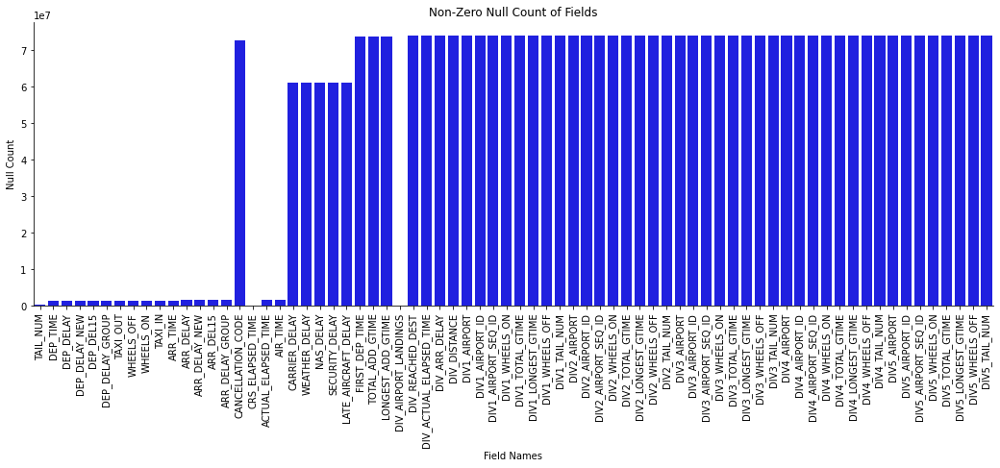

In [0]:
null_pd = null_df.filter(F.col("nonzero_nulls") > 0).pandas_api().to_pandas()

chart = sns.catplot(y="nonzero_nulls", x="fields", kind="bar", data=null_pd, color="blue", height=5, aspect=15/5)
chart.set_axis_labels("Field Names", "Null Count")
chart.set(title='Non-Zero Null Count of Fields')
plt.xticks(rotation=90)
plt.show()

##### Weather Delay
In the airlines data, there is a column called `WEATHER_DELAY`. Since we are exploring how weather impact flights, this is an interesting column to dive into. For this EDA, will will format all `WEATHER_DELAY` values where if it's null or 0, it will turn to 0. Otherwise, it will be 1.

In [0]:
weather_delay = raw_airlines_df.select(
        'WEATHER_DELAY',
        'DEP_DEL15'
    ).withColumn(
        'BIN_WEATHER_DELAY', F.when((F.col('WEATHER_DELAY').isNull()) | (F.col('WEATHER_DELAY')==0), 0).otherwise(1)
    ).drop('WEATHER_DELAY')

At first glance at the table below, we see that there are flights that were delayed but not by weather. This means that there are airline that were delayed by something that wasn't weather like late arrivals or or reasons.

In [0]:
display(weather_delay)

DEP_DEL15,BIN_WEATHER_DELAY
0.0,0
1.0,0
1.0,0
0.0,0
0.0,0
1.0,0
0.0,0
0.0,0
0.0,0
0.0,0


We will count how many records were delayed by weather, delayed but not by weather, and not delayed at all. These will be the count of the variations of 0s and 1s between `WEATHER_DELAY` and `DEP_DEL15`. We will also count the scenario where `DEP_DEL15==0` and `BIN_WEATHER_DELAY==1`, but we expect this to be 0 because a flight cannot be on time while there is a weather delay.

In [0]:
no_delay = weather_delay.filter((F.col('DEP_DEL15') == 0) & (F.col('BIN_WEATHER_DELAY') == 0)).count()
delay_not_by_weather = weather_delay.filter((F.col('DEP_DEL15') == 1) & (F.col('BIN_WEATHER_DELAY') == 0)).count()
delay_by_weather = weather_delay.filter((F.col('DEP_DEL15') == 1) & (F.col('BIN_WEATHER_DELAY') == 1)).count() 
no_delay_but_weather = weather_delay.filter((F.col('DEP_DEL15') == 0) & (F.col('BIN_WEATHER_DELAY') == 1)).count()

print(f"No delayed flights: {no_delay}")
print(f"Delay, but not by weather: {delay_not_by_weather}")
print(f"Delay by weather: {delay_by_weather}")
print(f"No delay, but weather delay: {no_delay_but_weather}")

No delayed flights: 59955343
Delay, but not by weather: 12131052
Delay by weather: 681827
No delay, but weather delay: 73976


We see that there are 59,955,343 flights that departed on time, 12,131,052 flights that were delayed but not by weather, and 681,827 flights that were delayed by weather. There were also 73,976 anomalous flights that fell under the impossible scenario of having no delay, but labeled as a flight delay.

Since we only want to include airlines that were either affected by weather delay or not delayed at all, we will keep rows where the condition `BIN_WEATHER_DELAY==1 & DEP_DEL15==1 ` and `BIN_WEATHER_DELAY==0 & DEP_DEL15==0`

In [0]:
weather_delay_airlines_df = raw_airlines_df.withColumn(
        'BIN_WEATHER_DELAY', 
        F.when((F.col('WEATHER_DELAY').isNull()) | (F.col('WEATHER_DELAY')==0), 0).otherwise(1)
    ).filter(
        ((F.col('BIN_WEATHER_DELAY')==1) & (F.col('DEP_DEL15')==1)) | \
        ((F.col('BIN_WEATHER_DELAY')==0) & (F.col('DEP_DEL15')==1)) | \
        ((F.col('BIN_WEATHER_DELAY')==0) & (F.col('DEP_DEL15')==0))
    ).drop('BIN_WEATHER_DELAY')

Our new airlines dataframe now contains 72,768,222 flights while keeping the same number of columns (109).

In [0]:
print(f"New row count: {weather_delay_airlines_df.count()}")
print(f"New column count: {len(weather_delay_airlines_df.columns)}")

New row count: 72768222
New column count: 109


##### Feature Selection

To clean the data, we removed all of the columns that have an extremely high null value count. This will reduce our dimensions and remove the curse of dimensionality. There are a few exceptions in which we kept like airport information because it will be used to join on the different tables; in the final dataframe, it will be dropped.

From the subsetted features,  we can easily fill some of the columns using basic arithmetics for columns with null values. Since we are doing it on a smaller set of fields, we only need to calculate null values for a few fields and not all 109 fields. We used `CRS_DEP_TIME` and `DEP_TIME` to calculate the `DEP_DELAY`, which is then used to calculate `DEP_DEL15` based on a simple condition statement if `DEP_DELAY` is greater than or equal to 15 or not. If some rows still contained nulls, we removed the row altogether as it would only be a few rows lost.

We've also dropped columns that were collinear to the output variable. For example, `DEP_DELAY`, which is the amount of time delayed, and `WEATHER_DELAY`, which is the amount of time delayed by weather, are both dropped.

In [0]:
subset_cols = [
    "YEAR",
    "QUARTER",
    "MONTH",
    "DAY_OF_MONTH",
    "DAY_OF_WEEK",
    "OP_UNIQUE_CARRIER",
    "TAIL_NUM",
    "OP_CARRIER_FL_NUM",
    "ORIGIN",
    "ORIGIN_AIRPORT_ID",
    "ORIGIN_CITY_NAME",
    "ORIGIN_STATE_NM",
    "ORIGIN_STATE_ABR",
    "DEST",
    "DEST_AIRPORT_ID",
    "DEST_CITY_NAME",
    "DEST_STATE_NM",
    "DEST_STATE_ABR",
    "CRS_DEP_TIME",
    "CRS_ARR_TIME",
    "DEP_TIME",
    "DEP_DELAY",
    "DEP_DEL15"
]

na_drop_cols = [
    "CRS_DEP_TIME",
    "CRS_ARR_TIME",
    "DEP_TIME"
]

ft_select_airlines_df = weather_delay_airlines_df \
    .select(subset_cols) \
    .na.drop(subset=na_drop_cols) \
    .withColumn("DEP_DEL15", F.when(F.col("DEP_DELAY") >= 15, 1).otherwise(0)) \
    .drop(*["DEP_TIME", "DEP_DELAY"])

##### Primary Keys
A huge flaw in raw datasets is that they can contain duplicates flights. Therefore, since we want to make each flight unique, we can create a set of primary keys that will uniquely identify each row. We can also remove rows which have null keys since it may also heavily skew the data.

The primary keys we have chosen are `YEAR`, `MONTH`, `DAY_OF_MONTH`, `OP_UNIQUE_CARRIER`, `TAIL_NUM`, `OP_CARRIER_FL_NUM`, `ORIGIN_AIRPORT_ID`, and `DEST_AIRPORT_ID` because on any given day, there should only be one airplane going from origin airport to destination airport with the flight number.

In [0]:
primary_keys = [
    "YEAR",
    "MONTH",
    "DAY_OF_MONTH",
    "OP_UNIQUE_CARRIER",
    "TAIL_NUM",
    "OP_CARRIER_FL_NUM",
    "ORIGIN_AIRPORT_ID",
    "DEST_AIRPORT_ID"
]

In [0]:
display(ft_select_airlines_df.select(primary_keys).groupBy(primary_keys).count().filter(F.col("count") > 0))

YEAR,MONTH,DAY_OF_MONTH,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,count
2019,5,18,UA,N36247,2314,11042,12264,2
2019,6,6,YX,N206JQ,5894,12953,10721,2
2019,5,18,UA,N18112,1936,11618,11292,2
2019,5,18,UA,N63899,1724,12758,14771,2
2019,6,7,YX,N823MD,5892,11278,12953,2
2019,5,18,UA,N4901U,1614,13303,11618,2
2019,6,7,YX,N201JQ,6005,11986,12953,2
2019,5,18,UA,N76516,1260,12892,12889,2
2019,5,18,UA,N17002,1117,12266,12892,2
2019,6,9,YX,N823MD,5881,12339,12953,2


In [0]:
example_dupe_flight = ft_select_airlines_df \
    .filter(
        (F.col("YEAR")==2019) &
        (F.col("MONTH")==5) &
        (F.col("DAY_OF_MONTH")==18) &
        (F.col("OP_UNIQUE_CARRIER")=="UA") &
        (F.col("TAIL_NUM")=="N36247") &
        (F.col("OP_CARRIER_FL_NUM")==2314) &
        (F.col("ORIGIN_AIRPORT_ID")==11042) &
        (F.col("DEST_AIRPORT_ID")==12264))

display(example_dupe_flight)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_AIRPORT_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_NM,ORIGIN_STATE_ABR,DEST,DEST_AIRPORT_ID,DEST_CITY_NAME,DEST_STATE_NM,DEST_STATE_ABR,CRS_DEP_TIME,CRS_ARR_TIME,DEP_DEL15
2019,2,5,18,6,UA,N36247,2314,CLE,11042,"Cleveland, OH",Ohio,OH,IAD,12264,"Washington, DC",Virginia,VA,555,721,0
2019,2,5,18,6,UA,N36247,2314,CLE,11042,"Cleveland, OH",Ohio,OH,IAD,12264,"Washington, DC",Virginia,VA,555,721,0


We can see in the example above that one of the flights has two of the same exact occurrences. To remedy this problem, we can retrieve only distinct records by primary keys to remove duplicates.

In [0]:
dupe_airlines_df = ft_select_airlines_df \
    .na.drop(subset=primary_keys) \
    .distinct()

In [0]:
dupe_flights = dupe_airlines_df.select(primary_keys).groupBy(primary_keys).count().filter(F.col("count") > 1)
print(f"Number of duplicate records: {dupe_flights.count()}")

Number of duplicate records: 3


In [0]:
display(dupe_flights)

YEAR,MONTH,DAY_OF_MONTH,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,count
2018,1,7,OO,N254SY,4656,14489,13264,2
2018,1,14,OO,N724SK,3030,12892,14489,2
2017,11,16,OO,N604SK,4529,13487,11337,2


Even after the deduping, we still found 3 anomalous flights where they shared the same primary keys but contained different flight information. Since it is a small set of anomalies, we've decided to remove it altogether.

In [0]:
clean_airlines_df = dupe_airlines_df.join(dupe_flights.drop("count"), primary_keys, "left_anti")

dupe_flights2 = clean_airlines_df.select(primary_keys).groupBy(primary_keys).count().filter(F.col("count") > 1)
print(f"Number of duplicate records: {dupe_flights2.count()}")

Number of duplicate records: 0


##### Data Dictionary
The data dictionary contains all of the fields in the clean airlines dataframe.

Field                 | Description                                                                                                | Data Type
--------------------- | ---------------------------------------------------------------------------------------------------------- | ---------
YEAR                  | Year                                                                                                       | Integer
QUARTER               | Quarter (1-4)                                                                                              | Integer
MONTH                 | Month                                                                                                      | Integer
DAY_OF_MONTH          | Day of month                                                                                               | Integer
DAY_OF_WEEK           | Day of week                                                                                                | Integer
OP_UNIQUE_CARRIER     | Unique Carrier Code. When the same code has been used by multiple carriers, a numeric suffix is used for earlier users, for example, PA, PA(1), PA(2). Use this field for analysis across a range of years.                                                                 | String
TAIL_NUM              | Tail Number used to identify a specific airplane                                                           | String
OP_CARRIER_FL_NUM     | Flight Number                                                                                              | Integer
ORIGIN                | Origin Airport                                                                                             | String
ORIGIN_AIRPORT_ID     | Origin Airport, Airport ID. An identification number assigned by US DOT to identify a unique airport. Use this field for airport analysis across a range of years because an airport can change its airport code and airport codes can be reused.                            | Integer
ORIGIN_CITY_NAME      | Origin Airport, City Name                                                                                  | String
ORIGIN_STATE_NM       | Origin Airport, State Name                                                                                 | String
ORIGIN_STATE_ABR      | Origin Airport, State Code                                                                                 | Integer
DEST                  | Destination Airport                                                                                        | String
DEST_AIRPORT_ID       | Destination Airport, Airport ID. An identification number assigned by US DOT to identify a unique airport. Use this field for airport analysis across a range of years because an airport can change its airport code and airport codes can be reused.                   | Integer
DEST_CITY_NAME        | Destination Airport, City Name                                                                             | String
DEST_STATE_NM         | Destination Airport, State Name                                                                            | String
DEST_STATE_ABR        | Destination Airport, State Code                                                                            | String
CRS_DEP_TIME          | CRS Departure Time (local time: hhmm)                                                                      | Integer
CRS_ARR_TIME          | CRS Arrival Time (local time: hhmm)                                                                        | Integer
DEP_DEL15             | Departure Delay Indicator, 15 Minutes or More (1=Yes)                                                      | Integer

##### Summary Statistics
The new clean airlines dataframe contains 41,531,221 rows and 21 columns.

In [0]:
print(f"Clean Airlines Row Count: {clean_airlines_df.count()}")
print(f"Clean Airlines Column Count: {len(clean_airlines_df.columns)}")

Clean Airlines Row Count: 41531221
Clean Airlines Column Count: 21


We created summary statistics of our cleaned table from Databricks Data Profile to understand the distribution of each column and possible similarities while supplementing additional graphs to better understand the data. Looking at the data profile, we can see that there are no null values in any of the fields, so the data cleaning was successful. Another interesting discovery is that there are 82.88% of flights that were not delayed, so we have an imbalanced dataset. Therefore, we would have to use precision or recall as a evaluation metric.

In [0]:
dbutils.data.summarize(clean_airlines_df)

<!DOCTYPE html>

##### Exploratory Data Analysis (EDA)

###### Flights by Year and Month
For a better understanding of the columns, we have zoomed in on the histograms `YEAR` and `MONTH` and created visualizations. We can see in "Histogram of Flights Per Year" that there were many flights in 2018 and 2019, but dramatically fell in 2020. This trend could be a result of COVID-19 and the travel restrictions being imposed. In "Histogram of Flights Per Year and Month", we see a similar trend in early 2020, there are extremely few flights.

In [0]:
# See Visualization
display(clean_airlines_df \
    .groupBy("YEAR", "MONTH").count().orderBy("YEAR", "MONTH") \
    .withColumn('MONTH', F.lpad(F.col('MONTH'), 2, '0')) \
    .withColumn("YEAR_MONTH", F.concat(F.col("YEAR"), F.lit("-"), F.col("MONTH"))))

YEAR,MONTH,count,YEAR_MONTH
2015,01,457513,2015-01
2015,02,407996,2015-02
2015,03,493016,2015-03
2015,04,480449,2015-04
2015,05,491164,2015-05
2015,06,494719,2015-06
2015,07,515803,2015-07
2015,08,505408,2015-08
2015,09,462706,2015-09
2015,10,483644,2015-10


Output can only be rendered in Databricks

Output can only be rendered in Databricks

Additionally, we also took a look at the histogram of delayed flights versus non-delayed flights as shown in "Delay vs No Delay Flight Histogram". We can see that across all months that there were mostly non-delayed flights in comparison to delayed flights. If we look at "Ratio of Delay to No Delay Histogram", we can see a similar dip in 2020 that was present in the histograms of flight count by year and month, but the pattern seems to last longer throughout 2020.

In [0]:
# See Visualization
display(clean_airlines_df \
    .select("YEAR", "MONTH", "DEP_DEL15") \
    .withColumn('MONTH', F.lpad(F.col('MONTH'), 2, '0')) \
    .withColumn("DELAY", F.when(F.col("DEP_DEL15")==1, 1).otherwise(0)) \
    .withColumn("NO_DELAY", F.when(F.col("DEP_DEL15")==0, 1).otherwise(0)) \
    .drop("DEP_DEL15") \
    .groupBy("YEAR", "MONTH") \
    .agg(F.sum(F.col("DELAY")).alias("SUM_DELAY"), F.sum(F.col("NO_DELAY")).alias("SUM_NO_DELAY")) \
    .withColumn("RATIO", F.col("SUM_DELAY") / F.col("SUM_NO_DELAY")) \
    .orderBy("YEAR", "MONTH") \
    .withColumn("YEAR_MONTH", F.concat(F.col("YEAR"), F.lit("-"), F.col("MONTH"))))

YEAR,MONTH,SUM_DELAY,SUM_NO_DELAY,RATIO,YEAR_MONTH
2015,01,90978,366535,0.24821094847695307,2015-01
2015,02,91288,316708,0.2882402717961024,2015-02
2015,03,95585,397431,0.24050715721722765,2015-03
2015,04,79889,400560,0.19944327940882764,2015-04
2015,05,89816,401348,0.22378584171342575,2015-05
2015,06,116858,377861,0.3092618714289117,2015-06
2015,07,109884,405919,0.27070425380433044,2015-07
2015,08,96519,408889,0.23605183802939184,2015-08
2015,09,58488,404218,0.14469419966453745,2015-09
2015,10,60343,423301,0.14255340762247196,2015-10


Output can only be rendered in Databricks

Output can only be rendered in Databricks

###### CatPlot of the Total Number of Delays by Carrier
We can see from the below cat plot that Southwest Airlines, American Airlines, and Delta Airlines had the most number of total delays while Horizon Air, US Airways, and Hawaiian Airlines had the least number of total delays. Interestingly, Southwest Airlines had more than 130x the amount of delays as Horizon Air, the carrier with the least delays. However this is not the full picture given that larger carriers like American Airlines likely have more flights than that of smaller carriers.

/databricks/python/lib/python3.9/site-packages/seaborn/categorical.py:2805: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


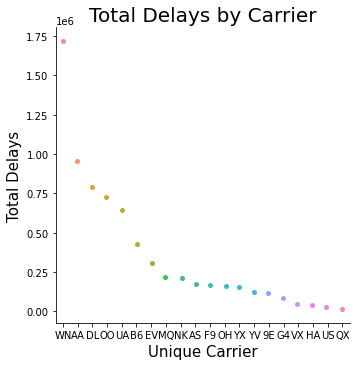

In [0]:
delays_by_carrier = clean_airlines_df.select('DEP_DEL15','OP_UNIQUE_CARRIER') \
    .groupBy(F.col('OP_UNIQUE_CARRIER')).sum('DEP_DEL15')
df = delays_by_carrier.toPandas()

df3 = df.sort_values('sum(DEP_DEL15)', ascending=False)
sns.catplot(data=df3, x='OP_UNIQUE_CARRIER', y="sum(DEP_DEL15)", split=True)
plt.xlabel('Unique Carrier', size=15)
plt.ylabel('Total Delays', size=15)
plt.title('Total Delays by Carrier', size = 20)
plt.show()

In [0]:
display(delays_by_carrier.withColumnRenamed('sum(DEP_DEL15)', 'TOTAL_DELAYS').sort(F.col('TOTAL_DELAYS').desc()))

OP_UNIQUE_CARRIER,TOTAL_DELAYS
WN,1720994
AA,956847
DL,791884
OO,729431
UA,647350
B6,426074
EV,310521
MQ,215690
NK,210694
AS,173831


###### Barplot of the Weighted % of Delays by Carrier
When take a weighted average of the % of total delays by carrier, we see that our prior absolute-based hypothesis was true. Despite Southwest high percentange of total flights, the carrier still had the most flight delays as a % of total flights while Horizon Air had the least. The top and bottom three carriers from a delay perspective remained the same.

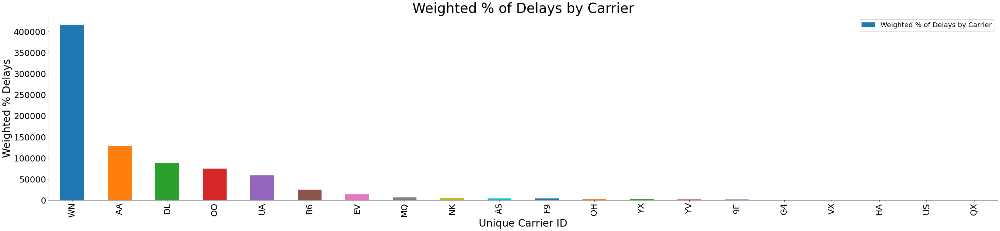

In [0]:
df['% of Total Flights'] = df['sum(DEP_DEL15)'] / df['sum(DEP_DEL15)'].sum()
df['Weighted % of Delays by Carrier'] = df['% of Total Flights'] * df['sum(DEP_DEL15)']

df.sort_values('Weighted % of Delays by Carrier', ascending=False).plot.bar(x='OP_UNIQUE_CARRIER', y='Weighted % of Delays by Carrier', figsize=(50,10), color=sns.color_palette("tab10")
, fontsize=25)
plt.xlabel('Unique Carrier ID', size=30)
plt.ylabel('Weighted % Delays', size=30)
plt.title('Weighted % of Delays by Carrier', size = 40)
plt.legend(prop={'size':20})
plt.show()

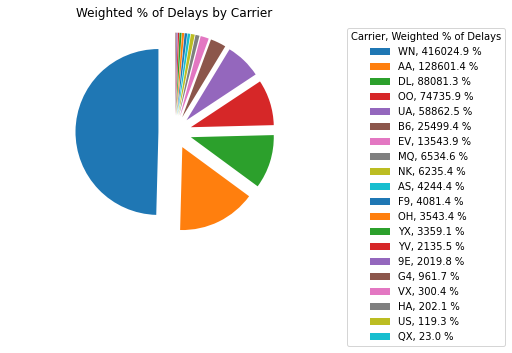

In [0]:
df = df.sort_values('Weighted % of Delays by Carrier', ascending=False)
labels = df['OP_UNIQUE_CARRIER']
sizes = df['Weighted % of Delays by Carrier']
explode = (.2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2, .2)

labels = ['%s, %1.1f %%' % (l,s) for l, s in zip(labels, sizes)]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode = explode, shadow=False, startangle=90)
ax1.axis('equal')
fig1=plt.gcf()
plt.legend(labels=labels, title="Carrier, Weighted % of Delays", bbox_to_anchor=(1,1))
plt.title("Weighted % of Delays by Carrier")
plt.show()

###### Top 10 Delayed Flights by Tail Number

When we examine the results of the number of delays by tail number, we find that tail numbers N262SY, N241SY, and N264SY had the largest percentage of flights delayed. Interestingly, when we researched the most common carriers with these tail numbers, we learned that the results jived with our two of our top three carriers, which had the most delays namely, SkyWest and Delta Airlines.

In [0]:
total_delays = clean_airlines_df.agg({'DEP_DEL15': 'sum'}).rdd.map(lambda x: x[0]).collect()[0]

delays_by_tail = clean_airlines_df.select('DEP_DEL15', 'TAIL_NUM') \
    .groupBy(delays_by_tail['TAIL_NUM']).sum('DEP_DEL15') \
    .withColumnRenamed("sum(DEP_DEL15)", "TOTAL_DEP_DEL15") \
    .withColumn('PERC_DELAY_FLIGHTS', F.col('TOTAL_DEP_DEL15') / F.lit(total_delays))

display(delays_by_tail.sort(F.col('PERC_DELAY_FLIGHTS').desc()))
# df_2 = delays_by_tail_2.toPandas()
# df_2['% of Delayed Flights'] = df_2['sum(DEP_DEL15)'] / df_2['sum(DEP_DEL15)'].sum()

# df_2.sort_values('% of Delayed Flights', ascending=False).head(10)

TAIL_NUM,TOTAL_DEP_DEL15,PERC_DELAY_FLIGHTS
N969WN,2908,4.084651738491269E-4
N962WN,2885,4.052345345786558E-4
N924WN,2830,3.975090928449206E-4
N948WN,2827,3.970877051139896E-4
N274WN,2818,3.9582354192119656E-4
N945WN,2816,3.9554261676724256E-4
N949WN,2811,3.948403038823575E-4
N265WN,2803,3.937166032665415E-4
N258WN,2800,3.932952155356105E-4
N272WN,2793,3.9231197749677147E-4


In [0]:
df_2.sort_values('Weighted Delays by Tail Number', ascending=False).head(10)

TAIL_NUM,TOTAL_DEP_DEL15,PERC_DELAY_FLIGHTS,WEIGHTED_DELAYS
N299SW,0,0.0,0.0
ALL,0,0.0,0.0
N027JB,0,0.0,0.0
N017JB,0,0.0,0.0
N8LNAA,0,0.0,0.0
Q38143,0,0.0,0.0
N002JB,0,0.0,0.0
N16151,0,0.0,0.0
N301YV,0,0.0,0.0
N016JB,1,1.4046257697700375E-7,1.4046257697700375E-7


###### Correlation Matrix

In order to better understand our data, we created a correlation matrix between each variable. The string data type columns were transformed into integers in order to calculate Pearson's correlation matrix. We can see a dark blue diagonal line which indicates that each column is perfectly correlated with itself. Origin and destination airports are highly correlated with its respective state and airport code. The correlated fields such as `ORIGIN_AIRPORT_ID` and `DEST_AIRPORT_ID` are used to join on other datasets and will be dropped later. Additionally, `CRS_DEP_TIME` and `CRS_ARR_TIME` are highly correlated since the two times should be somewhat close together. If these two times were not correlated, then we would expect most of the flights to be delayed.

In [0]:
def plot_correlation_matrix(df, method='pearson', title="Correlation Matrix"):
    '''
    Plots the heatmap of the correlation matrix
    '''
    from pyspark.mllib.stat import Statistics
    import pandas as pd
    from pyspark.ml import Pipeline
    from pyspark.ml.feature import StringIndexer
    
    # Creates a new column with factorized string columns ending in "_INDEX"
    print("Creating factorized string columns")
    indexers = [StringIndexer(inputCol=c, outputCol=c+"_INDEX").fit(df) for c in df.columns if (df.schema[c].dataType == T.StringType())]
    
    # Drops string columns
    print("Applying factorized string columns and dropping original")
    string_cols = [c for c in df.columns if (df.schema[c].dataType == T.StringType())]
    pipeline = Pipeline(stages=indexers)
    factorized_df = pipeline.fit(df).transform(df).drop(*string_cols)

    # Calculates correlation matrix
    print("Calculating correlation Matrix")
    factorized_rdd = factorized_df.rdd.map(lambda row: row[0:])
    corr_mat = Statistics.corr(factorized_rdd, method=method)
    corr_mat_df = pd.DataFrame(corr_mat,
                    columns=factorized_df.columns, 
                    index=factorized_df.columns)
    
    # Plot correlation matrix in seaborn
    plt.subplots(figsize=(10,10))  
    plt.title(title)
    ax = sns.heatmap(
        corr_mat_df, 
        vmin=-1, vmax=1, center=0,
        cmap=sns.diverging_palette(20, 220, n=200),
        square=True
    )
    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation=90,
        horizontalalignment='right'
    );
    return corr_mat_df

Creating factorized string columns
Applying factorized string columns and dropping original
Calculating correlation Matrix


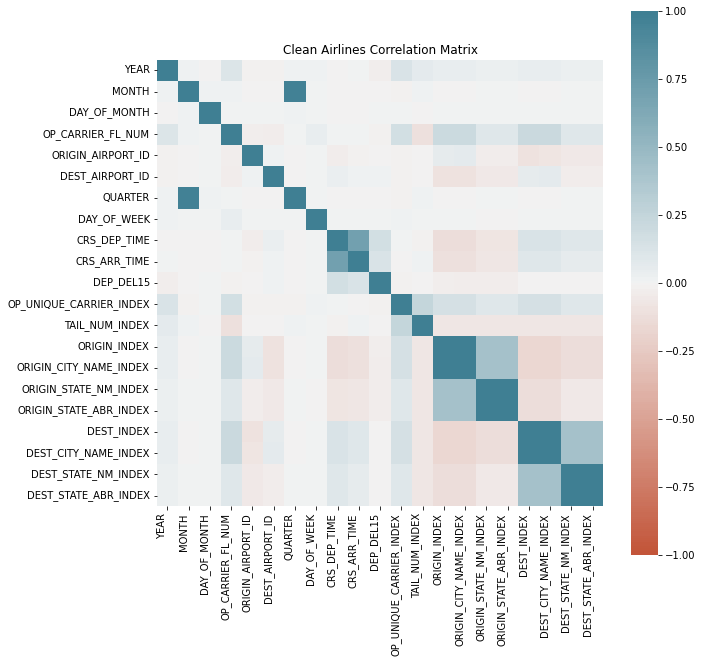

In [0]:
_ = plot_correlation_matrix(clean_airlines_df, title="Clean Airlines Correlation Matrix")

In [0]:
clean_airlines_df.write.mode("overwrite").parquet(f"{blob_url}/clean_airlines_4")

#### Stations

##### Data Description

 Each record of the stations dataset is an edge between two stations. The unique identifier of weather station is `station_id` whereas airport is `neighbor_id`. We can also see that the relationship is many to many. For a given `station_id` and `neighbor_id` we've displayed below, we see multiple stations connected to it, and even to itself. However, there are no guarantees that a station-to-station relationship goes both ways. For example, in the picture below, there are many bidirectional arrows, but it's possible where one station (Station B) can see the other (Station F). Stations also don't necessarily also need to point to each other, like Station A and Station D.

<img src="https://github.com/sysung/w261-final-project/blob/master/full_workflow_pipeline-Page-2.drawio.png?raw=true" width=50%>

Other than the ids, each record also contains the latitude, longitude, and other geographic information about both stations. There is also a distance between two stations which can be useful in finding the nearest station

In [0]:
display(raw_stations_df.filter(F.col('station_id')==69002093218))

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690020,93218,69002093218,36.0,-121.233,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,55.73024537916726
690020,93218,69002093218,36.0,-121.233,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,255.49106220353934
690020,93218,69002093218,36.0,-121.233,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,2750.4353299559803
690020,93218,69002093218,36.0,-121.233,70045027512,LONELY,AK,LNI,70.917,-153.25,2676.3554370627153
690020,93218,69002093218,36.0,-121.233,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,2604.050248854232
690020,93218,69002093218,36.0,-121.233,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,2490.9756094472277
690020,93218,69002093218,36.0,-121.233,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,2568.180281844432
690020,93218,69002093218,36.0,-121.233,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,2254.5584891291946
690020,93218,69002093218,36.0,-121.233,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,2743.6881828292408


In [0]:
display(raw_stations_df.filter(F.col('neighbor_id')==6900209321869002093218))

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690070,93217,69007093217,36.683,-121.767,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,55.73024537916726
690140,93101,69014093101,33.667,-117.733,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,255.49106220353934
700271,27506,70027127506,71.333,-156.65,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,2750.4353299559803
700450,27512,70045027512,70.917,-153.25,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,2676.3554370627153
700630,27403,70063027403,70.5,-149.883,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,2604.050248854232
700635,26465,70063526465,68.479,-149.49,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,2490.9756094472277
700636,27405,70063627405,70.25,-148.333,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,2568.180281844432
701046,26418,70104626418,65.567,-144.765,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,2254.5584891291946
701195,26625,70119526625,66.25,-166.089,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,2743.6881828292408


The raw dataset contains 5,004,169 rows and 12 columns, so we can expect multiple duplicate stations.

In [0]:
print(f"Raw Stations Row Count: {raw_stations_df.count()}")
print(f"Raw Stations Column Count: {len(raw_stations_df.columns)}")

Raw Stations Row Count: 5004169
Raw Stations Column Count: 12


##### Station Distance to Neighbor
Within this dataframe, logically, we found that the station’s `distance_to_neighbor` would be the most important feature to clean our dataset, given that the closer a station is to an airport in proximity, the higher likelihood that the weather forecast/data is accurate. Since incremental weather chagnes can impact flight delays, we decided to run a groupBy on states and measure each station’s average distance to neighbor, expecting more remote states to be farther away from stations. 

The chart confirmed our expectations around more remote stations in states such as Hawaii, Alaska, and the Virgin Islands having further average distances to neighbors.

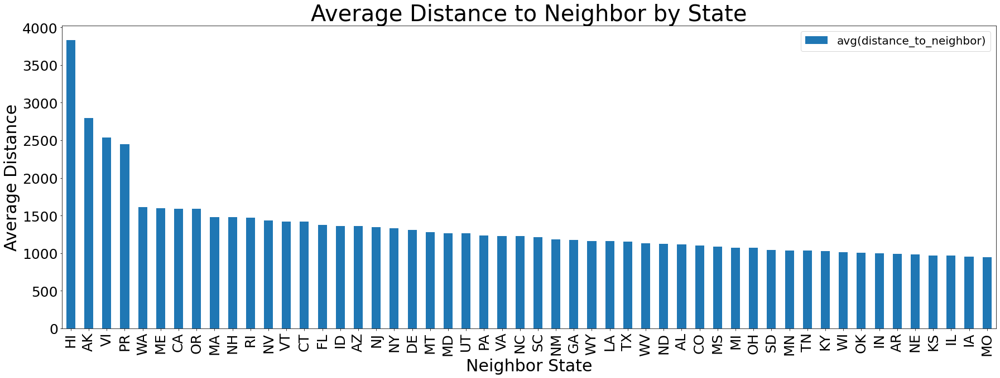

In [0]:
dist_by_state = raw_stations_df.select('distance_to_neighbor', 'neighbor_state')
df_by_state = dist_by_state.groupBy(dist_by_state['neighbor_state']).mean('distance_to_neighbor')

df_by_state.toPandas().sort_values('avg(distance_to_neighbor)', ascending=False).plot.bar(x='neighbor_state', y='avg(distance_to_neighbor)', figsize=(30,10), ylabel = 'Distance', xlabel = 'Neighbor State', title='Average Distance to Neighbor by State', fontsize=25)
plt.xlabel('Neighbor State', size=30)
plt.ylabel('Average Distance', size=30)
plt.title('Average Distance to Neighbor by State', size = 40)
plt.legend(prop={'size':20})
plt.show()

##### Duplicate Stations

With almost 5 million rows, we can see that there is a high possibility that there are duplicate stations. Since each row represents an edge between stations, there is a possibility that a station can point to numerous airports and vice versa. To ensure that each row is distinct such that each station only contains a unique airport, we decided to use the closest airport distance to station using a window function.

In [0]:
w3 = Window.partitionBy("neighbor_call").orderBy(F.col("distance_to_neighbor").asc())
clean_stations_df = raw_stations_df.withColumn("row", F.row_number().over(w3)) \
                              .filter(F.col("row") == 1).drop("row")

In [0]:
display(clean_stations_df)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
724076,13724,72407613724,39.379,-74.424,72407613724,ATLANTIC CITY (CGS),NJ,ATLN,39.379,-74.424,0.0
703920,25317,70392025317,55.483,-133.15,70392025317,CRAIG SEAPLANE,AK,CGA,55.483,-133.15,0.0
726795,24161,72679524161,45.867,-111.967,72679524161,WHITEHALL,MT,HIA,45.867,-111.967,0.0
724370,93823,72437093823,39.45,-87.3,72437093823,TERRE HAUTE HULMAN REGIONAL A,IN,HUF,39.45,-87.3,0.0
724077,54779,72407754779,41.009,-74.736,72407754779,AEROFLEX-ANDOVER AIRPORT,NJ,K12N,41.009,-74.736,0.0
749483,00394,74948300394,34.147,-83.561,74948300394,JACKSON COUNTY AIRPORT,GA,K19A,34.147,-83.561,0.0
720353,63875,72035363875,36.611,-83.738,72035363875,MIDDLESBORO-BELL COUNTY AIRPO,KY,K1A6,36.611,-83.738,0.0
742078,64773,74207864773,43.779,-71.754,74207864773,PLYMOUTH MUNICIPAL AIRPORT,NH,K1P1,43.779,-71.754,0.0
722031,63839,72203163839,34.269,-86.858,72203163839,FOLSOM FIELD AP,AL,K3A1,34.269,-86.858,0.0
727119,94605,72711994605,46.617,-69.533,72711994605,CLAYTON LAKE,ME,K40B,46.617,-69.533,0.0


##### Summary Statistic
After the cleaning of the dataframe, we are left with 2,229 rows which greatly reduces the complexity of our joins

In [0]:
print(f"Clean Stations Row Count: {clean_stations_df.count()}")
print(f"Clean Stations Column Count: {len(clean_stations_df.columns)}")

Clean Stations Row Count: 2229
Clean Stations Column Count: 12


##### Null Count

Next, we looked for null values within the dataframe; fortunately, there were no null values contained within the dataframe. We then looked at the dataframe at a high level, using the summarize function to better understand summary statistics of each of the features as is shown below.

We see that the distributions of `lat` and `neighbor_lat` are extremely similar as well as `lon` and `neighbor_lon`. This is expected since stations are located in the United States.

After the removal of duplicate stations, the distance to neighbor is all zero, which means that most of the stations, if not all, are actually pointing to itself.

In [0]:
dbutils.data.summarize(clean_stations_df)

<!DOCTYPE html>

##### Data Dictionary
When performing exploratory data analysis on the raw features of the stations, we first looked at the underlying data including its definition by referencing a data dictionary that we compiled from various sources, which we show below.

Field                | Description                                                                                                                                      | Data Type
-------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------ | ---------
usaf                 | A character string identifying the fixed weather station from the USAF(United States Air Force) Master Station Catalog                           | STRING
wban                 | WBAN(Weather Bureau, Air Force and Navy) is a five-digit station identifier for digital data storage and general station identification purposes | STRING
station_id           | Identifier for the weather station                                                                                                               | STRING
lat                  | Latitude coordinates for the weather station                                                                                                     | DOUBLE
lon                  | Longitude coordinates for the weather station                                                                                                    | DOUBLE
neighbor_id          | Identifier for the airport close to the weather station                                                                                          | STRING
neighbor_name        | Name of the airport close to the weather station                                                                                                 | STRING 
neighbor_state       | State of the airport close to the weather station                                                                                                | STRING 
neighbor_call        | A four-letter alphanumeric code representing the ICAO airport code or location indicator                                                         | STRING 
neighbor_lat         | Latitude coordinates of the airport close to the weather station                                                                                 | DOUBLE
neighbor_lon         | Latitude coordinates of the airport close to the weather station                                                                                 | DOUBLE
distance_to_neighbor |  Distance of the airport to the weather station.                                                                                                 | STRING

In [0]:
clean_stations_df.write.mode("overwrite").parquet(f"{blob_url}/clean_stations_2")

#### Weather

Within the weather dataframe, there were 126 columns and 898,983,399 rows to explore, with features ranging from `STATION` to `HourlyVisibility` and `HourlyWindSpeed`.  The weather data is important for predicting flight delays as pilots cannot always fly safely in inclement weather. In the raw weather data, there are 898,983,399 rows and 124 columns

In [0]:
print(f"Raw Weather Row Count: {raw_weather_df.count()}")
print(f"Raw Weather Column Count: {len(raw_weather_df.columns)}")

Raw Weather Row Count: 898983399
Raw Weather Column Count: 124


##### Feature Selection
After ingesting and profiling the data, we learned that the majority of the columns have missing or null values.  We performed a variety of pre-processing steps including dropping data that had null values and casting appropriate data types such as integer for columns containing temperature, speed, or direction and double for `latitude`, `longitude`, `elevation`, `HourlyAltimeterSetting`, `HourlySeaLevelPressure`, `HourlyStationPressue`, and `HourlyVisibility`.  The columns with at least 70% missing or null values were excluded from the dataset because we still had plenty of weather statistics post-exclusion.

Additional fields we decided to drop were monthly, daily, and backup features because these features did not give us the amount of granularity that we needed in our analysis. This allowed us to drop numerous features while maintaining a the same information.

In [0]:
weather_cols = [
    "STATION",
    "DATE",
    "LATITUDE",
    "LONGITUDE",
    "ELEVATION",
    "NAME",
    "REPORT_TYPE",
    "SOURCE",
    "HourlyAltimeterSetting",
    "HourlyDewPointTemperature",
    "HourlyDryBulbTemperature",
    "HourlyRelativeHumidity",
    "HourlySkyConditions",
    "HourlyStationPressure",
    "HourlyVisibility",
    "HourlyWetBulbTemperature",
    "HourlyWindDirection",
    "HourlyWindSpeed"
]

clean_weather_df = raw_weather_df \
    .select(weather_cols) \
    .withColumn("HourlyDewPointTemperature", F.col("HourlyDewPointTemperature").cast(T.DoubleType())) \
    .withColumn("HourlyDryBulbTemperature", F.col("HourlyDryBulbTemperature").cast(T.DoubleType())) \
    .withColumn("HourlyRelativeHumidity", F.col("HourlyRelativeHumidity").cast(T.DoubleType())) \
    .withColumn("HourlyWetBulbTemperature", F.col("HourlyWetBulbTemperature").cast(T.DoubleType())) \
    .withColumn("HourlyWindDirection", F.col("HourlyWindDirection").cast(T.DoubleType())) \
    .withColumn("HourlyWindSpeed", F.col("HourlyWindSpeed").cast(T.DoubleType())) \
    .withColumn("LATITUDE", F.col("LATITUDE").cast(T.DoubleType())) \
    .withColumn("LONGITUDE", F.col("LONGITUDE").cast(T.DoubleType())) \
    .withColumn("ELEVATION", F.col("ELEVATION").cast(T.DoubleType())) \
    .withColumn("HourlyAltimeterSetting", F.col("HourlyAltimeterSetting").cast(T.DoubleType())) \
    .withColumn("HourlyStationPressure", F.col("HourlyStationPressure").cast(T.DoubleType())) \
    .withColumn("HourlyVisibility", F.col("HourlyVisibility").cast(T.DoubleType())) \
    .na.drop("any") \
    .distinct()

In [0]:
display(clean_weather_df)

STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyRelativeHumidity,HourlySkyConditions,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed
72418013781,2020-01-03T07:51:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-15,7,29.82,43.0,45.0,93.0,OVC:08 4,29.73,5.0,44.0,120.0,3.0
72418013781,2020-02-14T02:51:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-15,7,30.04,27.0,37.0,67.0,CLR:00,29.96,10.0,33.0,290.0,10.0
72418013781,2020-02-19T05:51:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-15,7,30.19,27.0,44.0,51.0,OVC:08 100,30.1,10.0,37.0,330.0,15.0
72418013781,2020-02-19T11:51:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-15,7,30.3,21.0,47.0,36.0,CLR:00,30.22,10.0,37.0,300.0,13.0
72418013781,2020-02-24T03:51:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-15,7,30.07,24.0,27.0,89.0,CLR:00,29.98,7.0,26.0,330.0,5.0
72418013781,2020-01-08T09:29:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-16,7,30.02,31.0,35.0,85.0,SCT:04 8 OVC:08 65,29.93,9.0,33.0,250.0,24.0
72418013781,2020-01-13T08:58:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-16,7,30.39,37.0,44.0,76.0,BKN:07 25 OVC:08 32,30.3,10.0,41.0,50.0,8.0
72418013781,2020-01-21T05:51:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-15,7,30.47,5.0,17.0,59.0,CLR:00,30.38,10.0,14.0,310.0,7.0
72418013781,2020-02-12T23:49:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-16,7,29.95,36.0,37.0,93.0,FEW:02 5 OVC:08 23,29.86,2.5,37.0,140.0,8.0
72418013781,2020-02-21T03:51:00,39.6744,-75.60567,24.1,"WILMINGTON NEW CASTLE CO AIRPORT, DE US",FM-15,7,30.47,8.0,23.0,53.0,CLR:00,30.38,10.0,19.0,360.0,8.0


The pre-processing and cleaning of the dataframe brought our total rough count down to 215,666,248 with 18 columns.

In [0]:
print(f"Clean Weather Row Count: {clean_weather_df.count()}")
print(f"Clean Weather Column Count: {len(clean_weather_df.columns)}")

Clean Weather Row Count: 215666248
Clean Weather Column Count: 18


##### Data Dictionary
We have created a data dictionary from our subsetted features that we deemed useful in our analysis.

Field                     | Description                                                        | Data Type 
------------------------- | ------------------------------------------------------------------ | ---------
STATION                   | Identifier for the weather station                                 | STRING
DATE                      | Date of the when the data is pulled                                | STRING
LATITUDE                  | Latitude coordinates of the weather station                        | DOUBLE 
LONGITUDE                 |  Longitude coordinates of the weather station                      | DOUBLE
ELEVATION                 | Elevation of the weather station                                   | DOUBLE
NAME                      | Name of the weather station                                        | STRING
REPORT_TYPE               | The code that denotes the type of geophysical surface observation  | STRING
SOURCE                    | Code for weather station                                           | STRING
HourlyAltimeterSetting    | Altimeter Setting Value                                            | DOUBLE
HourlyDewPointTemperature | Dew Point Temperature of the weather station at a particular date. | DOUBLE
HourlyDryBulbTemperature  | Dry Bulb Temperature of the weather station at a particular date.  | DOUBLE
HourlyRelativeHumidity    | Relative Humidity of the weather station at a particular date.     | DOUBLE
HourlySkyConditions       | Description of sky conditions at a particular date                 | DOUBLE
HourlyStationPressure     | Station Pressure of the weather station at a particular date.      | DOUBLE
HourlyVisibility          | Visibility of the weather station at a particular date.            | DOUBLE
HourlyWetBulbTemperature  | Wet Bulb Temperature of the weather station at a particular date.  | DOUBLE
HourlyWindDirection       | Wind Direction of the weather station at a particular date.        | DOUBLE
HourlyWindSpeed           | Wind Speed of the weather station at a particular date.            | DOUBLE

##### Summary Statistic

We then took a look at the summary statistics of the clean dataframe. We show a sample of the summary statistics below, but the full statistics can be found in the Weather EDA databricks notebook.

In [0]:
dbutils.data.summarize(clean_weather_df)

<!DOCTYPE html>

We then found the number of statistics for the weather by year to ensure that each year had a roughly similar level of data, using the groupBy, count, and orderBy functions. The below table allowed us to visually find that each year had around 33 million to 35 million weather points.

In [0]:
display(clean_weather_df \
        .withColumn("YEAR", F.split(F.col("DATE"), '-').getItem(0)) \
        .groupBy("YEAR").count().orderBy("YEAR"))

YEAR,count
2015,32058851
2016,31249286
2017,30818007
2018,30738007
2019,30164825
2020,30728376
2021,29908896


Output can only be rendered in Databricks

In [0]:
clean_weather_df.write.mode("overwrite").parquet(f"{blob_url}/clean_weather_2")

### Join

To train our model with the data, we require to join all of the tables which are airlines, stations, and weather. Since doing a full join on all of the data would create an extremely large dataset, we decided to look at a point-in-time weather reading at the departure and arrival times of the designated airport.

After the joins, each record of our final dataframe will represent a weather reading of a flight between the origin and destination airport where each flight will have information about its geographic location and weather data.

#### Preprocessing

However, before we join all of the tables together, we have to apply a number of preprocessing steps on each table such as formatting timezones and airport ids so that we can easily join on their corresponding fields.

##### Station to Airport ID
To join the stations data with airlines, it needs a common key between the datasets. We have identified that stations contained a field called `neighbor_call` which contains the airport id within the last three characters. We used this information to reformat `neighbor_call` with just the necessary letters so that it can join on the airlines dataframe.

The most important pieces of information are not the original stations but rather the neighbors associated with it. Therefore, we've only selected the neighbor stations and renamed it with a `STATION_` prefix. These stations will join into the airlines dataset twice since we'll require the weather data at both origin and destination airports.

In [0]:
join_stations_df = clean_stations_df.withColumn("neighbor_call", F.col("neighbor_call").substr(-3,3)) \
    .select(
        F.col("neighbor_id").alias("STATION_ID"),
        F.col("neighbor_name").alias("STATION_NAME"),
        F.col("neighbor_state").alias("STATION_STATE"),
        F.col("neighbor_call").alias("STATION_CALL"),
        F.col("neighbor_lat").alias("STATION_LAT"),
        F.col("neighbor_lon").alias("STATION_LON")
    )

In [0]:
display(join_stations_df)
print(f"Number of unique stations: {join_stations_df.count()}")

STATION_ID,STATION_NAME,STATION_STATE,STATION_CALL,STATION_LAT,STATION_LON
72090900300,STANLEY MUNICIPAL AIRPORT,ND,8D,48.301,-102.406
72038500419,BERTHOUD PASS,CO,CO,39.8,-105.766
72036163870,FLORALA MUNI,AL,J4,31.043,-86.312
72659014929,ABERDEEN REGIONAL AIRPORT,SD,ABR,45.443,-98.413
72094800328,JIMMY CARTER REGIONAL AIRPORT,GA,ACJ,32.11,-84.189
72039400428,DEXTER B FLORENCE MEMORIAL FI,AR,ADF,34.1,-93.066
72355593940,ARDMORE MUNICIPAL AIRPORT,OK,ADM,34.3,-97.017
74531093065,USAF ACADEMY AIRSTRIP AIRPORT,CO,AFF,38.967,-104.817
72563524044,ALLIANCE MUNICIPAL AIRPORT,NE,AIA,42.057,-102.802
72026563833,THOMAS C RUSSELL FLD ARPT,AL,ALX,32.915,-85.963


Number of unique stations: 2229


##### Timezone Format
In order to join on the weather data, we needed to create a uniform standard for time since airlines data was local timezone whereas weather data was UTC timezone. Therefore, we required the timezone of the airport which we grabbed from an open source file. The conversion was applied to `CRS_DEP_TIME` and `DEP_TIME`. Then, we created a unix timestamp from the UTC datetime timestamp to make date ranges easier to calculate. The `EARLY_LIMIT` and `LATE_LIMIT` fields are used to limit the number of joins and increase efficiency.

It is also important to note that we are keeping the local timezone in the final join since time relative to timezone can be correlated with peak traffic.

Here is the data dictionary of the additional fields for the airlines dataframe.
Field                 | Description                                                                                                   | Data Type
--------------------- | ------------------------------------------------------------------------------------------------------------- | ---------
ORIGIN_TIMEZONE       | Timezone of Origin Airport                                                                                    | STRING
DEST_TIMEZONE         | Timezone of Destination Airport                                                                               | STRING
UNIX_CRS_DEP_TIME_UTC | Unix timestamp of expected departure time in UTC                                                              | INTEGER
UNIX_CRS_ARR_TIME_UTC | Unix timestamp of expected arrival time in UTC                                                                | INTEGER
EARLY_LIMIT           | Unix timestamp 0.5 hours prior of CRS Departure Time                                                            | INTEGER
LATE_LIMIT            | Unix timestamp 0.5 hour after CRS Departure Time                                                                | INTEGER
WEATHER_DEP_DIFF_TIME | Represents a custom field we created, which is the difference between CRS_DEP_TIME and UNIX_WEATHER_TIME from the weather table | INTEGER
FL_DATE               | Date in yyyy-mm-dd format                                                                                     | STRING

For the weather data, we added an additional field to join with the airlines data
Field             | Description                           | Data Type
----------------- | ------------------------------------- | ---------
UNIX_WEATHER_TIME | Unix timestamp of weather time in UTC | INTEGER 
FL_DATE           | Date in yyyy-mm-dd format             | STRING

In [0]:
import requests

# Get airport timezone from url
link = "https://raw.githubusercontent.com/hroptatyr/dateutils/tzmaps/iata.tzmap"
f = requests.get(link)
iata_data = f.text.split("\n")

# Create dictionary of airports to timezone
missing_iata = ["XWA\tAmerica/Chicago"]
iata_rdd = sc.parallelize(iata_data).union(sc.parallelize(missing_iata))
iata_rdd = iata_rdd.map(lambda x: tuple(x.split('\t'))).filter(lambda x: len(x) == 2)
iata_dict_bc = sc.broadcast(dict(iata_rdd.collect()))

In [0]:
# Formats the time with a colon {123 -> 01:23}
def format_time_column(colname):
    return F.regexp_replace(F.format_string("%04d", F.col(colname) % 2400), "(\\d{2})(\\d{2})", "$1:$2")

# Formats the date like FL_DATE (2022-11-11)
def format_date_column():
    return F.concat(F.col("YEAR"), F.lit("-"), F.lpad(F.col("MONTH"), 2, "0"), F.lit("-"), F.lpad(F.col("DAY_OF_MONTH"), 2, "0"))

# Converts the date [yyyy-MM-dd HH:mm:ss] into a unix timestamp
def format_unix_column(colname, timezone):
    return F.unix_timestamp(F.to_utc_timestamp(F.concat(format_date_column(), F.lit(" "), format_time_column(colname)), F.col(timezone)))

# Get timezone
@udf(returnType=T.StringType()) 
def get_timezone(AIRPORT):
    return iata_dict_bc.value[AIRPORT]

In [0]:
early_threshold = 1
late_threshold = 1

join_airlines_df = clean_airlines_df \
    .withColumn("ORIGIN_TIMEZONE", get_timezone(F.col("ORIGIN"))) \
    .withColumn("DEST_TIMEZONE", get_timezone(F.col("DEST"))) \
    .withColumn("UNIX_CRS_DEP_TIME_UTC", format_unix_column("CRS_DEP_TIME", "ORIGIN_TIMEZONE")) \
    .withColumn("UNIX_CRS_ARR_TIME_UTC", format_unix_column("CRS_ARR_TIME", "DEST_TIMEZONE")) \
    .withColumn('ORIGIN_EARLY_LIMIT', F.col("UNIX_CRS_DEP_TIME_UTC") - (early_threshold*1800)) \
    .withColumn('ORIGIN_LATE_LIMIT', F.col("UNIX_CRS_DEP_TIME_UTC") + (late_threshold*1800)) \
    .withColumn('FL_DATE', format_date_column())

join_weather_df = clean_weather_df.withColumn('DATE', F.regexp_replace('DATE', 'T', ' ')) \
    .withColumn("UNIX_WEATHER_TIME", F.unix_timestamp(F.col("DATE"),"yyyy-MM-dd HH:mm:ss")) \
    .withColumn('DATE', F.split(F.col('DATE'), ' ').getItem(0))

#### Join Process
We took a two-pronged approach to joining our data by splitting the airlines dataset into a dataframe with origin airport and another with destination airport. We take the two airline tables and join them with stations and weather data to add more information about the two airports. If we did not split the dataset but rather continually joined datasets one after another, we would require joins that make the data larger than necessary; this would result in massive performance overhead. 

To ensure that the join on the split dataframes maintains the same information through the process, we decided to use primary keys which are used in the separated dataframes. These primary keys will be the same set of fields as the ones from the airlines EDA with additional fields. When we finish applying the joins to each individual dataframe, we can do an inner join back together.

A diagram of the join process can be shown below

<img src="https://github.com/sysung/w261-final-project/blob/master/join_strategy.png?raw=true" width=80%>

In [0]:
primary_keys = [
    "DEP_DEL15",
    "YEAR",
    "QUARTER",
    "MONTH",
    "DAY_OF_MONTH",
    "DAY_OF_WEEK",
    "FL_DATE",
    "OP_UNIQUE_CARRIER",
    "TAIL_NUM",
    "OP_CARRIER_FL_NUM",
    "ORIGIN_AIRPORT_ID",
    "DEST_AIRPORT_ID"
]

display(join_airlines_df.groupBy(primary_keys).count().sort(F.col("count").desc()).filter(F.col("count")>1))

DEP_DEL15,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,count


In [0]:
print(f"Airlines Dataframe dimension: {join_airlines_df.count()} x {len(join_airlines_df.columns)}")

Airlines Dataframe dimension: 41531221 x 28


##### Airlines Setup

We begin by setting up our airlines dataframe with the fields necessary to join the other dataframes. We've created primary keys and split apart the dataframe into origin airport and destination airport dataframes. This will be the starting point of our two-pronged join. We've also added `DEST_DATE` to the destination airlines dataframe since it is possible for origin and desintation airports to have different dates based on timezone. `DEST_EARLY_LIMIT` and `DEST_LATE_LIMIT` act similarly to the origin field counterpart

In [0]:
origin_fields = [
    "ORIGIN",
    "ORIGIN_CITY_NAME",
    "ORIGIN_STATE_NM",
    "ORIGIN_STATE_ABR",
    "ORIGIN_TIMEZONE",
    "CRS_DEP_TIME",
    "UNIX_CRS_DEP_TIME_UTC",
    "ORIGIN_EARLY_LIMIT",
    "ORIGIN_LATE_LIMIT"
]

dest_fields = [
    "DEST",
    "DEST_CITY_NAME",
    "DEST_STATE_NM",
    "DEST_STATE_ABR",
    "CRS_ARR_TIME",
    "DEST_TIMEZONE",
    "UNIX_CRS_ARR_TIME_UTC"
]

origin_airlines_df = join_airlines_df.select(primary_keys + origin_fields)
dest_airlines_df = join_airlines_df.select(primary_keys + dest_fields) \
    .withColumn("DEST_DATE", F.from_unixtime(F.col("UNIX_CRS_ARR_TIME_UTC"), 'yyyy-MM-dd')) \
    .withColumn("DEST_EARLY_LIMIT", F.col("UNIX_CRS_ARR_TIME_UTC") - (early_threshold *1800)) \
    .withColumn("DEST_LATE_LIMIT", F.col("UNIX_CRS_ARR_TIME_UTC") + (late_threshold*1800))

We expect the count of both of the dataframes to be equal because we are only splitting the dataframe by column, so we're not adding any new rows.

In [0]:
print(f"Origin Dataframe dimension: {origin_airlines_df.count()} x {len(origin_airlines_df.columns)}")
print(f"Destination Dataframe dimension: {dest_airlines_df.count()} x {len(dest_airlines_df.columns)}")

Origin Dataframe dimension: 41531221 x 21
Destination Dataframe dimension: 41531221 x 22


##### Station Join
Once we've split the dataframes, we can join on the stations dataframes

In [0]:
origin_stations_df = join_stations_df.select(
    F.col("STATION_ID").alias("ORIGIN_STATION_ID"),
    F.col("STATION_NAME").alias("ORIGIN_STATION_NAME"),
    F.col("STATION_STATE").alias("ORIGIN_STATION_STATE"),
    F.col("STATION_CALL").alias("ORIGIN_STATION_CALL"),
    F.col("STATION_LAT").alias("ORIGIN_STATION_LAT"),
    F.col("STATION_LON").alias("ORIGIN_STATION_LON")
)

dest_stations_df = join_stations_df.select(
    F.col("STATION_ID").alias("DEST_STATION_ID"),
    F.col("STATION_NAME").alias("DEST_STATION_NAME"),
    F.col("STATION_STATE").alias("DEST_STATION_STATE"),
    F.col("STATION_CALL").alias("DEST_STATION_CALL"),
    F.col("STATION_LAT").alias("DEST_STATION_LAT"),
    F.col("STATION_LON").alias("DEST_STATION_LON")
)

origin_join_df1 = origin_airlines_df.join(
    origin_stations_df,
    (origin_airlines_df.ORIGIN == origin_stations_df.ORIGIN_STATION_CALL) & \
    (origin_airlines_df.ORIGIN_STATE_ABR == origin_stations_df.ORIGIN_STATION_STATE)
)

dest_join_df1 = dest_airlines_df.join(
    dest_stations_df,
    (dest_airlines_df.DEST == dest_stations_df.DEST_STATION_CALL) & \
    (dest_airlines_df.DEST_STATE_ABR == dest_stations_df.DEST_STATION_STATE)
)

Similarly, the two dataframes should have equal row counts because we are only adding the stations dataframe and each record of the airlines dataframe can have one station. However, we can see that the number of rows dropped by around 700,000 in both dataframes, which means that there are airports in the airlines dataframe that didn't exist in the stations dataframe

In [0]:
print(f"Origin Dataframe dimension after station join: {origin_join_df1.count()} x {len(origin_join_df1.columns)}")
print(f"Destination Dataframe dimension after station join: {dest_join_df1.count()} x {len(dest_join_df1.columns)}")

Origin Dataframe dimension after station join: 40732647 x 27
Destination Dataframe dimension after station join: 40730599 x 28


##### Weather Join
Next, we join our currently joined dataframes with the weather dataframe within a timeframe depending on if it's an origin or destination dataframe. We apply a windowing function to get the weather point closest to the departure and arrival times of each flight.

In [0]:
origin_weather_df = join_weather_df.select(
    F.col("STATION").alias("ORIGIN_STATION"),
    F.col("DATE").alias("ORIGIN_DATE"),
    F.col("UNIX_WEATHER_TIME").alias("ORIGIN_UNIX_WEATHER_TIME"),
    F.col("ELEVATION").alias("ORIGIN_ELEVATION"),
    F.col('HourlyAltimeterSetting').alias("ORIGIN_HOURLY_ALTIMETER_SETTING"),
    F.col('HourlyDewPointTemperature').alias("ORIGIN_HOURLY_DEW_POINT_TEMP"),
    F.col('HourlyDryBulbTemperature').alias('ORIGIN_HOURLY_DRY_BULB_TEMP'),
    F.col('HourlyRelativeHumidity').alias('ORIGIN_HOURLY_RELATIVE_HUMIDITY'),
    F.col('HourlyStationPressure').alias('ORIGIN_HOURLY_STATION_PRESSURE'),
    F.col('HourlyVisibility').alias('ORIGIN_HOURLY_VISIBILITY'),
    F.col('HourlyWetBulbTemperature').alias('ORIGIN_HOURLY_WET_BULB_TEMP'),
    F.col('HourlyWindDirection').alias('ORIGIN_HOURLY_WIND_DIRECTION'),
    F.col('HourlyWindSpeed').alias('ORIGIN_HOURLY_WIND_SPEED'),
    F.col('REPORT_TYPE').alias('ORIGIN_REPORT_TYPE'),
    F.col('SOURCE').alias('ORIGIN_SOURCE')
)

dest_weather_df = join_weather_df.select(
    F.col("STATION").alias("DEST_STATION"),
    F.col("DATE").alias("DEST_WTH_DATE"),
    F.col("UNIX_WEATHER_TIME").alias("DEST_UNIX_WEATHER_TIME"),
    F.col("ELEVATION").alias("DEST_ELEVATION"),
    F.col('HourlyAltimeterSetting').alias("DEST_HOURLY_ALTIMETER_SETTING"),
    F.col('HourlyDewPointTemperature').alias("DEST_HOURLY_DEW_POINT_TEMP"),
    F.col('HourlyDryBulbTemperature').alias('DEST_HOURLY_DRY_BULB_TEMP'),
    F.col('HourlyRelativeHumidity').alias('DEST_HOURLY_RELATIVE_HUMIDITY'),
    F.col('HourlyStationPressure').alias('DEST_HOURLY_STATION_PRESSURE'),
    F.col('HourlyVisibility').alias('DEST_HOURLY_VISIBILITY'),
    F.col('HourlyWetBulbTemperature').alias('DEST_HOURLY_WET_BULB_TEMP'),
    F.col('HourlyWindDirection').alias('DEST_HOURLY_WIND_DIRECTION'),
    F.col('HourlyWindSpeed').alias('DEST_HOURLY_WIND_SPEED'),
    F.col('REPORT_TYPE').alias('DEST_REPORT_TYPE'),
    F.col('SOURCE').alias('DEST_SOURCE')
)

window_origin_weather = Window.partitionBy(
    *origin_join_df1.columns + ['ORIGIN_WEATHER_DIFF_TIME']
).orderBy(
    F.col('ORIGIN_WEATHER_DIFF_TIME').asc()
)

origin_join_df2 = origin_join_df1.join(
    origin_weather_df,
    (origin_join_df1.ORIGIN_STATION_ID == origin_weather_df.ORIGIN_STATION) & \
    (origin_join_df1.FL_DATE == origin_weather_df.ORIGIN_DATE),
    "inner"
).filter(
    (origin_weather_df.ORIGIN_UNIX_WEATHER_TIME <= origin_join_df1.ORIGIN_LATE_LIMIT) &
    (origin_weather_df.ORIGIN_UNIX_WEATHER_TIME >= origin_join_df1.ORIGIN_EARLY_LIMIT)
).withColumn(
    'ORIGIN_WEATHER_DIFF_TIME',
    F.abs(F.col('ORIGIN_UNIX_WEATHER_TIME') - F.col('UNIX_CRS_DEP_TIME_UTC'))
).withColumn(
    'ROW',
    F.row_number().over(window_origin_weather)
).filter(F.col('ROW')==1).drop('ROW')

window_dest_weather = Window.partitionBy(
    *dest_join_df1.columns + ["DEST_WEATHER_DIFF_TIME"]
).orderBy(
    F.col("DEST_WEATHER_DIFF_TIME").asc()
)

dest_join_df2 = dest_join_df1.join(
    dest_weather_df,
    (dest_join_df1.DEST_STATION_ID == dest_weather_df.DEST_STATION) & \
    (dest_join_df1.DEST_DATE == dest_weather_df.DEST_WTH_DATE),
    "inner"
).filter(
    (dest_weather_df.DEST_UNIX_WEATHER_TIME <= dest_join_df1.DEST_LATE_LIMIT) &
    (dest_weather_df.DEST_UNIX_WEATHER_TIME >= dest_join_df1.DEST_EARLY_LIMIT)
).withColumn(
    "DEST_WEATHER_DIFF_TIME", 
    (F.abs(F.col("DEST_UNIX_WEATHER_TIME") - F.col("UNIX_CRS_ARR_TIME_UTC")))
).withColumn(
    "ROW", 
    F.row_number().over(window_dest_weather)
).filter(F.col("ROW")==1).drop('ROW')

In [0]:
print(f"Origin Dataframe dimension after weather join: {origin_join_df2.count()} x {len(origin_join_df2.columns)}")
print(f"Destination Dataframe dimension after weather join: {dest_join_df2.count()} x {len(origin_join_df2.columns)}")

Origin Dataframe dimension after weather join: 38415078 x 43
Destination Dataframe dimension after weather join: 45920238 x 43


Lastly, we can join back together the origin and destination dataframe based on the primary keys

In [0]:
join_df = origin_join_df2.join(dest_join_df2, primary_keys, 'inner')

In [0]:
print(f"Dimension after final join: {join_df.count()} x {len(join_df.columns)}")

Dimension after final join: 42707345 x 75


A diagram of our joins with primary keys is shown below

<img src="https://github.com/sysung/w261-final-project/blob/master/df_join_strategy.png?raw=true" width=70%>

#### Feature Selection

After joining the tables, we can drop some of the keys that are no longer relevant such as join keys and highly correlated fields. We also renamed some of the fields to be specific to the origin airport and others to be made for the destination airport. Any variable that is not prefixed with `ORIGIN_` or `DEST_` is header/metadata which are variables shared between both airports.

In [0]:
final_df = join_df.select(
    F.col("DEP_DEL15"),
    F.col("OP_UNIQUE_CARRIER"),
    F.col("TAIL_NUM"),
    F.col("OP_CARRIER_FL_NUM"),
    F.col("CRS_DEP_TIME"),
    F.col("UNIX_CRS_DEP_TIME_UTC"),
    F.col("CRS_ARR_TIME"),
    F.col("UNIX_CRS_ARR_TIME_UTC"),
    
    F.col("YEAR").alias("ORIGIN_YEAR"),
    F.col("QUARTER").alias("ORIGIN_QUARTER"),
    F.col("MONTH").alias("ORIGIN_MONTH"),
    F.col("DAY_OF_MONTH").alias("ORIGIN_DAY_OF_MONTH"),
    F.col("DAY_OF_WEEK").alias("ORIGIN_DAY_OF_WEEK"),
    F.col("FL_DATE").alias("ORIGIN_DATE"),
    F.col("ORIGIN_AIRPORT_ID"),
    F.col("ORIGIN_CITY_NAME"),
    F.col("ORIGIN_STATE_NM"),
    F.col("ORIGIN_TIMEZONE"),
    F.col("ORIGIN_STATION"),
    F.col("ORIGIN_STATION_LAT"),
    F.col("ORIGIN_STATION_LON"),
    F.col("ORIGIN_UNIX_WEATHER_TIME"),
    F.col("ORIGIN_ELEVATION"),
    F.col("ORIGIN_HOURLY_ALTIMETER_SETTING"),
    F.col("ORIGIN_HOURLY_DEW_POINT_TEMP"),
    F.col("ORIGIN_HOURLY_DRY_BULB_TEMP"),
    F.col("ORIGIN_HOURLY_RELATIVE_HUMIDITY"),
    F.col("ORIGIN_HOURLY_STATION_PRESSURE"),
    F.col("ORIGIN_HOURLY_VISIBILITY"),
    F.col("ORIGIN_HOURLY_WET_BULB_TEMP"),
    F.col("ORIGIN_HOURLY_WIND_DIRECTION"),
    F.col("ORIGIN_HOURLY_WIND_SPEED"),
    F.col("ORIGIN_REPORT_TYPE"),
    F.col("ORIGIN_SOURCE"),
    
    F.col("DEST_AIRPORT_ID"),
    F.col("DEST_CITY_NAME"),
    F.col("DEST_STATE_NM"),
    F.col("DEST_TIMEZONE"),
    F.col("DEST_STATION"),
    F.col("DEST_STATION_LAT"),
    F.col("DEST_STATION_LON"),
    F.col("DEST_UNIX_WEATHER_TIME"),
    F.col("DEST_ELEVATION"),
    F.col("DEST_HOURLY_ALTIMETER_SETTING"),
    F.col("DEST_HOURLY_DEW_POINT_TEMP"),
    F.col("DEST_HOURLY_DRY_BULB_TEMP"),
    F.col("DEST_HOURLY_RELATIVE_HUMIDITY"),
    F.col("DEST_HOURLY_STATION_PRESSURE"),
    F.col("DEST_HOURLY_VISIBILITY"),
    F.col("DEST_HOURLY_WET_BULB_TEMP"),
    F.col("DEST_HOURLY_WIND_DIRECTION"),
    F.col("DEST_HOURLY_WIND_SPEED"),
    F.col("DEST_REPORT_TYPE"),
    F.col("DEST_SOURCE"),
)

After the feature selection, our row count is 193,950,143 and column count is 52.

In [0]:
print(f"Final Dataframe Dimension: {final_df.count()} x {len(final_df.columns)}")

Final Dataframe Dimension: 42707345 x 54


#### Data Dictionary

The final data dictionary can be shown below. Fields prefixed with `ORIGIN_` are data about the origin airport and `DEST_` are data about the destination airport. Fields that do not contain one of those prefixes are header data which are shared between the flight.

| Field Name                | Description | Data Lineage | Data Type |
| ------------------------- | ----------- | ------------ | --------- |
| `DEP_DEL15`                       | Departure Delay Indicator, 15 Minutes or More (1=Yes)                             | `DEP_DEL15` from Airlines dataframe         | integer   |
| `OP_UNIQUE_CARRIER`               | Unique Carrier Code. When the same code has been used by multiple carriers, a numeric suffix is used for earlier users, for example, PA, PA(1), PA(2). Use this field for analysis across a range of years. | `OP_UNIQUE_CARRIER` from Airlines datafrmae | string    |
| `TAIL_NUM`                        | Tail Number used to identify a specific airplane                                  | `TAIL_NUM` from Airlines dataframe          | string    |
| `OP_CARRIER_FL_NUM`               | Flight Number                                                                     | `OP_CARRIER_FL_NUM` from Airlines dataframe | integer   |
| `CRS_DEP_TIME`                    | CRS or expected departure time (local time: hhmm)                                 | `CRS_DEP_TIME` from Airlines dataframe      | integer   |
| `UNIX_CRS_DEP_TIME_UTC`           | Unix timestamp of expected departure time in UTC                                  | Combined fields of `CRS_DEP_TIME`, `YEAR`, `MONTH`, `DAY_OF_MONTH`, and `TIMEZONE` from Airlines, Stations dataframes, and external dataset for airport to timezone conversion | long |
| `CRS_ARR_TIME`                    | CRS or expected arrival time (local time: hhmm)                                   | `CRS_ARR_TIME` from Airlines dataframe | integer   |
| `UNIX_CRS_ARR_TIME_UTC`           | Unix timestamp of expected arrival time in UTC                                    | Combined fields of `CRS_ARR_TIME`, `YEAR`, `MONTH`, `DAY_OF_MONTH`, and `TIMEZONE` from Airlines, Stations dataframes, and external dataset for airport to timezone conversion| long      |
| `ORIGIN_YEAR`                     | Origin Airport, Year of flight departure                                          | `YEAR` from Airlines dataframe         | integer   |
| `ORIGIN_QUARTER`                  | Origin Airport, Quarter of flight departure                                       | `QUARTER` from Airlines dataframe      | integer   |
| `ORIGIN_MONTH`                    | Origin Airport, Month of flight departure                                         | `MONTH` from Airlines dataframe        | integer   |
| `ORIGIN_DAY_OF_MONTH`             | Origin Airport, Day of month of flight departure                                  | `DAY_OF_MONTH` from Airlines dataframe | integer   |
| `ORIGIN_DAY_OF_WEEK`              | Origin Airport, Day of week of flight departure                                   | `DAY_OF_WEEK` from Airlines dataframe  | integer   |
| `ORIGIN_DATE`                     | Origin Airport, Date of flight departure in yyyy-mm-dd format                     | Formatted date from `YEAR`, `QUARTER`, `DAY_OF_MONTH` from Airlines dataframe| string    |
| `ORIGIN_AIRPORT_ID`               | Origin Airport, Airport ID. An identification number assigned by US DOT to identify a unique airport. Use this field for airport analysis across a range of years because an airport can change its airport code and airport codes can be reused. | `ORIGIN_AIRPORT_ID` from Airlines dataframe | integer   |
| `ORIGIN_CITY_NAME`                | Origin Airport, City Name                                                         | `ORIGIN_CITY_NAME` from Airlines dataframe | string    |
| `ORIGIN_STATE_NM`                 | Origin Airport, State Name                                                        | `ORIGIN_STATE_NM` from Airlines dataframe | string    |
| `ORIGIN_TIMEZONE`                 | Origin Airport, Timezone                                                          | `ORIGIN_STATE_ABR` from Airlines dataframe | string    |
| `ORIGIN_STATION`                  | Origin Airpot, 11-pin Station ID                                                  | `STATION` of origin station from Weather dataframe | string    |
| `ORIGIN_STATION_LAT`              | Origin Airport, Station Latitude                                                  | `STATION_LAT` of origin airport from Stations dataframe | double    |
| `ORIGIN_STATION_LON`              | Origin Airport, Station Latitude                                                  | `STATION_LON` of origin airport from Stations dataframe | double    |
| `ORIGIN_UNIX_WEATHER_TIME`        | Origin Airport, Weather Reading in UNIX TIMESTAMP                                 | `DATE` of departure at origin airport from Weather and Station dataframe join | long      |
| `ORIGIN_ELEVATION`                | Origin Airport, Elevation                                                         | `ELEVATION` of origin station from Weather dataframe | double    |
| `ORIGIN_HOURLY_ALTIMETER_SETTING` | Origin Airport, Hourly Altimeter Setting                                          | `HourlyAltimeterSetting` of origin station from Weather dataframe | double    |
| `ORIGIN_HOURLY_DEW_POINT_TEMP`      | Origin Airport, Hourly Dew Point Temperature                                    | `HourlyDewPointTemperature` of origin station from Weather dataframe| double    |
| `ORIGIN_HOURLY_DRY_BULB_TEMP`       | Origin Airport, Hourly Dry Bulb Temperature                                     | `HourlyDryBulbTemperature` of origin station from Weather dataframe | double    |
| `ORIGIN_HOURLY_RELATIVE_HUMIDITY`   | Origin Airport, Hourly Relative Humidity                                        | `HourlyRelativeHumidity` of origin station from Weather dataframe| double    |
| `ORIGIN_HOURLY_STATION_PRESSURE`    | Origin Airport, Hourly Station Pressure                                         | `HourlyStationPressure` of origin station from Weather dataframe| double    |
| `ORIGIN_HOURLY_VISIBILITY`          | Origin Airport, Hourly Visibility                                               | `HourlyVisibility` of origin station from Weather dataframe| double    |
| `ORIGIN_HOURLY_WET_BULB_TEMP`       | Origin Airport, Hourly Wet Bulb Temperature                                     | `HourlyWetbulbTemperature` of origin station from Weather dataframe| double    |
| `ORIGIN_HOURLY_WIND_DIRECTION`      | Origin Airport, Hourly Wind Direction                                           | `HourlyWindDirection` of origin station from Weather dataframe| double    |
| `ORIGIN_HOURLY_WIND_SPEED`          | Origin Airport, Hourly Wind Speed                                               | `HourlyWindSpeed` of origin station from Weather dataframe| double    |
| `ORIGIN_REPORT_TYPE`                | Origin Airport, Report Type denoting geophysical surface observation type       | `REPORT_TYPE` of origin station from Weather dataframe| string    |
| `ORIGIN_SOURCE`                     | Origin Airport, Source Code for Weather Station                                 | `SOURCE` of origin station from Weather dataframe| string    |
| `DEST_AIRPORT_ID`                   | Destination Airport, Airport ID. An identification number assigned by US DOT to identify a unique airport. Use this field for airport analysis across a range of years because an airport can change its airport code and airport codes can be reused. | `DEST_AIRPORT_ID` from Airlines dataframe| integer   |
| `DEST_CITY_NAME`                    | Destination Airport, City Name                                                  | `DEST_CITY_NAME` from Airlines dataframe | string    |
| `DEST_STATE_NM`                     | Destination Airport, State Name                                                 | `DEST_STATE_NM` from Airlines dataframe  | string    |
| `DEST_TIMEZONE`                     | Destination Airport, Timezone                                                   | `DEST_TIMEZONE` from Airlines dataframe  | string    |
| `DEST_STATION`                      | Destination Airpot, 11-pin Station ID                                           | `STATION` of destination station from Weather dataframe | string    |
| `DEST_STATION_LAT`                  | Destination Airport, Station Latitude                                           | `STATION_LAT` of destination airport from Stations dataframe | double    |
| `DEST_STATION_LON`                  | Destination Airport, Station Latitude                                           | `STATION_LON` of destination airport from Stations dataframe | double    |
| `DEST_UNIX_WEATHER_TIME`            | Destination Airport, Weather Reading in UNIX TIMESTAMP                          | `DATE` of arrival at destination airport from Weather and Station dataframe join| long      |
| `DEST_ELEVATION`                    | Destination Airport, Elevation                                                  | `ELEVATION` of destination station from Weather dataframe | double    |
| `DEST_HOURLY_ALTIMETER_SETTING`     | Destination Airport, Hourly Altimeter Setting                                   | `HourlyAltimeterSetting` of destination station from Weather dataframe | double    |
| `DEST_HOURLY_DEW_POINT_TEMP`        | Destination Airport, Hourly Dew Point Temperature                               | `HourlyDewPointTemperature` of destination station from Weather dataframe | double    |
| `DEST_HOURLY_DRY_BULB_TEMP`         | Destination Airport, Hourly Dry Bulb Temperature                                | `HourlyDryBulbTemperature` of destination station from Weather dataframe| double    |
| `DEST_HOURLY_RELATIVE_HUMIDITY`     | Destination Airport, Hourly Relative Humidity                                   | `HourlyRelativeHumidity` of destination station from Weather dataframe | double    |
| `DEST_HOURLY_STATION_PRESSURE`      | Destination Airport, Hourly Station Pressure                                    | `HourlyStationPressure` of destination station from Weather dataframe| double    |
| `DEST_HOURLY_VISIBILITY`            | Destination Airport, Hourly Visibility                                          | `HourlyVisibility` of destination station from Weather dataframe| double    |
| `DEST_HOURLY_WET_BULB_TEMP`         | Destination Airport, Hourly Wet Bulb Temperature                                | `HourlyWetbulbTemperature` of destination station from Weather dataframe| double    |
| `DEST_HOURLY_WIND_DIRECTION`        | Destination Airport, Hourly Wind Direction                                      | `HourlyWindDirection` of destination station from Weather dataframe| double    |
| `DEST_HOURLY_WIND_SPEED`            | Destination Airport, Hourly Wind Speed                                          | `HourlyWindSpeed` of destination station from Weather dataframe | double    |
| `DEST_REPORT_TYPE`                  | Destination Airport, Report Type denoting geophysical surface observation type  | `REPORT_TYPE` of destination station from Weather dataframe | string    |
| `DEST_SOURCE`                       | Destination Airport, Source Code for Weather Station                            | `SOURCE` of destination station from Weather dataframe| string    |

Altogether, the join took around 4 minutes to display and 7 minutes to write to blob storage on ten 4-core 16-gb worker nodes.

In [0]:
display(final_df)

DEP_DEL15,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,CRS_DEP_TIME,UNIX_CRS_DEP_TIME_UTC,CRS_ARR_TIME,UNIX_CRS_ARR_TIME_UTC,ORIGIN_YEAR,ORIGIN_QUARTER,ORIGIN_MONTH,ORIGIN_DAY_OF_MONTH,ORIGIN_DAY_OF_WEEK,ORIGIN_DATE,ORIGIN_AIRPORT_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_NM,ORIGIN_TIMEZONE,ORIGIN_STATION,ORIGIN_STATION_LAT,ORIGIN_STATION_LON,ORIGIN_UNIX_WEATHER_TIME,ORIGIN_ELEVATION,ORIGIN_HOURLY_ALTIMETER_SETTING,ORIGIN_HOURLY_DEW_POINT_TEMP,ORIGIN_HOURLY_DRY_BULB_TEMP,ORIGIN_HOURLY_RELATIVE_HUMIDITY,ORIGIN_HOURLY_STATION_PRESSURE,ORIGIN_HOURLY_VISIBILITY,ORIGIN_HOURLY_WET_BULB_TEMP,ORIGIN_HOURLY_WIND_DIRECTION,ORIGIN_HOURLY_WIND_SPEED,ORIGIN_REPORT_TYPE,ORIGIN_SOURCE,DEST_AIRPORT_ID,DEST_CITY_NAME,DEST_STATE_NM,DEST_TIMEZONE,DEST_STATION,DEST_STATION_LAT,DEST_STATION_LON,DEST_UNIX_WEATHER_TIME,DEST_ELEVATION,DEST_HOURLY_ALTIMETER_SETTING,DEST_HOURLY_DEW_POINT_TEMP,DEST_HOURLY_DRY_BULB_TEMP,DEST_HOURLY_RELATIVE_HUMIDITY,DEST_HOURLY_STATION_PRESSURE,DEST_HOURLY_VISIBILITY,DEST_HOURLY_WET_BULB_TEMP,DEST_HOURLY_WIND_DIRECTION,DEST_HOURLY_WIND_SPEED,DEST_REPORT_TYPE,DEST_SOURCE
0,AA,N3HVAA,337,1425,1420140300,1605,1420149900,2015,1,1,1,4,2015-01-01,12953,"New York, NY",New York,America/New_York,72503014732,40.779,-73.88,1420141860,3.4,29.99,16.0,38.0,41.0,29.96,10.0,31.0,230.0,15.0,FM-15,7,13930,"Chicago, IL",Illinois,America/Chicago,72530094846,41.995,-87.934,1420149060,201.8,30.11,15.0,26.0,63.0,29.39,10.0,23.0,260.0,9.0,FM-15,7
0,AA,N4YMAA,333,1305,1420139100,1440,1420144800,2015,1,1,1,4,2015-01-01,11298,"Dallas/Fort Worth, TX",Texas,America/Chicago,72259003927,32.898,-97.019,1420139520,170.7,30.22,33.0,35.0,93.0,29.57,6.0,34.0,20.0,7.0,FM-16,7,13256,"Mission/McAllen/Edinburg, TX",Texas,America/Chicago,72250612959,26.184,-98.254,1420145580,30.5,30.15,44.0,46.0,93.0,30.03,2.5,45.0,360.0,7.0,FM-15,7
0,AA,N4YMAA,333,1305,1420139100,1440,1420144800,2015,1,1,1,4,2015-01-01,11298,"Dallas/Fort Worth, TX",Texas,America/Chicago,72259003927,32.898,-97.019,1420139520,170.7,30.22,33.0,35.0,93.0,29.57,6.0,34.0,20.0,7.0,FM-16,7,13256,"Mission/McAllen/Edinburg, TX",Texas,America/Chicago,72250612959,26.184,-98.254,1420143720,30.5,30.14,45.0,46.0,96.0,30.02,2.5,46.0,10.0,6.0,FM-16,7
0,AA,N4YMAA,333,1305,1420139100,1440,1420144800,2015,1,1,1,4,2015-01-01,11298,"Dallas/Fort Worth, TX",Texas,America/Chicago,72259003927,32.898,-97.019,1420139520,170.7,30.22,33.0,35.0,93.0,29.57,6.0,34.0,20.0,7.0,FM-16,7,13256,"Mission/McAllen/Edinburg, TX",Texas,America/Chicago,72250612959,26.184,-98.254,1420143240,30.5,30.14,44.0,46.0,93.0,30.02,3.0,45.0,30.0,5.0,FM-16,7
0,AA,N4YMAA,333,1305,1420139100,1440,1420144800,2015,1,1,1,4,2015-01-01,11298,"Dallas/Fort Worth, TX",Texas,America/Chicago,72259003927,32.898,-97.019,1420138380,170.7,30.22,33.0,35.0,93.0,29.57,9.0,34.0,20.0,6.0,FM-15,7,13256,"Mission/McAllen/Edinburg, TX",Texas,America/Chicago,72250612959,26.184,-98.254,1420145580,30.5,30.15,44.0,46.0,93.0,30.03,2.5,45.0,360.0,7.0,FM-15,7
0,AA,N4YMAA,333,1305,1420139100,1440,1420144800,2015,1,1,1,4,2015-01-01,11298,"Dallas/Fort Worth, TX",Texas,America/Chicago,72259003927,32.898,-97.019,1420138380,170.7,30.22,33.0,35.0,93.0,29.57,9.0,34.0,20.0,6.0,FM-15,7,13256,"Mission/McAllen/Edinburg, TX",Texas,America/Chicago,72250612959,26.184,-98.254,1420143720,30.5,30.14,45.0,46.0,96.0,30.02,2.5,46.0,10.0,6.0,FM-16,7
0,AA,N4YMAA,333,1305,1420139100,1440,1420144800,2015,1,1,1,4,2015-01-01,11298,"Dallas/Fort Worth, TX",Texas,America/Chicago,72259003927,32.898,-97.019,1420138380,170.7,30.22,33.0,35.0,93.0,29.57,9.0,34.0,20.0,6.0,FM-15,7,13256,"Mission/McAllen/Edinburg, TX",Texas,America/Chicago,72250612959,26.184,-98.254,1420143240,30.5,30.14,44.0,46.0,93.0,30.02,3.0,45.0,30.0,5.0,FM-16,7
0,AA,N4YMAA,333,1305,1420139100,1440,1420144800,2015,1,1,1,4,2015-01-01,11298,"Dallas/Fort Worth, TX",Texas,America/Chicago,72259003927,32.898,-97.019,1420138260,170.7,30.23,34.0,36.0,93.0,29.58,8.0,35.0,20.0,7.0,FM-16,6,13256,"Mission/McAllen/Edinburg, TX",Texas,America/Chicago,72250612959,26.184

In [0]:
final_df.write.mode("overwrite").parquet(f"{blob_url}/final_df_13")

### Metrics

#### Summary Statistic
We analyzed the final dataframe and saw that there were 208,066,549 rows and 17 columns with no missing data, so our dataset is clean. We also saw that there was a huge imbalance in data where there were more non-delayed flights than there are delayed flights. Therefore, we want to calculate the recall since we want to ensure that the we maximize the probability that we identified a delayed flight correctly.

In [0]:
print(f"Final Dataframe Row Count: {final_df.count()}")
print(f"Final Datafrmae Column Count: {len(final_df.columns)}")

Final Dataframe Row Count: 42707345
Final Datafrmae Column Count: 54


In [0]:
print(f'Number of Non-delayed Flights: {final_df.filter(F.col("DEP_DEL15")==0).count()}')
print(f'Number of Delayed Flights {final_df.filter(F.col("DEP_DEL15")==1).count()}')

Number of Non-delayed Flights: 35423946
Number of Delayed Flights 7283399


#### Correlation Matrix

We also ran a correlation matrix on our final dataframe to better understand the underlying relationships between the input and output features. Another important trend we'd like to see is how each predictor variable corresponds to each other over the airlines, stations, and weather data.

The correlation matrix was run on a subset of data since the full dataset was too large and often caused the cluster to crash.  One way that we reduced the spark job run time is to the `DEST_` fields because since the weather and station data for both origin and destination airport are the same, we do not require seeing the same information twice. We hope that by sampling the dataset and limiting the fields to a certain degree, we can keep the integrity of the distribution and not affect the pearson's correlation coefficient by too much while increasing the process speed.

The output made sense logically, given that the `HOURLY_STATION_PRESSURE` was negatively correlated to the `ELEVATION`. One would expect the hourly station pressure to drop when elevation rises. Conversely, `HOURLY_WET_BULB_TEMP`, `HOURLY_DRY_BULB_TEMP` and `HOURLY_DEW_POINT_TEMP` were all positively correlated. The dry bulb temperature is the ambient air temperature that is measured by regular thermometers, while the wet bulb temperature is measured by thermometers that are wrapped in wetted wicks. The dry and wet bulb temperatures are empirically similar under relative humidity conditions.

Sample Size: 20736


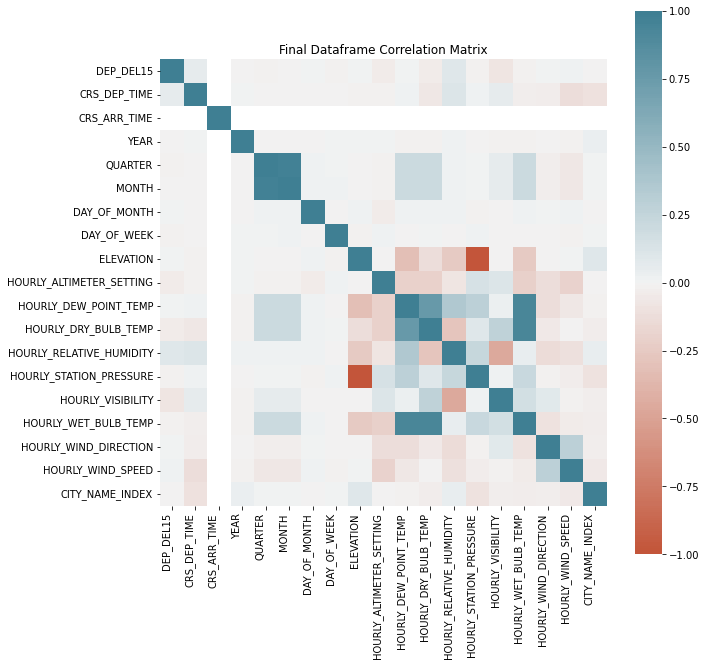

In [0]:
sample_final_df = final_df.sample(False, 0.0001).select(
    "DEP_DEL15",
    "CRS_DEP_TIME",
    "CRS_ARR_TIME",
    F.col("ORIGIN_YEAR").alias("YEAR"),
    F.col("ORIGIN_QUARTER").alias("QUARTER"),
    F.col("ORIGIN_MONTH").alias("MONTH"),
    F.col("ORIGIN_DAY_OF_MONTH").alias("DAY_OF_MONTH"),
    F.col("ORIGIN_DAY_OF_WEEK").alias("DAY_OF_WEEK"),
    F.col("ORIGIN_CITY_NAME").alias("CITY_NAME"),
    F.col("ORIGIN_ELEVATION").alias("ELEVATION"),
    F.col("ORIGIN_HOURLY_ALTIMETER_SETTING").alias("HOURLY_ALTIMETER_SETTING"),
    F.col('ORIGIN_HOURLY_DEW_POINT_TEMP').alias('HOURLY_DEW_POINT_TEMP'),
    F.col('ORIGIN_HOURLY_DRY_BULB_TEMP').alias('HOURLY_DRY_BULB_TEMP'),
    F.col('ORIGIN_HOURLY_RELATIVE_HUMIDITY').alias('HOURLY_RELATIVE_HUMIDITY'),
    F.col('ORIGIN_HOURLY_STATION_PRESSURE').alias('HOURLY_STATION_PRESSURE'),
    F.col('ORIGIN_HOURLY_VISIBILITY').alias('HOURLY_VISIBILITY'),
    F.col('ORIGIN_HOURLY_WET_BULB_TEMP').alias('HOURLY_WET_BULB_TEMP'),
    F.col('ORIGIN_HOURLY_WIND_DIRECTION').alias('HOURLY_WIND_DIRECTION'),
    F.col('ORIGIN_HOURLY_WIND_SPEED').alias('HOURLY_WIND_SPEED')
)

print(f"Sample Size: {sample_final_df.count()}")
_ = plot_correlation_matrix(sample_final_df, title="Final Dataframe Correlation Matrix")

## Model

In this section, we will be discussing our modeling process including the different featured that were added and model pipelines. Our dataset contains classified data, so we can use supervised learning models to train on our data.

As our main metric, we used recall since we noticed that there was a major imbalance of data. We also want to minimize the number of False Negatives since it would be detrimental to airlines if we predicted a flight to not be delayed but it actually was. Of the 206,001,196 weather readings from flights, 202,790,634 were listed as no delay where as 3,210,562 were delays. Note that each record is a unique flight, rather contain a timeframe within a specific flight.

Due to this imbalanced nature, we could not use accuracy since it relies on a balanced data set. Precision measures how many flights were correctly predicted as delayed over the true number of delayed flights, whereas recall measures the number of correctly predicted delayed flights over all positive cases for both delay and non-delayed flights. Specificity measures how many non delayed predictions were correct and F1-Score combines both precisino and recall.

We aim to minimize false negatives, so flights that predicted to not be delayed but are actually delayed. This is because if we misinterpret a flight as being on time but is actually late, there is a lot of economic loss for us. On the other hand, if we predict a flight to be late but is actually on time, it may actully increase customer satisfaction knowing that their flight has arrived earlier than expected. 

Therefore, we will use recall as our main metric, but will also list precision and F1 score for curiosity sake.

$$Recall = \frac{TP}{TP+FN} $$

Our model pipeline for creating our dataset can be depicted in the image below. We will go into each feature and decision more closely in the following sections.

<br></br>

<img src="https://github.com/sysung/w261-final-project/blob/master/model_pipeline.png?raw=true" width=80%/>

In [0]:
final_df = spark.read.parquet(f"{blob_url}/final_df_13")

In [0]:
display(final_df.groupBy('DEP_DEL15').count())

DEP_DEL15,count
1,7283399
0,35423946


Output can only be rendered in Databricks

### Feature Engineering

#### Airport PageRank

For our graph based feature, we decided to create a new column based on the PageRank of each airport where the value would represent the importance based on delay. Since our dataframe contains two airports, origin and destination, we would create two new PageRank columns. 

The impact we hope that the new features will achieve is the ability to understand how which airport will be the most congested. The reasoning is that if an air flight is delayed, then the next flights that depends on that specific airplane will also most likely be delayed. This will cause a domino effect across all airports, which is similar to how the PageRank algorithm works. Although we will lose a lot of granular information about delays by date if we aggregate on a origin and destination airport, the PageRank metric will still be extremely useful in understanding delays and its aftereffects.

To start, the clean airlines dataframe is used instead of the fully joined dataframe because the airlines dataframe not only contains less rows but also unique flights. Grouping by the origin and destination airport IDs allows us to aggregate by the delay and total flight counts and calculating the probability.

| Field Name                | Description | Data Lineage | Data Type |
| ------------------------- | ----------- | ------------ | --------- |
| `PR`   | PageRank for flight delays by airport | `DEP_DEL15`, `ORIGIN_AIRPORT_ID`, and `DEST_AIRPORT_ID` from Airlines dataframe | double |

In [0]:
partition_fields = ["ORIGIN_AIRPORT_ID", "DEST_AIRPORT_ID"]

graph_airlines_df = clean_airlines_df.select(
    "ORIGIN_AIRPORT_ID", "DEP_DEL15", "DEST_AIRPORT_ID"
).groupBy(
    partition_fields
).agg(
    F.sum("DEP_DEL15").alias("DELAY_CT")
)

In [0]:
display(graph_airlines_df)

ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,DELAY_CT
12266,12915,635
10397,12323,1554
11278,11042,1632
11433,12953,5278
10397,14122,3117
10397,14986,1980
13198,15016,1041
14100,11292,3067
11042,15304,788
13930,11337,1445


After the aggregation and window functions, we have 8,110 unique flights which will also represent the edges for in our graph.

In [0]:
print(f'Graph airlines row count: {graph_airlines_df.count()}')

Graph airlines row count: 8309


We also want to get all unique airports which will make up our nodes in our graph. Since there are airport overlaps between the origin and destination columns, we can combine both columns and then get only distinct airports.

Altogether, there are only 387 unique airports within our dataset

In [0]:
origin_airports = graph_airlines_df.select("ORIGIN_AIRPORT_ID").distinct()
dest_airports = graph_airlines_df.select("DEST_AIRPORT_ID").distinct()

distinct_airports = origin_airports.union(dest_airports) \
    .select(F.col("ORIGIN_AIRPORT_ID").alias('AIRPORT_ID')).distinct()

In [0]:
print(f'Distinct number of airports: {distinct_airports.count()}')

Distinct number of airports: 389


With both the nodes and edges calculated, the graph can be created using the newly created dataframes. The nodes and edges must be converted into a lists using RDD's map functio to pass the airports into the graph object. Once the graph is set up properly, a PageRank algorithm can be run throughout the graph.

In [0]:
G = nx.DiGraph()

distinct_airports_list = distinct_airports.rdd.map(lambda x: x[0]).collect()
G.add_nodes_from(distinct_airports_list)

airflights_list = graph_airlines_df.rdd.map(lambda x: (x[0], x[1], x[2])).collect()
G.add_weighted_edges_from(airflights_list)

airflights_pr = nx.pagerank(G)

Since the output of a NetworkX graph is a dictionary, we must convert it into a PySpark Dataframe such that we can join back into the fully joined dataframe.

In [0]:
airflights_pr_list = []
for airflight, pr in airflights_pr.items():
    airflights_pr_list.append((airflight, pr))

schema = T.StructType([
    T.StructField('AIRPORT_ID', T.IntegerType(), False),
    T.StructField('PR', T.DoubleType(), False)
])

airflights_pr_df = spark.createDataFrame(data=airflights_pr_list, schema=schema)

In [0]:
display(airflights_pr_df.sort(F.col("PR").desc()))

AIRPORT_ID,PR
13930,0.046986725748256915
11298,0.04175665912250113
10397,0.041678235966182905
11292,0.03903206775687566
14771,0.02800891934073368
12892,0.02794925014846467
11057,0.02142063660169952
12889,0.021022010215772196
14107,0.02101163689701534
11618,0.020325718412603996


Output can only be rendered in Databricks

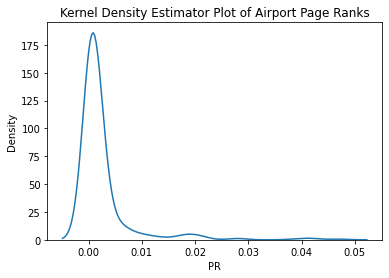

In [0]:
df8 = airflights_pr_df.sort_values('PR', ascending=False)
x=df8['AIRPORT_ID']
y=df8['PR']
sns.kdeplot(df8['PR']).set(title='Kernel Density Estimator Plot of Airport Page Ranks')      
plt.show()

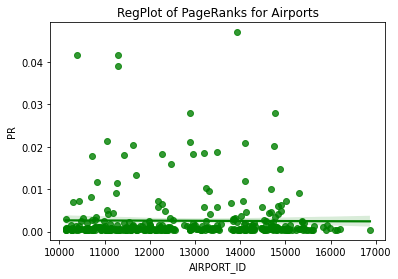

In [0]:
sns.regplot(data=df8, x='AIRPORT_ID', y='PR', color='green').set(title='RegPlot of PageRanks for Airports')
plt.show()

In [0]:
airline_pr_df = clean_airlines_df.withColumnRenamed('ORIGIN_AIRPORT_ID', 'AIRPORT_ID').join(airflights_pr_df, on=['AIRPORT_ID'])
print('PageRank Correlation: with Departure Delay', airline_pr_df.stat.corr(col1='PR', col2='DEP_DEL15'))

PageRank Correlation: with Departure Delay 0.03221690485131237


The histogram of PageRanks has a skewed distribution with a majority of PageRank values closer to zero. We can see that the PageRank has a correlation of 0.0322 with departure delay. Therefore, we can predict that there will be little to no impact of the feature when training the model.

Finally, we can join the PageRank dataframe into the original dataframe and create two new columns based on the origin airport PageRank and destination airport PageRank

In [0]:
# Join on origin airport
pr_final_df = final_df.join(
    airflights_pr_df, final_df.ORIGIN_AIRPORT_ID == airflights_pr_df.AIRPORT_ID
).withColumnRenamed("PR", "ORIGIN_PR").drop("AIRPORT_ID")

# Join on destination airport
pr_final_df = pr_final_df.join(
    airflights_pr_df, final_df.DEST_AIRPORT_ID == airflights_pr_df.AIRPORT_ID
).withColumnRenamed("PR", "DEST_PR").drop("AIRPORT_ID")

In [0]:
display(pr_final_df)

DEP_DEL15,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,CRS_DEP_TIME,UNIX_CRS_DEP_TIME_UTC,CRS_ARR_TIME,UNIX_CRS_ARR_TIME_UTC,ORIGIN_YEAR,ORIGIN_QUARTER,ORIGIN_MONTH,ORIGIN_DAY_OF_MONTH,ORIGIN_DAY_OF_WEEK,ORIGIN_DATE,ORIGIN_AIRPORT_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_NM,ORIGIN_TIMEZONE,ORIGIN_STATION,ORIGIN_STATION_LAT,ORIGIN_STATION_LON,ORIGIN_UNIX_WEATHER_TIME,ORIGIN_ELEVATION,ORIGIN_HOURLY_ALTIMETER_SETTING,ORIGIN_HOURLY_DEW_POINT_TEMP,ORIGIN_HOURLY_DRY_BULB_TEMP,ORIGIN_HOURLY_RELATIVE_HUMIDITY,ORIGIN_HOURLY_STATION_PRESSURE,ORIGIN_HOURLY_VISIBILITY,ORIGIN_HOURLY_WET_BULB_TEMP,ORIGIN_HOURLY_WIND_DIRECTION,ORIGIN_HOURLY_WIND_SPEED,ORIGIN_REPORT_TYPE,ORIGIN_SOURCE,DEST_AIRPORT_ID,DEST_CITY_NAME,DEST_STATE_NM,DEST_TIMEZONE,DEST_STATION,DEST_STATION_LAT,DEST_STATION_LON,DEST_UNIX_WEATHER_TIME,DEST_ELEVATION,DEST_HOURLY_ALTIMETER_SETTING,DEST_HOURLY_DEW_POINT_TEMP,DEST_HOURLY_DRY_BULB_TEMP,DEST_HOURLY_RELATIVE_HUMIDITY,DEST_HOURLY_STATION_PRESSURE,DEST_HOURLY_VISIBILITY,DEST_HOURLY_WET_BULB_TEMP,DEST_HOURLY_WIND_DIRECTION,DEST_HOURLY_WIND_SPEED,DEST_REPORT_TYPE,DEST_SOURCE,ORIGIN_PR,DEST_PR
0,AA,N474AA,1208,714,1421334840,1230,1421346600,2015,1,1,15,4,2015-01-15,14570,"Reno, NV",Nevada,America/Los_Angeles,72488023185,39.484,-119.771,1421333700,1344.2,30.27,24.0,48.0,39.0,25.76,10.0,38.0,0.0,0.0,FM-15,7,11298,"Dallas/Fort Worth, TX",Texas,America/Chicago,72259003927,32.898,-97.019,1421347980,170.7,30.29,30.0,51.0,44.0,29.64,10.0,42.0,300.0,5.0,FM-15,7,0.002593302581654362,0.04175665912250113
0,WN,N225WN,1274,650,1421851800,820,1421857200,2015,1,1,21,3,2015-01-21,14570,"Reno, NV",Nevada,America/Los_Angeles,72488023185,39.484,-119.771,1421852100,1344.2,30.25,18.0,49.0,29.0,25.75,10.0,37.0,70.0,9.0,FM-15,7,12892,"Los Angeles, CA",California,America/Los_Angeles,72295023174,33.938,-118.389,1421855580,29.6,30.0,54.0,61.0,78.0,29.65,6.0,57.0,270.0,9.0,FM-15,7,0.002593302581654362,0.02794925014846467
0,WN,N553WN,1274,650,1422888600,820,1422894000,2015,1,2,2,1,2015-02-02,14570,"Reno, NV",Nevada,America/Los_Angeles,72488023185,39.484,-119.771,1422888900,1344.2,30.17,43.0,52.0,72.0,25.68,10.0,47.0,0.0,0.0,FM-15,7,12892,"Los Angeles, CA",California,America/Los_Angeles,72295023174,33.938,-118.389,1422892380,29.6,30.01,52.0,64.0,65.0,29.66,10.0,57.0,260.0,10.0,FM-15,7,0.002593302581654362,0.02794925014846467
0,OO,N874AS,5628,625,1423837500,735,1423841700,2015,1,2,13,5,2015-02-13,14570,"Reno, NV",Nevada,America/Los_Angeles,72488023185,39.484,-119.771,1423839300,1344.2,30.2,34.0,68.0,28.0,25.7,10.0,51.0,210.0,3.0,FM-15,7,14771,"San Francisco, CA",California,America/Los_Angeles,72494023234,37.62,-122.365,1423842960,2.4,30.06,57.0,68.0,68.0,30.04,10.0,62.0,40.0,5.0,FM-15,7,0.002593302581654362,0.02800891934073368
0,WN,N430WN,3347,850,1424537400,1005,1424541900,2015,1,2,21,6,2015-02-21,14570,"Reno, NV",Nevada,America/Los_Angeles,72488023185,39.484,-119.771,1424537700,1344.2,29.9,18.0,51.0,27.0,25.44,10.0,38.0,20.0,14.0,FM-15,7,12889,"Las Vegas, NV",Nevada,America/Los_Angeles,72386023169,36.072,-115.163,1424541360,664.5,29.68,13.0,66.0,13.0,27.41,10.0,44.0,110.0,3.0,FM-15,7,0.002593302581654362,0.021022010215772196
0,WN,N743SW,2575,1540,1425166800,1705,1425171900,2015,1,2,28,6,2015-02-28,14570,"Reno, NV",Nevada,America/Los_Angeles,72488023185,39.484,-119.771,1425167700,1344.2,29.94,32.0,37.0,82.0,25.48,10.0,35.0,360.0,3.0,FM-15,7,14679,"San Diego, CA",California,America/Los_Angeles,72290023188,32.734,-117.183,1425171060,4.6,29.94,50.0,60.0,70.0,29.91,10.0,55.0,220.0,3.0,FM-15,7,0.002593302581654362,0.01000408584036625
0,WN,N743SW,2575,1540,1425166800,1705,1425171900,2015,1,2,28,6,2015-02-28,14570,"Reno, NV",Nevada,America/Los_Angeles,72488023185,39.484,-119.771,1425167700,1344.2,29.94,32.0,37.0,82.0,25.48,10.0,35.0,360.0,3.0,FM-15,7,14679,"San Diego, CA",California,America/Los_Angeles,72290023188,32.734,-117.183,1425173160,4.6,29.94,50.0,59.0,72.0,29.91,10.0,54.0,0.0,0.0,FM-16,7,0.002593302581654362,0.01000408584036625
0,OO,N965SW,6336,1042,1428342120,1

#### Custom Time-Based Feature: Exploring How Holidays Impact Delays Based on Correlation

Logically, we thought it would make sense to check if US holidays had an impact on flight delays given that holidays tend to be heavy travel periods. We expected the dates of holidays to be correlated with departure delays. Unforunately, we observed that holidays were not correlated to flight delays, with out pearson correlation show -0.004 correlation. This was not an expected result given that heavy travel periods are likely to cause increased delays. Perhaps, airlines hired more staff for holidays or geared up to prevent delays, knowing in advance that the dates would be busy. The results will likely have little impact on our model in terms of explanatory power given the pearson correlation output. Nevertheless, it was worthwhile to pursue given the logic.

| Field Name                | Description | Data Lineage | Data Type |
| ------------------------- | ----------- | ------------ | --------- |
| `IS_US_HOLIDAY`   | Binary Indicator if flight day is a holiday | `YEAR`, `MONTH`, `DAY_OF_MONTH` from Airlines dataframe and dictionary of all holidays from 2015-2021 | integer |

In [0]:
# 2015 Holidays
# January 1, 2015 - New Year's Day
# January 19, 2015 - MLK
# February 14, 2015 - Valentine's Day
# February 16, 2015 - President's Day
# April 3, 2015 - Good Friday
# April 5, 2015 - Easter Sunday
# May 10, 2015 - Mother's Day
# May 25, 2015 - Memorial Day
# June 21, 2015 - Father's Day
# July 4, 2015 - Independence Day
# September 7, 2015 - Labor Day
# October 12, 2015 - Columbus Day
# October 31, 2015 - Halloween
# November 11, 2015 - Veteran's Day
# November 26, 2015 - Thanksgiving
# December 25, 2015 - Christmas

# 2016 Holidays
# January 1, 2016 - New Year's Day
# January 18, 2016 - MLK
# February 14, 2016 - Valentine's Day
# February 15, 2016 - President's Day
# March 25, 2016 - Good Friday
# March 27, 2016 - Easter Sunday
# May 8, 2016 - Mother's Day
# May 30, 2016 - Memorial Day
# June 19, 2016 - Father's Day
# July 4, 2016 - Independence Day
# September 5, 2016 - Labor Day
# October 10, 2016 - Columbus Day
# October 31, 2016 - Halloween
# November 11, 2016 - Veteran's Day
# November 24, 2016 - Thanksgiving
# December 25, 2016 - Christmas

# 2017 Holidays
# January 1, 2017 - New Year's Day
# January 16, 2017 - MLK
# February 14, 2017 - Valentine's Day
# February 20, 2017 - President's Day
# April 14, 2017 - Good Friday
# April 16, 2017 - Easter Sunday
# May 14, 2017 - Mother's Day
# May 29, 2017 - Memorial Day
# June 18, 2017 - Father's Day
# July 4, 2017 - Independence Day
# September 4, 2017 - Labor Day
# October 9, 2017 - Columbus Day
# October 31, 2017 - Halloween
# November 11, 2017 - Veteran's Day
# November 23, 2017 - Thanksgiving
# December 25, 2017 - Christmas

# 2018 Holidays
# January 1, 2018 - New Year's Day
# January 15, 2018 - MLK
# February 14, 2018 Valentine's Day
# February 19, 2018 - President's Day
# March 30, 2018 - Good Friday
# April 1, 2018 - Easter Sunday
# May 13, 2018 - Mother's Day
# May 28, 2018 - Memorial Day
# June 17, 2018 - Father's Day
# July 4, 2018 - Independence Day
# September 3, 2018 - Labor Day
# October 8, 2018 - Columbus Day
# October 31, 2018 - Halloween
# November 11, 2018 - Veteran's Day
# November 22, 2018 - Thanksgiving
# December 25, 2018 - Christmas

# 2019 Holidays
# January 1, 2019 - New Year's Day
# January 21, 2019- MLK
# February 14, 2019 - Valentine's Day
# February 18, 2019 - President's Day
# April 19, 2019 - Good Friday
# April 21, 2019 - Easter Sunday
# May 12, 2019 - Mother's Day
# May 27, 2019 - Memorial Day
# June 16, 2019 - Father's Day
# July 4, 2019 - Independence Day
# September 2, 2019 - Labor Day
# October 14, 2019 - Columbus Day
# October 31, 2019 - Halloween
# November 11, 2019 - Veteran's Day
# November 28, 2019 - Thanksgiving
# December 25, 2019 - Christmas

# 2020 Holidays
# January 1, 2020 - New Year's Day
# January 20, 2020 - MLK
# February 14, 2020 - Valentine's Day
# February 17, 2020 - President's Day
# April 10, 2020 - Good Friday
# April 12, 2020 - Easter Sunday
# May 10, 2020 - Mother's Day
# May 25, 2020 - Memorial Day
# June 21, 2020 - Father's Day
# July 4, 2020 - Independence Day
# September 7, 2020 - Labor Day
# October 12, 2020 - Columbus Day
# October 31, 2020 - Halloween
# November 11, 2020 - Veteran's Day
# November 26, 2020 - Thanksgiving
# December 25, 2020 - Christmas

# 2021 Holidays
# January 1, 2021 - New Year's Day
# January 18, 2021 - MLK
# February 14, 2021 - Valentine's Day
# February 15, 2021 - President's Day
# April 2, 2021 - Good Friday
# April 4, 2021 - Easter Sunday
# May 9, 2021 - Mother's Day
# May 31, 2021 - Memorial Day
# June 20, 2021 - Father's Day
# July 4, 2021 - Independence Day
# July 5, 2021 - Independence Day Observed 
# September 6, 2021 - Labor Day
# October 11, 2021 - Columbus Day
# October 31, 2021 - Halloween
# November 11, 2021 - Veteran's Day
# November 25, 2021 - Thanksgiving
# December 25, 2021 - Christmas

In [0]:
columns = ["ORIGIN_YEAR", "ORIGIN_MONTH", "ORIGIN_DAY_OF_MONTH", "IS_US_HOLIDAY"]
days = [("2015", "1", "1", 1), ("2015", "1", "19", 1), ("2015", "2", "14", 1), ("2015", "2", "16", 1), ("2015", "4", "3", 1), ("2015", "4", "5", 1), ("2015", "5", "10", 1), ("2015", "5", "25", 1), ("2015", "6", "21", 1), ("2015", "7", "4", 1), ("2015", "9", "7", 1), ("2015", "10", "12", 1), ("2015", "10", "31", 1), ("2015", "11", "11", 1), ("2015", "11", "26", 1), ("2015", "12", "25", 1), ("2016", "1", "1", 1), ("2016", "1", "18", 1), ("2016", "2", "14", 1), ("2016", "2", "15", 1), ("2016", "3", "25", 1), ("2016", "3", "27", 1), ("2016", "5", "8", 1), ("2016", "5", "30", 1), ("2016", "6", "19", 1), ("2016", "7", "4", 1), ("2016", "9", "5", 1), ("2016", "10", "10", 1), ("2016", "10", "31", 1), ("2016", "11", "11", 1), ("2016", "11", "24", 1), ("2016", "12", "25", 1), ("2017", "1", "1", 1), ("2017", "1", "16", 1), ("2017", "2", "14", 1), ("2017", "2", "20", 1), ("2017", "4", "14", 1), ("2017", "4", "16", 1), ("2017", "5", "14", 1), ("2017", "5", "29", 1), ("2017", "6", "18", 1), ("2017", "7", "4", 1), ("2017", "9", "4", 1), ("2017", "10", "9", 1), ("2017", "10", "31", 1), ("2017", "11", "11", 1), ("2017", "11", "23", 1), ("2017", "12", "25", 1), ("2018", "1", "1", 1), ("2018", "1", "15", 1), ("2018", "2", "14", 1), ("2018", "2", "19", 1), ("2018", "3", "30", 1), ("2018", "4", "1", 1), ("2018", "5", "13", 1), ("2018", "5", "28", 1), ("2018", "6", "17", 1), ("2018", "7", "4", 1), ("2018", "9", "3", 1), ("2018", "10", "8", 1), ("2018", "10", "31", 1), ("2018", "11", "11", 1), ("2018", "11", "22", 1), ("2018", "12", "25", 1), ("2019", "1", "1", 1), ("2019", "1", "21", 1), ("2019", "2", "14", 1), ("2019", "2", "18", 1), ("2019", "4", "19", 1), ("2019", "4", "21", 1), ("2019", "5", "12", 1), ("2019", "5", "27", 1), ("2019", "6", "16", 1), ("2019", "7", "4", 1), ("2019", "9", "9", 1), ("2019", "10", "14", 1), ("2019", "10", "31", 1), ("2019", "11", "11", 1), ("2019", "11", "28", 1), ("2019", "12", "25", 1), ("2020", "1", "1", 1), ("2020", "1", "20", 1), ("2020", "2", "14", 1), ("2020", "2", "17", 1), ("2020", "4", "10", 1), ("2020", "4", "12", 1), ("2020", "5", "10", 1), ("2020", "5", "25", 1), ("2020", "6", "21", 1), ("2020", "7", "4", 1), ("2020", "9", "7", 1), ("2020", "10", "12", 1), ("2020", "10", "31", 1), ("2020", "11", "11", 1), ("2020", "11", "26", 1), ("2020", "12", "25", 1), ("2021", "1", "1", 1), ("2021", "1", "18", 1), ("2021", "2", "14", 1), ("2021", "2", "15", 1), ("2021", "4", "2", 1), ("2021", "4", "4", 1), ("2021", "5", "9", 1), ("2021", "5", "31", 1), ("2021", "6", "20", 1), ("2021", "7", "4", 1), ("2021", "9", "6", 1), ("2021", "10", "11", 1), ("2021", "10", "31", 1), ("2021", "11", "11", 1), ("2021", "11", "25", 1), ("2021", "12", "25", 1)]

rdd = spark.sparkContext.parallelize(days)
df_holidays = spark.createDataFrame(rdd).toDF(*columns)
print(df_holidays)

df_joined_holidays = pr_final_df.join(df_holidays, on=['ORIGIN_YEAR', 'ORIGIN_MONTH', 'ORIGIN_DAY_OF_MONTH'], how='left').fillna(0, 'IS_US_HOLIDAY')
print('Holiday correlation:',df_joined_holidays.stat.corr(col1='IS_US_HOLIDAY', col2='DEP_DEL15'))

DataFrame[ORIGIN_YEAR: string, ORIGIN_MONTH: string, ORIGIN_DAY_OF_MONTH: string, IS_US_HOLIDAY: bigint]
Holiday correlation: -0.004161117767153786


In [0]:
display(df_joined_holidays.groupBy('IS_US_HOLIDAY', 'DEP_DEL15').count())

IS_US_HOLIDAY,DEP_DEL15,count
1,1,295542
0,0,33907536
0,1,6987857
1,0,1516410


Output can only be rendered in Databricks

In [0]:
display(hol_delays)

IS_US_HOLIDAY,avg(DEP_DEL15)
1,0.1631069697210522


#### Feature Selection

We will apply another layer of dimensionality reduction with feature selection where we retain only weather, date, and engineered features about the origin airport since we are focused on departure delays instead of arrival delay.

In [0]:
ft_select_final_df = df_joined_holidays.select(
    F.col('DEP_DEL15'),
    F.col('ORIGIN_YEAR').alias('YEAR'),
    F.col('ORIGIN_QUARTER').alias('QUARTER'),
    F.col('ORIGIN_MONTH').alias('MONTH'),
    F.col('ORIGIN_DAY_OF_MONTH').alias("DAY_OF_MONTH"),
    F.col('ORIGIN_STATION_LAT').alias('STATION_LAT'),
    F.col('ORIGIN_STATION_LON').alias('STATION_LON'),
    F.col('ORIGIN_ELEVATION').alias('ELEVATION'),
    F.col('ORIGIN_HOURLY_ALTIMETER_SETTING').alias('HOURLY_ALTIMETER_SETTING'),
    F.col('ORIGIN_HOURLY_DEW_POINT_TEMP').alias('HOURLY_DEW_POINT_TEMP'),
    F.col('ORIGIN_HOURLY_DRY_BULB_TEMP').alias('HOURLY_DRY_BULB_TEMP'),
    F.col('ORIGIN_HOURLY_RELATIVE_HUMIDITY').alias('HOURLY_RELATIVE_HUMIDITY'),
    F.col('ORIGIN_HOURLY_STATION_PRESSURE').alias('HOURLY_STATION_PRESSURE'),
    F.col('ORIGIN_HOURLY_WET_BULB_TEMP').alias('HOURLY_WET_BULB_TEMP'),
    F.col('ORIGIN_HOURLY_WIND_SPEED').alias('HOURLY_WIND_SPEED'),
    F.col('ORIGIN_PR').alias('PR'),
    F.col('IS_US_HOLIDAY')
)

In [0]:
print(f"Final Dataframe Deimnsion: {ft_select_final_df.count()} x {len(ft_select_final_df.columns)}")

Final Dataframe Deimnsion: 42707345 x 17


#### Clustering Feature

In our previous phases, we've noticed that our logistic and decision tree models were not performing well. One of the reasons may be because we had numerous unnecessary fields and noisy data that decreased the recall. Additionally, if we try to understand logistic and decision trees at a fundamental level, they require decision boundaries to accurately predict the outcome. For example, a logistic regression applies a sigmoid function to calculate the probability of a given outcome whereas a decision tree splits the fields into smaller subtrees to find commonality between categories. 

When we observe data, severe weather is a broad term where requirements to satisfy a weather delay differs. A great example we can use is that 5 inches of snow in New York is normal snow showers whereas Florida may cancel all flights. Therefore, we decided to see if we could cluster each of the data points by all of the fields except for `DEP_DEL15` and see if we can see a commonality within each cluster. Then, we can see how many flights were delayed within a cluster and compare it to how many flights were not delayed. Ideally, each cluster would represent a specific weather condition for a time and geolocation range where at least one cluster will have mostly 0s.

In [0]:
vecAssembler = VectorAssembler(inputCols=list(set(ft_select_final_df.columns) - set(['DEP_DEL15'])), outputCol="feat
assembled_data=vecAssembler.transform(ft_select_final_df)

scale=StandardScaler(inputCol='features',outputCol='standardized')
data_scale=scale.fit(assembled_data)
data_scale_output=data_scale.transform(assembled_data)

km_8=KMeans(featuresCol='standardized', k=8)
km_fit_8=km_8.fit(data_scale_output)
output_8=km_fit_8.transform(data_scale_output)

km_16=KMeans(featuresCol='standardized', k=16)
km_fit_16=km_16.fit(data_scale_output)
output_16=km_fit_16.transform(data_scale_output)

km_32=KMeans(featuresCol='standardized', k=32)
km_fit_32=km_32.fit(data_scale_output)
output_32=km_fit_32.transform(data_scale_output)


In [0]:
display(output_8.groupBy('prediction', 'DEP_DEL15').count())

prediction,DEP_DEL15,count
1,0,3958244
6,1,653393
3,1,944892
7,1,803224
6,0,3206256
4,0,8395134
1,1,704593
0,0,4837609
2,1,503576
2,0,2623825


Output can only be rendered in Databricks

In [0]:
display(output_16.groupBy('prediction', 'DEP_DEL15').count())

prediction,DEP_DEL15,count
1,0,2802219
6,1,207201
3,1,639087
7,1,377508
11,1,413907
9,1,644719
6,0,1207970
4,0,1607577
15,1,260938
12,1,1305899


Output can only be rendered in Databricks

In [0]:
display(output_32.groupBy('prediction', 'DEP_DEL15').count())display(output_32.groupBy('prediction', 'DEP_DEL15').count())

prediction,DEP_DEL15,count
30,0,734033
17,1,195098
1,0,2580374
6,1,163150
3,1,142286
18,1,124006
7,1,203567
25,1,213991
29,0,2053812
11,1,520294


Output can only be rendered in Databricks

We can see that when using 8, 16, and 32 clusters that we were not able to find a cluster that can predict mostly delays. This means that we may need to increase the number of clusters by a lot in order since there are many geographic regions with varying weather conditions. Therefore, we will be trying 200.

In [0]:
km_200=KMeans(featuresCol='standardized', k=200)
km_fit_200=km_200.fit(data_scale_output)
output_200=km_fit_200.transform(data_scale_output)

In [0]:
display(output_200.groupBy('prediction', 'DEP_DEL15').count())

prediction,DEP_DEL15,count
196,0,203749
185,1,37242
105,1,53966
69,1,15267
118,1,28579
108,1,8330
62,1,34183
88,0,165018
30,0,122125
17,1,48786


Output can only be rendered in Databricks

Even with 200 clusters, we cannot find a cluster that can predict delayed flights by weather. Therefore, we've decided to remove the clustered features altogther. We may either need to increase the number of clusters again or we may need more rows with delayed flights by weather.

#### Feature Family

Our final dataframe will use 42707345 rows and 16 columns. We've also listed the feature family below.

##### Response Variable (1 input)

Our response variable is `DEP_DEL15` which derives from the raw field `DEP_DEL15` from the Airlines dataframe.

##### Date (4 inputs)

Each flight contains a day of when it departed. It contains information about not only the date, but also quarter of the year.

##### Geolocation (3 inputs)

The geolocation family contains three features which are latitude, longitude, and elevation. These fields will never change based on time once the origin station is set.

##### Weather (7 inputs)

The weather data shows the point-in-time weather reading like temperature and wind speeds. These are the main features that will determine whether a flight is delayed or not.

##### Engineered Features (2 inputs)

Based on our previous data these engineered features are created as supplements to increase the likelihood of predicting whether a flight is delayed or not.

### Pipelines

##### Data Splits with Time Series Cross Validation

Using our final joined dataframe, we plan on splitting the data into 5 folds based on the year of each flight. We are doing the split on the year instead of randomly because we are working with time-series data making our models more robust. We will implement a chronological split by year and have a rolling window approach as we move up the folds. Below we see the breakdown of how we will go about manually splitting our data into our training, validation, and test sets.

Additionally, we've taken 10% samples of each fold to decrease the amount of time needed for training. Downsizing the data may also reduce noise and also help the model converge faster. When we train the final model, we will train with all of the data.

<img src="https://github.com/sysung/w261-final-project/blob/master/5_fold_cv_visualization.png?raw=true" width=85%>

In [0]:
l1NormData = ft_select_final_df

train = l1NormData.filter((F.col('YEAR') >= 2015) & (F.col('YEAR') <= 2020))
test = l1NormData.filter((F.col('YEAR') == 2021))

train_fold1 = l1NormData.filter((F.col('YEAR') == 2015)).sample(fraction=0.1)
val_fold1 = l1NormData.filter((F.col('YEAR') == 2016)).sample(fraction=0.1)

train_fold2 = l1NormData.filter((F.col('YEAR') == 2015) | (F.col('YEAR') == 2016)).sample(fraction=0.1)
val_fold2 = l1NormData.filter((F.col('YEAR') == 2017)).sample(fraction=0.1)

train_fold3 = l1NormData.filter((F.col('YEAR') == 2015) | (F.col('YEAR') == 2016) | (F.col('YEAR') == 2017)).sample(fraction=0.1)
val_fold3 = l1NormData.filter((F.col('YEAR') == 2018)).sample(fraction=0.1)

train_fold4 = l1NormData.filter((F.col('YEAR') == 2015) | (F.col('YEAR') == 2016) | (F.col('YEAR') == 2017) | (F.col('YEAR') == 2018)).sample(fraction=0.1)
val_fold4 = l1NormData.filter((F.col('YEAR') == 2019)).sample(fraction=0.1)

train_fold5 = l1NormData.filter((F.col('YEAR') == 2015) | (F.col('YEAR') == 2016) | (F.col('YEAR') == 2017) | (F.col('YEAR') == 2018) | (F.col('YEAR') == 2019)).sample(fraction=0.1)
val_fold5 = l1NormData.filter((F.col('YEAR') == 2020)).sample(fraction=0.1)

In [0]:
display(train)

DEP_DEL15,YEAR,QUARTER,MONTH,DAY_OF_MONTH,STATION_LAT,STATION_LON,ELEVATION,HOURLY_ALTIMETER_SETTING,HOURLY_DEW_POINT_TEMP,HOURLY_DRY_BULB_TEMP,HOURLY_RELATIVE_HUMIDITY,HOURLY_STATION_PRESSURE,HOURLY_WET_BULB_TEMP,PR,IS_US_HOLIDAY
0,2015,1,1,1,39.833,-104.658,1650.2,29.97,14.0,21.0,74.0,24.54,19.0,0.03903206775687566,1
0,2015,1,1,1,39.833,-104.658,1650.2,29.97,14.0,21.0,74.0,24.54,19.0,0.03903206775687566,1
0,2015,1,1,1,40.778,-111.969,1287.8,30.13,10.0,22.0,60.0,25.81,18.0,0.01466258347751138,1
0,2015,1,1,1,26.079,-80.162,3.4,30.17,70.0,75.0,84.0,30.16,72.0,0.013302335054430769,1
0,2015,1,1,1,27.962,-82.54,5.8,30.2,63.0,69.0,81.0,30.19,65.0,0.009076950916563055,1
0,2015,1,1,1,40.683,-74.169,2.1,30.0,14.0,37.0,39.0,29.97,29.0,0.020325718412603996,1
0,2015,1,1,1,40.683,-74.169,2.1,30.0,14.0,37.0,39.0,29.97,29.0,0.020325718412603996,1
0,2015,1,1,1,40.683,-74.169,2.1,30.0,14.0,37.0,39.0,29.97,29.0,0.020325718412603996,1
0,2015,1,1,1,44.883,-93.229,265.8,29.93,20.0,30.0,66.0,29.04,27.0,0.018661490313167287,1
0,2015,1,1,1,32.734,-117.183,4.6,30.15,37.0,50.0,61.0,30.12,44.0,0.01000408584036625,1


#### Pipeline Estimators and Transformers

After feature engineering our dataset, it must be transformed again to for the model to train on the necessary columns. We've listed what we plan on adding to our pipeline in the subsections.

##### Categorical Variable Encoding

In our final joined dataframe we ended up with a few categorical variables that would require encoding before feeding into our models. Because most machine learning models only accept numerical variables as inputs, this step of feature engineering is critical to transform our remaining string and categorical variables into understandable values for our models. We will inact integer encoding to our selected subset of categorical features to make sure all of our fields within the dataset are readable.

##### Input Features Assembling

After getting our data processed, we feed our dataframe into this input features assembler function to combine our fields into a single vector column. This is a necessary step in order to train logistic regression, decision tree, and other machine learning models. We will be leveraging VectorAssembler via PySpark to help us concatenate our set of features into a single vector to make this large dataset more efficient when training our models.

##### Normalization

The goal of this normalization is to tranform our features to be a similar scale respective to each feature. Since some algorithms are sensitive to the relative value of some of our features, this normalization processing will help us bring the attribute values within a range from 0 to 1. Given our specific feature distribution we wanted to try implementing L1 normalization on our data in attempt to improve the performance and training stability of our models.

#### Hyperparameters

Our baseline model used the following parameters: regParam (regularization parameter),  elasticNetParam (the ElasticNet mixing parameter which is a hybrid of the L1 and L2 regularization) and maxIter (max number of iterations). We chose an initial value of 0.3 for the regParam and 0.8 for the elasticNetParam. We got a recall of 0 in our initial experiment. Since regularization parameters control the fitting of the model, we reduced the magnitude for both the regParam and elasticNetParam in order to reduce the penalty applied by both of these paremeters to the model. After our tuning our hyperparameters in our experiments, we still get a recall value of 0.

Our decision tree model used the following parameters: maxBins (Number of bins used for splitting the nodes),  maxDepth (Maximum depth of tree). We increased the values for maxDepth and maxBins in order to get a better recall metric. We started by increasing the value for maxDepth, but by doing so we increase the complexity of our model and increasing this value too much can lead to overfitting. We also increased the maxBins or the number of bins required to splits an internal node. Having a high value for maxBins can also lead to under-fitting so we had to account for this. We found from our experiments that having a maxDepth value of 20 and a maxBin value of 100 gave the best results when evaluating the recall metric.

Our neural network (Multilayer perceptron) model used the following parameters: layers (list of integers representing the input, hidden, and output layer), blockSize (number of inputs to be included during each iteration),  maxIter (number of iterations). We started off with a model that has 2 layers, block size = 256 and maxiterations = 100. We tried to decrease the block size to increase the metric score at the cost of run time. Our experiment that gave the best results in validation is layers = [15,12,2], blocksize = 512, max iterations = 200.

#### Logistic Regression Model

For one of our baseline models, we used a logistic regression model because it utilizes a sigmoid function that can infer whether the output is 0 or 1 based on a probabilisitc likelihood.

The logistic regression formula is described as...

$$ P(x) = \frac{1}{1 + e^{-y}} $$

...where we want to minimize the cross-entropy loss function

$$ H(p,q) = -\sum p_i log(q_i) = -ylog(\hat{y}) - (1-y)log(1-\hat{y}) $$

In [0]:
def lr_config(train, input_maxIter, input_regParam, p_value, input_elasticNetParam, features):
    if 'PR' not in features:
        train = train.drop('ORIGIN_PR', 'DEST_PR')
    
    # Categorical Encoding
    #cat_col_list = ['ORIGIN_REPORT_TYPE', 'ORIGIN_SOURCE', 'DEST_REPORT_TYPE', 'DEST_SOURCE', 'TAIL_NUM']
    cat_col_list = []
    indexer = [StringIndexer(inputCol=c, outputCol=c + "_INDEX").fit(train) for c in cat_col_list]

    # Input Feature Assembler
    features = list(set(train.columns) - set(cat_col_list) - set(['DEP_DEL15']))
    vectorAssembler = VectorAssembler(inputCols=features, outputCol="FEATURES")

    # Normalization
    normalizer = Normalizer(inputCol="FEATURES", outputCol="FEATURES_NORM", p=p_value)
    
    # Logistic Regression
    lr = LogisticRegression(featuresCol = 'FEATURES_NORM', labelCol = 'DEP_DEL15', maxIter=input_maxIter, regParam=input_regParam, elasticNetParam=input_elasticNetParam)
    
    # Run pipeline and train
    pipeline = Pipeline(stages=[*indexer, vectorAssembler, normalizer, lr])
    model = pipeline.fit(train)
    return model

In [0]:
def lr_predict(model, val):
    return model.transform(val)

In [0]:
def lr_eval(prediction, metric):
    binEval = MulticlassClassificationEvaluator().setMetricName(metric).setPredictionCol("prediction").setLabelCol("DEP_DEL15").setMetricLabel(1)
    return binEval.evaluate(prediction)

In [0]:
def lr_starter(train, val, maxIter, regParam, elasticNetParam, metric, features, k):
    import time
    
    if "PR" not in features:
        train.drop('ORIGIN_PR', 'DEST_PR')
    if "HOLIDAY" not in features:
        train.drop("IS_US_HOLIDAY")
    
    start_time = time.time()
    
    p_value = 1.0
    model = lr_config(train, maxIter, regParam, p_value, elasticNetParam, features)
    prediction = lr_predict(model, val)
    metric = lr_eval(prediction, metric)
    
    end_time = time.time()

    print(f'Fold {k} total run time: {(end_time - start_time)/60} minutes')
    
    return prediction, metric

In [0]:
class LRTimeSeriesCV:
    import threading
    
    def __init__(self, maxIter, regParam, elasticNetParam, metric, features):
        self.predictions = []
        self.recalls = []
        self.maxIter = maxIter
        self.regPAram = regParam
        self.elasticNetParam = elasticNetParam
        self.features = features
        
    # Worker Thread Function
    def kfold_cv(self, lock, train, val, maxIter, regParam, elasticNetParam, metric, features, k):
        print(f"Running {k} fold...")
        lr_prediction, lr_recall = lr_starter(train, val, maxIter, regParam, elasticNetParam, metric, features, k)

        # Locking shared results
        lock.acquire()
        self.predictions.append(lr_prediction)
        self.recalls.append(lr_recall)
        lock.release()

    def run_time_series_cv(self):
        lock = threading.Lock()

        # Threads
        cv1 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold1, val_fold1, maxIter, elasticNetParam, elasticNetParam, metric, features, 1,))
        cv2 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold2, val_fold2, maxIter, elasticNetParam, elasticNetParam, metric, features, 2,))
        cv3 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold3, val_fold3, maxIter, elasticNetParam, elasticNetParam, metric, features, 3,))
        cv4 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold4, val_fold4, maxIter, elasticNetParam, elasticNetParam, metric, features, 4,))
        cv5 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold5, val_fold5, maxIter, elasticNetParam, elasticNetParam, metric, features, 5,))

        # Start threads
        cv1.start()
        cv2.start()
        cv3.start()
        cv4.start()
        cv5.start()

        # Wait until threads finish
        cv5.join()
        cv4.join()
        cv3.join()
        cv2.join()
        cv1.join()
        
    def get_recall(self):
        from statistics import mean
        return mean(self.recalls)

##### Experiment Run 1
- maxIter = 10 
- regParam = 0.3
- elasticNetParam = 0.8
- metric = Recall
- features = ["PR"]

In [0]:
# Hyperparameters
maxIter = 100
regParam = 0.3
elasticNetParam = 0.8
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

# Run cross validations in parallel
lr_exp1 = LRTimeSeriesCV(maxIter, regParam, elasticNetParam, metric, features)
lr_exp1.run_time_series_cv()    
print(f'Average Recall: {lr_exp1.get_recall()}')

Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 4 total run time: 4.982008771101634 minutes
Fold 3 total run time: 5.879205985864004 minutes
Fold 5 total run time: 6.052125708262126 minutes
Fold 1 total run time: 6.988300398985545 minutes
Fold 2 total run time: 9.266234000523886 minutes
Average Recall: 0.0


##### Experiment Run 2
- maxIter = 10 
- regParam = 0.1
- elasticNetParam = 0.8
- metric = Recall
- features = ["PR"]

In [0]:
# Hyperparameters
maxIter = 100
regParam = 0.1
elasticNetParam = 0.8
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

# Run cross validations in parallel
lr_exp2 = LRTimeSeriesCV(maxIter, regParam, elasticNetParam, metric, features)
lr_exp2.run_time_series_cv()    
print(f'Average Recall: {lr_exp2.get_recall()}')

Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 4 total run time: 2.4445709188779197 minutes
Fold 5 total run time: 3.113364799817403 minutes
Fold 3 total run time: 3.3987789193789166 minutes
Fold 2 total run time: 3.7962756911913553 minutes
Fold 1 total run time: 4.786494143803915 minutes
Average Recall: 0.0


##### Experiment Run 3
- maxIter = 10 
- regParam = 0.3
- elasticNetParam = 0.1
- metric = Recall
- features = ["HOLIDAY"]

In [0]:
# Hyperparameters
maxIter = 100
regParam = 0.3
elasticNetParam = 0.1
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

# Run cross validations in parallel
lr_exp3 = LRTimeSeriesCV(maxIter, regParam, elasticNetParam, metric, features)
lr_exp3.run_time_series_cv()    
print(f'Average Recall: {lr_exp3.get_recall()}')

Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 5 total run time: 3.4554332733154296 minutes
Fold 3 total run time: 3.5094650665918987 minutes
Fold 4 total run time: 4.04385134379069 minutes
Fold 1 total run time: 5.527034330368042 minutes
Fold 2 total run time: 6.0132882475852965 minutes
Average Recall: 0.0


##### Experiment Run 4
- maxIter = 10 
- regParam = 0.1
- elasticNetParam = 0.1
- metric = Recall
- features = ["HOLIDAY"]

In [0]:
# Hyperparameters
maxIter = 100
regParam = 0.1
elasticNetParam = 0.1
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

# Run cross validations in parallel
lr_exp4 = LRTimeSeriesCV(maxIter, regParam, elasticNetParam, metric, features)
lr_exp4.run_time_series_cv()    
print(f'Average Recall: {lr_exp4.get_recall()}')

Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 2 total run time: 3.1815932552019754 minutes
Fold 3 total run time: 3.4408971707026166 minutes
Fold 5 total run time: 3.769602386156718 minutes
Fold 4 total run time: 4.469361646970113 minutes
Fold 1 total run time: 5.492099571228027 minutes
Average Recall: 0.0


#### Decision Tree Classifier Model

Our next baseline model is a decision tree classifier. A decision tree is a supervised learning algorithm which is used for both classification and regression tasks that has a non-linear structure. We selected decision trees as they are known for their interpretability given that they break down data by making a decision based on a series of questions. Additionally, given some of the non-linearity associated with some of the features, we hypothesized that a non-linear model might be a good classifier. We broke down the datset into smaller subesets by calculating the infromation gain for the features other than the root node. From here, we iterated and caclulated the information gain for each of the remaining features to caclulate leaf nodes. If a branch had a non-zero entropy, a leaf node would split its branches based on its current entropy until the subsequent branch had an entropy of 0.

Below we show the formula for calculating etropy for 1 attribute

$$E(S) = \sum_{i=1}^{c}-p_{i}\hspace{.05 inches}log_{2}\hspace{.05 inches}p_{i}$$

However, in our case we have several attributes or features, so entropy in our case can be represented as:

$$E(T,X) = \sum_{c\epsilon X}^{}\hspace{.05 inches}P(c)\hspace{.05 inches}E(c)$$

Decision trees are greedy algorithms which don't have a loss function. To properly evaluate it, we would use recall as a metric to determine which decision tree would be the best.

In [0]:
def dtc_config(train, p_value, inputMaxDepth, inputMaxBin, features):
    if 'PR' not in features:
        train = train.drop('ORIGIN_PR', 'DEST_PR')
    if "HOLIDAY" not in features:
        train.drop("IS_US_HOLIDAY")
    
    # Categorical Encoding
    # cat_col_list = ['ORIGIN_REPORT_TYPE', 'ORIGIN_SOURCE', 'DEST_REPORT_TYPE', 'DEST_SOURCE', 'TAIL_NUM']
    cat_col_list = []
    indexer = [StringIndexer(inputCol=c, outputCol=c + "_INDEX").fit(train) for c in cat_col_list]

    # Input Feature Assembler
    features = list((set(train.columns) - set(cat_col_list)) - set(['DEP_DEL15']))
    vectorAssembler = VectorAssembler(inputCols=features, outputCol="FEATURES")

    # Normalization
    normalizer = Normalizer(inputCol="FEATURES", outputCol="FEATURES_NORM", p=p_value)
    
    # Decision Tree
    dtc = DecisionTreeClassifier(featuresCol = 'FEATURES_NORM', labelCol = 'DEP_DEL15', maxDepth = inputMaxDepth, maxBins = inputMaxBin)
    
    # Run pipeline and train
    pipeline = Pipeline(stages=[*indexer, vectorAssembler, normalizer, dtc])
    model = pipeline.fit(train)
    return model

In [0]:
def dtc_predict(model, val):
    return model.transform(val)

In [0]:
def dtc_eval(prediction, metric):
    binEval = MulticlassClassificationEvaluator().setMetricName(metric).setPredictionCol("prediction").setLabelCol("DEP_DEL15").setMetricLabel(1)
    return binEval.evaluate(prediction)    

In [0]:
def dtc_starter(train, val, maxDepth, maxBin, metric, features, k):
    import time
    start_time = time.time()
    print(f"Running Fold {k}...")
    
    p_value = 1.0
    print("Training Model Pipeline...")
    model = dtc_config(train, p_value, maxDepth, maxBin, features)

    config_time = time.time()
    print(f'Took {(config_time - start_time)/60} minutes')
    print("Prediction on validation model...")
    prediction = dtc_predict(model, val)
    
    predict_time = time.time()
    print(f'Took {(predict_time - config_time)/60} minutes')
    print("Evaluation validation metric...")
    metric = dtc_eval(prediction, metric)
    
    end_time = time.time()
    print(f'Took {(end_time - predict_time)/60} minutes')
    print(f'Total run time: {(end_time - start_time)/60} minutes')
    
    return prediction, metric

##### Threading to Improve Processing Power

We implemented a threading process as a form of parallelization to improve the processing power of our model. Threads can be thought of as worker nodes such that each threads finishes taskes and the main program will command the worker to shut off once complete. Then, we can take the resulting metrics, recall, in this case, and report results.

In [0]:
class DTTimeSeriesCV:
    import threading
    
    def __init__(self, maxDepth, maxBin, metric, features):
        self.predictions = []
        self.recalls = []
        self.maxDepth = maxDepth
        self.maxBin = maxBin
        self.features = features
        
    # Worker Thread Function
    def kfold_cv(self, lock, train, val, maxDepth, maxBin, metric, features, k):
        print(f"Running {k} fold...")
        dtc_prediction, dtc_recall = dtc_starter(train, val, maxDepth, maxBin, metric, features, k)

        # Locking shared results
        lock.acquire()
        self.predictions.append(dtc_prediction)
        self.recalls.append(dtc_recall)
        lock.release()

    def run_time_series_cv(self):
        lock = threading.Lock()

        # Threads
        cv1 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold1, val_fold1, maxDepth, maxBin, metric, features, 1,))
        cv2 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold2, val_fold2, maxDepth, maxBin, metric, features, 2,))
        cv3 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold3, val_fold3, maxDepth, maxBin, metric, features, 3,))
        cv4 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold4, val_fold4, maxDepth, maxBin, metric, features, 4,))
        cv5 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold5, val_fold5, maxDepth, maxBin, metric, features, 5,))

        # Start threads
        cv1.start()
        cv2.start()
        cv3.start()
        cv4.start()
        cv5.start()

        # Wait until threads finish
        cv5.join()
        cv4.join()
        cv3.join()
        cv2.join()
        cv1.join()
        
    def get_recall(self):
        from statistics import mean
        return mean(self.recalls)

##### Experiment Run 1 - Decision Tree
- maxDepth = 5
- maxBins = 32
- metric = Recall
- features = ['PR']

In [0]:
# Hyperparameters
maxDepth = 5
maxBin = 32
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

# Run cross validations in parallel
dtc_exp1 = DTTimeSeriesCV(maxDepth, maxBin, metric, features)
dtc_exp1.run_time_series_cv()    
print(f'Average Recall: {dtc_exp1.get_recall()}')

Running 1 fold...
Running Fold 1...
Training Model Pipeline...
Running 2 fold...
Running Fold 2...
Training Model Pipeline...
Running 3 fold...
Running Fold 3...
Training Model Pipeline...
Running 4 fold...
Running Fold 4...
Training Model Pipeline...
Running 5 fold...
Running Fold 5...
Training Model Pipeline...
Took 9.084393775463104 minutes
Prediction on validation model...
Took 9.085297803084055 minutes
Prediction on validation model...
Took 0.006427081425984701 minutes
Evaluation validation metric...
Took 0.00743487278620402 minutes
Evaluation validation metric...
Took 0.6213122169176738 minutes
Total run time: 9.713037101427714 minutes
Took 9.772031100591024 minutes
Prediction on validation model...
Took 0.0036990165710449217 minutes
Evaluation validation metric...
Took 10.231339653333029 minutes
Prediction on validation model...
Took 0.0010017156600952148 minutes
Evaluation validation metric...
Took 0.6622917095820109 minutes
Total run time: 10.43802182674408 minutes
Took 0.4924

In [0]:
# Hyperparameters
maxDepth = 10
maxBin = 50
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

# Run cross validations in parallel
dtc_exp2 = DTTimeSeriesCV(maxDepth, maxBin, metric, features)
dtc_exp2.run_time_series_cv()    
print(f'Average Recall: {dtc_exp2.get_recall()}')

Running 1 fold...
Running Fold 1...
Training Model Pipeline...
Running 2 fold...
Running Fold 2...
Training Model Pipeline...
Running 3 fold...
Running Fold 3...
Training Model Pipeline...
Running 4 fold...
Running Fold 4...
Training Model Pipeline...
Running 5 fold...
Running Fold 5...
Training Model Pipeline...
Took 4.265949090321858 minutes
Prediction on validation model...
Took 4.268103893597921 minutes
Prediction on validation model...
Took 0.004888641834259033 minutes
Evaluation validation metric...
Took 0.002754354476928711 minutes
Evaluation validation metric...
Took 4.282630169391632 minutes
Prediction on validation model...
Took 4.283332220713297 minutes
Prediction on validation model...
Took 0.005025382836659749 minutes
Evaluation validation metric...
Took 0.0057073235511779785 minutes
Evaluation validation metric...
Took 1.0751169403394063 minutes
Total run time: 5.363454433282216 minutes
Took 5.566443113485972 minutes
Prediction on validation model...
Took 0.00354208548863

In [0]:
# Hyperparameters
maxDepth = 20
maxBin = 100
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

# Run cross validations in parallel
dtc_exp3 = DTTimeSeriesCV(maxDepth, maxBin, metric, features)
dtc_exp3.run_time_series_cv()    
print(f'Average Recall: {dtc_exp3.get_recall()}')

Running 1 fold...
Running Fold 1...
Training Model Pipeline...
Running 2 fold...
Running Fold 2...
Training Model Pipeline...
Running 3 fold...
Running Fold 3...
Training Model Pipeline...
Running 4 fold...
Running Fold 4...
Training Model Pipeline...
Running 5 fold...
Running Fold 5...
Training Model Pipeline...
Took 4.312920089562734 minutes
Prediction on validation model...
Took 0.0037271738052368163 minutes
Evaluation validation metric...
Took 4.6739338636398315 minutes
Prediction on validation model...
Took 0.006136508782704672 minutes
Evaluation validation metric...
Took 0.5528014302253723 minutes
Total run time: 4.869448693593343 minutes
Took 0.3839314341545105 minutes
Total run time: 5.064001806577047 minutes
Took 6.093456971645355 minutes
Prediction on validation model...
Took 0.0038824558258056642 minutes
Evaluation validation metric...
Took 6.132434781392416 minutes
Prediction on validation model...
Took 0.001020487149556478 minutes
Evaluation validation metric...
Took 0.352

In [0]:
# Hyperparameters
maxDepth = 20
maxBin = 200
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

# Run cross validations in parallel
dtc_exp4 = DTTimeSeriesCV(maxDepth, maxBin, metric, features)
dtc_exp4.run_time_series_cv()    
print(f'Average Recall: {dtc_exp4.get_recall()}')

Running 1 fold...
Running Fold 1...
Training Model Pipeline...
Running 2 fold...
Running Fold 2...
Training Model Pipeline...
Running 3 fold...
Running Fold 3...
Training Model Pipeline...
Running 4 fold...
Running Fold 4...
Training Model Pipeline...
Running 5 fold...
Running Fold 5...
Training Model Pipeline...
Took 4.023794424533844 minutes
Prediction on validation model...
Took 0.003926920890808106 minutes
Evaluation validation metric...
Took 0.6324319163958232 minutes
Total run time: 4.660153261820475 minutes
Took 4.953659494717916 minutes
Prediction on validation model...
Took 0.003818504015604655 minutes
Evaluation validation metric...
Took 0.5902986923853556 minutes
Total run time: 5.547776691118876 minutes
Took 5.757209912935893 minutes
Prediction on validation model...
Took 0.003990626335144043 minutes
Evaluation validation metric...
Took 0.36396491130193076 minutes
Total run time: 6.125165450572967 minutes
Took 6.221365288893382 minutes
Prediction on validation model...
Took

In [0]:
# Hyperparameters
maxDepth = 10
maxBin = 32
metric = "recallByLabel"
features = ["HOLIDAY"]

# Run cross validations in parallel
dtc_exp4 = DTTimeSeriesCV(maxDepth, maxBin, metric, features)
dtc_exp4.run_time_series_cv()    
print(f'Average Recall: {dtc_exp4.get_recall()}')

Running 1 fold...
Running Fold 1...
Training Model Pipeline...
Running 2 fold...
Running Fold 2...
Training Model Pipeline...
Running 3 fold...
Running Fold 3...
Training Model Pipeline...
Running 4 fold...
Running Fold 4...
Training Model Pipeline...
Running 5 fold...
Running Fold 5...
Training Model Pipeline...
Took 3.650828822453817 minutes
Prediction on validation model...
Took 0.003969840208689372 minutes
Evaluation validation metric...
Took 3.941149950027466 minutes
Prediction on validation model...
Took 0.003584452470143636 minutes
Evaluation validation metric...
Took 0.5770594835281372 minutes
Total run time: 4.2318581461906435 minutes
Took 0.669078016281128 minutes
Total run time: 4.613812418778737 minutes
Took 5.978728119532267 minutes
Prediction on validation model...
Took 0.004056612650553386 minutes
Evaluation validation metric...
Took 0.47566508054733275 minutes
Total run time: 6.458449812730153 minutes
Took 6.551748239994049 minutes
Prediction on validation model...
Took

In [0]:
dtc_prediction1, dtc_recall1 = dtc_starter(train_fold1, val_fold1, 5, 32, "recallByLabel", ['PR'], 1)
print(f'Recall: {dtc_recall1}')

dtc_prediction2, dtc_recall2 = dtc_starter(train_fold2, val_fold2, 5, 32, "recallByLabel", ['PR'], 2)
print(f'Recall: {dtc_recall2}')

dtc_prediction3, dtc_recall3 = dtc_starter(train_fold3, val_fold3, 5, 32, "recallByLabel", ['PR'], 3)
print(f'Recall: {dtc_recall3}')

dtc_prediction4, dtc_recall4 = dtc_starter(train_fold4, val_fold1, 5, 32, "recallByLabel", ['PR'], 4)
print(f'Recall: {dtc_recall4}')

dtc_prediction5, dtc_recall5 = dtc_starter(train_fold5, val_fold1, 5, 32, "recallByLabel", ['PR'], 5)
print(f'Recall: {dtc_recall5}')

avg_dtc_recall_exp1 = (dtc_recall1 + dtc_recall2 + dtc_recall3 + dtc_recall4 + dtc_recall5) / 5
print(f"Average Recall: {avg_dtc_recall_exp1}")

Running Fold 1...
Training Model Pipeline...
Took 7.12057983080546 minutes
Prediction on validation model...
Took 0.005672295888264974 minutes
Evaluation validation metric...
Took 0.7702848196029664 minutes
Total run time: 7.896536946296692 minutes
Recall: 0.0
Running Fold 2...
Training Model Pipeline...
Took 2.6563780903816223 minutes
Prediction on validation model...
Took 0.005094778537750244 minutes
Evaluation validation metric...
Took 0.7644041617711385 minutes
Total run time: 3.425877030690511 minutes
Recall: 0.0
Running Fold 3...
Training Model Pipeline...
Took 2.3664402961730957 minutes
Prediction on validation model...
Took 0.005956085522969564 minutes
Evaluation validation metric...
Took 0.5952529708544413 minutes
Total run time: 2.9676493525505068 minutes
Recall: 0.0
Running Fold 4...
Training Model Pipeline...
Took 1.1599152207374572 minutes
Prediction on validation model...
Took 0.002445856730143229 minutes
Evaluation validation metric...
Took 0.5413705468177795 minutes
Tot

##### Experiment Run 2 - Decision Tree
- maxDepth = 10
- maxBins = 32
- metric = Recall
- features = ['PR']

In [0]:
dtc_prediction1, dtc_recall1 = dtc_starter(train_fold1, val_fold1, 10, 50, "recallByLabel", ['PR'], 1)
print(f'Recall: {dtc_recall1}')

dtc_prediction2, dtc_recall2 = dtc_starter(train_fold2, val_fold2, 10, 50, "recallByLabel", ['PR'], 2)
print(f'Recall: {dtc_recall2}')

dtc_prediction3, dtc_recall3 = dtc_starter(train_fold3, val_fold3, 10, 50, "recallByLabel", ['PR'], 3)
print(f'Recall: {dtc_recall3}')

dtc_prediction4, dtc_recall4 = dtc_starter(train_fold4, val_fold1, 10, 50, "recallByLabel", ['PR'], 4)
print(f'Recall: {dtc_recall4}')

dtc_prediction5, dtc_recall5 = dtc_starter(train_fold5, val_fold1, 10, 50, "recallByLabel", ['PR'], 5)
print(f'Recall: {dtc_recall5}')

avg_dtc_recall_exp2 = (dtc_recall1 + dtc_recall2 + dtc_recall3 + dtc_recall4 + dtc_recall5) / 5
print(f"Average Recall: {avg_dtc_recall_exp2}")

Running Fold 1...
Training Model Pipeline...
Took 4.289162091414133 minutes
Prediction on validation model...
Took 0.004702472686767578 minutes
Evaluation validation metric...
Took 0.751786986986796 minutes
Total run time: 5.045651551087698 minutes
Recall: 0.01992071713277326
Running Fold 2...
Training Model Pipeline...
Took 2.241901441415151 minutes
Prediction on validation model...
Took 0.0018195986747741699 minutes
Evaluation validation metric...
Took 3.3372218449910482 minutes
Total run time: 5.580942885080973 minutes
Recall: 0.02651632215168078
Running Fold 3...
Training Model Pipeline...
Took 2.031898554166158 minutes
Prediction on validation model...
Took 0.0022967179616292317 minutes
Evaluation validation metric...
Took 0.5380183736483256 minutes
Total run time: 2.5722136457761127 minutes
Recall: 0.017159994987301874
Running Fold 4...
Training Model Pipeline...
Took 4.444745095570882 minutes
Prediction on validation model...
Took 0.004468782742818197 minutes
Evaluation validati

##### Experiment Run 3 - Decision Tree
- maxDepth = 20
- maxBins = 100
- metric = Recall
- features = ['PR']

In [0]:
dtc_prediction1, dtc_recall1 = dtc_starter(train_fold1, val_fold1, 20, 100, "recallByLabel", ['PR'], 1)
print(f'Recall: {dtc_recall1}')

dtc_prediction2, dtc_recall2 = dtc_starter(train_fold2, val_fold2, 20, 100, "recallByLabel", ['PR'], 2)
print(f'Recall: {dtc_recall2}')

dtc_prediction3, dtc_recall3 = dtc_starter(train_fold3, val_fold3, 20, 100, "recallByLabel", ['PR'], 3)
print(f'Recall: {dtc_recall3}')

dtc_prediction4, dtc_recall4 = dtc_starter(train_fold4, val_fold1, 20, 100, "recallByLabel", ['PR'], 4)
print(f'Recall: {dtc_recall4}')

dtc_prediction5, dtc_recall5 = dtc_starter(train_fold5, val_fold1, 20, 100, "recallByLabel", ['PR'], 5)
print(f'Recall: {dtc_recall5}')

avg_dtc_recall_exp3 = (dtc_recall1 + dtc_recall2 + dtc_recall3 + dtc_recall4 + dtc_recall5) / 5
print(f"Average Recall: {avg_dtc_recall_exp3}")

Running Fold 1...
Training Model Pipeline...
Took 10.107584953308105 minutes
Prediction on validation model...
Took 0.004750255743662516 minutes
Evaluation validation metric...
Took 0.6727661967277527 minutes
Total run time: 10.785101405779521 minutes
Recall: 0.11074927418241581
Running Fold 2...
Training Model Pipeline...
Took 7.633962444464365 minutes
Prediction on validation model...
Took 0.004961478710174561 minutes
Evaluation validation metric...
Took 0.6916666547457377 minutes
Total run time: 8.330590577920278 minutes
Recall: 0.10107735129147744
Running Fold 3...
Training Model Pipeline...
Took 7.810896829764048 minutes
Prediction on validation model...
Took 0.005084884166717529 minutes
Evaluation validation metric...
Took 0.9651621500651042 minutes
Total run time: 8.78114386399587 minutes
Recall: 0.09489009234551084
Running Fold 4...
Training Model Pipeline...
Took 10.143425305684408 minutes
Prediction on validation model...
Took 0.005440457661946615 minutes
Evaluation validatio

##### Experiment Run 4 - Decision Tree
- maxDepth = 20
- maxBins = 200
- metric = Recall
- features = ['PR']

In [0]:
dtc_prediction1, dtc_recall1 = dtc_starter(train_fold1, val_fold1, 20, 200, "recallByLabel", ['PR'], 1)
print(f'Recall: {dtc_recall1}')

dtc_prediction2, dtc_recall2 = dtc_starter(train_fold2, val_fold2, 20, 200, "recallByLabel", ['PR'], 2)
print(f'Recall: {dtc_recall2}')

dtc_prediction3, dtc_recall3 = dtc_starter(train_fold3, val_fold3, 20, 200, "recallByLabel", ['PR'], 3)
print(f'Recall: {dtc_recall3}')

dtc_prediction4, dtc_recall4 = dtc_starter(train_fold4, val_fold1, 20, 200, "recallByLabel", ['PR'], 4)
print(f'Recall: {dtc_recall4}')

dtc_prediction5, dtc_recall5 = dtc_starter(train_fold5, val_fold1, 20, 200, "recallByLabel", ['PR'], 5)
print(f'Recall: {dtc_recall5}')

avg_dtc_recall_exp4 = (dtc_recall1 + dtc_recall2 + dtc_recall3 + dtc_recall4 + dtc_recall5) / 5
print(f"Average Recall: {avg_dtc_recall_exp4}")

Running Fold 1...
Training Model Pipeline...
Took 6.582235479354859 minutes
Prediction on validation model...
Took 0.004879299799601237 minutes
Evaluation validation metric...
Took 0.8218583305676778 minutes
Total run time: 7.408973109722138 minutes
Recall: 0.1076112204713711
Running Fold 2...
Training Model Pipeline...
Took 9.664488248030345 minutes
Prediction on validation model...
Took 0.004927508036295573 minutes
Evaluation validation metric...
Took 0.8177975416183472 minutes
Total run time: 10.487213297684987 minutes
Recall: 0.10193778028940632
Running Fold 3...
Training Model Pipeline...
Took 12.517322496573131 minutes
Prediction on validation model...
Took 0.005050373077392578 minutes
Evaluation validation metric...
Took 1.166320272286733 minutes
Total run time: 13.688693141937256 minutes
Recall: 0.09593015640609369
Running Fold 4...
Training Model Pipeline...
Took 15.43331069946289 minutes
Prediction on validation model...
Took 0.004841148853302002 minutes
Evaluation validation

##### Experiment Run 5 - Decision Tree
- maxDepth = 10
- maxBins = 32
- metric = Recall
- features = []

In [0]:
dtc_prediction1, dtc_recall1 = dtc_starter(train_fold1, val_fold1, 10, 50, "recallByLabel", [], 1)
print(f'Recall: {dtc_recall1}')

dtc_prediction2, dtc_recall2 = dtc_starter(train_fold2, val_fold2, 10, 50, "recallByLabel", [], 2)
print(f'Recall: {dtc_recall2}')

dtc_prediction3, dtc_recall3 = dtc_starter(train_fold3, val_fold3, 10, 50, "recallByLabel", [], 3)
print(f'Recall: {dtc_recall3}')

dtc_prediction4, dtc_recall4 = dtc_starter(train_fold4, val_fold1, 10, 50, "recallByLabel", [], 4)
print(f'Recall: {dtc_recall4}')

dtc_prediction5, dtc_recall5 = dtc_starter(train_fold5, val_fold1, 10, 50, "recallByLabel", [], 5)
print(f'Recall: {dtc_recall5}')

avg_dtc_recall_exp5 = (dtc_recall1 + dtc_recall2 + dtc_recall3 + dtc_recall4 + dtc_recall5) / 5
print(f"Average Recall: {avg_dtc_recall_exp5}")

Running Fold 1...
Training Model Pipeline...
Took 5.374006815751394 minutes
Prediction on validation model...
Took 0.00459138552347819 minutes
Evaluation validation metric...
Took 0.690649950504303 minutes
Total run time: 6.069248151779175 minutes
Recall: 0.020769632944455253
Running Fold 2...
Training Model Pipeline...
Took 1.629035238424937 minutes
Prediction on validation model...
Took 0.004744776089986165 minutes
Evaluation validation metric...
Took 0.7353927850723266 minutes
Total run time: 2.3691727995872496 minutes
Recall: 0.020065557429465915
Running Fold 3...
Training Model Pipeline...
Took 3.7932078361511232 minutes
Prediction on validation model...
Took 0.0043718894322713215 minutes
Evaluation validation metric...
Took 0.706268839041392 minutes
Total run time: 4.5038485646247866 minutes
Recall: 0.024046790846586657
Running Fold 4...
Training Model Pipeline...
Took 1.8921499093373617 minutes
Prediction on validation model...
Took 0.0043195565541585285 minutes
Evaluation valid

##### Test Run on Best Model - Decision Tree
- maxDepth = 20
- maxBins = 100
- metric = Recall
- features = ['PR']

In [0]:
dtc_prediction_2021, dtc_recall_2021 = dtc_starter(train, test, 20, 100, "recallByLabel", ['PR','HOLIDAY'], 1)
print(f'Recall: {dtc_recall_2021}')

Running Fold 1...
Training Model Pipeline...
Took 14.089473684628805 minutes
Prediction on validation model...
Took 0.0036119937896728514 minutes
Evaluation validation metric...
Took 0.34838497241338096 minutes
Total run time: 14.441470650831858 minutes
Recall: 0.04014105619687707


In [0]:
def ExtractFeatureImp(featureImp, dataset, featuresCol):
    list_extract = []
    for i in dataset.schema[featuresCol].metadata["ml_attr"]["attrs"]:
        list_extract = list_extract + dataset.schema[featuresCol].metadata["ml_attr"]["attrs"][i]
    varlist = pd.DataFrame(list_extract)
    varlist['score'] = varlist['idx'].apply(lambda x: featureImp[x])
    return(varlist.sort_values('score', ascending = False))


In [0]:
model_2021.stages[-1].featureImportances

Out[80]: SparseVector(15, {0: 0.0587, 1: 0.0621, 2: 0.0089, 3: 0.0391, 4: 0.1491, 5: 0.0641, 6: 0.0554, 7: 0.0793, 8: 0.0241, 9: 0.0442, 10: 0.0782, 11: 0.1789, 12: 0.0383, 13: 0.0258, 14: 0.0937})

In [0]:
ExtractFeatureImp(model_2021.stages[-1].featureImportances, dtc_prediction_2021, "FEATURES").head(20)

,idx,name,score
11,11,HOURLY_RELATIVE_HUMIDITY,0.178929
4,4,DAY_OF_MONTH,0.149141
14,14,MONTH,0.093700
7,7,HOURLY_DRY_BULB_TEMP,0.079314
10,10,HOURLY_ALTIMETER_SETTING,0.078161
5,5,PR,0.064080
1,1,HOURLY_DEW_POINT_TEMP,0.062062
0,0,YEAR,0.058650
6,6,STATION_LON,0.055401
9,9,STATION_LAT,0.044216


#### Neural Network Model

Our third model will be a Multilayer Perceptron Network Model which is excellent at classification prediction problems like logistic regression and decision trees. Multilayer Perceptrons are feedforward artificial neural networks that generate outputs from a set of inputs. There are multiple layer of nodes and each layer is connected. It starts of with an input layer where we pass on our 15 features as nodes. This is passed on to the hidden layer(s), where it was tested using a sigmoid activation layer. Finally, we have the output layer that uses a softmax activation layer to predict the class.

<img src="https://machinelearningmastery.com/wp-content/uploads/2018/04/Network.png" width=40%/>

In [0]:
def nn_config(train, p_value, input_layers, input_blockSize, input_maxIter, features):
    if 'PR' not in features:
        train = train.drop('ORIGIN_PR', 'DEST_PR')
    
    # Categorical Encoding
    #cat_col_list = ['ORIGIN_REPORT_TYPE', 'ORIGIN_SOURCE', 'DEST_REPORT_TYPE', 'DEST_SOURCE', 'TAIL_NUM']
    cat_col_list = []
    indexer = [StringIndexer(inputCol=c, outputCol=c + "_INDEX").fit(train) for c in cat_col_list]

    # Input Feature Assembler
    features = list(set(train.columns) - set(cat_col_list) - set(['DEP_DEL15']))
    vectorAssembler = VectorAssembler(inputCols=features, outputCol="FEATURES")

    # Normalization
    normalizer = Normalizer(inputCol="FEATURES", outputCol="FEATURES_NORM", p=p_value)
    
    # Logistic Regression
    nn = MultilayerPerceptronClassifier(featuresCol = 'FEATURES_NORM', labelCol = 'DEP_DEL15', maxIter=input_maxIter, layers=input_layers, blockSize=input_blockSize)
    
    # Run pipeline and train
    pipeline = Pipeline(stages=[*indexer, vectorAssembler, normalizer, nn])
    model = pipeline.fit(train)
    return model

In [0]:
def nn_predict(model, val):
    return model.transform(val)

In [0]:
def nn_eval(prediction, metric):
    binEval = MulticlassClassificationEvaluator().setMetricName(metric).setPredictionCol("prediction").setLabelCol("DEP_DEL15").setMetricLabel(1)
    return binEval.evaluate(prediction)

In [0]:
def nn_starter(train, val, layers, blockSize, maxIter, metric, features, k):
    import time
    
    if "PR" not in features:
        train.drop('ORIGIN_PR', 'DEST_PR')
    if "HOLIDAY" not in features:
        train.drop("IS_US_HOLIDAY")
    
    start_time = time.time()
    
    p_value = 1.0
    model = nn_config(train, p_value, layers, blockSize, maxIter, features)
    prediction = nn_predict(model, val)
    metric = nn_eval(prediction, metric)
    
    end_time = time.time()

    print(f'Fold {k} total run time: {(end_time - start_time)/60} minutes')
    
    return prediction, metric

In [0]:
def nn_starter(train, val, layers, blockSize, maxIter, metric, features, k):
    import time
    
    if "PR" not in features:
        train.drop('ORIGIN_PR', 'DEST_PR')
    if "HOLIDAY" not in features:
        train.drop("IS_US_HOLIDAY")
    
    start_time = time.time()
    
    p_value = 1.0
    model = nn_config(train, p_value, layers, blockSize, maxIter, features)
    prediction = nn_predict(model, val)
    metric = nn_eval(prediction, metric)
    
    end_time = time.time()

    print(f'Fold {k} total run time: {(end_time - start_time)/60} minutes')
    
    return prediction, metric

In [0]:
class NNTimeSeriesCV:
    import threading
    
    def __init__(self, maxIter, layers, blockSize, metric, features):
        self.predictions = []
        self.recalls = []
        self.maxIter = maxIter
        self.layers = layers
        self.blockSize = blockSize
        self.features = features
        
    # Worker Thread Function
    def kfold_cv(self, lock, train, val, layers, blockSize, maxIter, metric, features, k):
        print(f"Running {k} fold...")
        nn_prediction, nn_recall = nn_starter(train, val, layers, blockSize, maxIter, metric, features, k)

        # Locking shared results
        lock.acquire()
        self.predictions.append(nn_prediction)
        self.recalls.append(nn_recall)
        lock.release()

    def run_time_series_cv(self):
        lock = threading.Lock()

        # Threads
        cv1 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold1, val_fold1, layers, blockSize, maxIter, metric, features, 1,))
        cv2 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold2, val_fold2, layers, blockSize, maxIter, metric, features, 2,))
        cv3 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold3, val_fold3, layers, blockSize, maxIter, metric, features, 3,))
        cv4 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold4, val_fold4, layers, blockSize, maxIter, metric, features, 4,))
        cv5 = threading.Thread(target=self.kfold_cv, args=(lock, train_fold5, val_fold5, layers, blockSize, maxIter, metric, features, 5,))

        # Start threads
        cv1.start()
        cv2.start()
        cv3.start()
        cv4.start()
        cv5.start()

        # Wait until threads finish
        cv5.join()
        cv4.join()
        cv3.join()
        cv2.join()
        cv1.join()
        
    def get_recall(self):
        from statistics import mean
        return mean(self.recalls)

##### ParamGrid - Neural Network (Multiplayer Perceptron Classifier)
Neural Network Architecture: MLP-15 - Sigmoid - Sigmoid - 2 Softmax
- blockSize = [128, 256, 512]
- maxIter = [100, 200]

##### Experiment Run 1 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 10, 5, 2]
- blockSize = 128
- maxIter = 100
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 10, 5, 2]
blockSize = 128
maxIter = 100
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp1 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp1.run_time_series_cv()    
print(f'Average Recall: {nn_exp1.get_recall()}')

Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 2 total run time: 8.009608936309814 minutes
Fold 4 total run time: 8.348824127515156 minutes
Fold 5 total run time: 8.58652008374532 minutes
Fold 1 total run time: 9.780228428045909 minutes
Fold 3 total run time: 10.162187989552816 minutes
Average Recall: 0.002109362481941926


##### Experiment Run 2 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 10, 5, 2]
- blockSize = 256
- maxIter = 100
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 10, 5, 2]
blockSize = 256
maxIter = 100
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp2 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp2.run_time_series_cv()    
print(f'Average Recall: {nn_exp2.get_recall()}')

Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 1 total run time: 9.435166879494984 minutes
Fold 2 total run time: 9.704560200373331 minutes
Fold 3 total run time: 10.187816178798675 minutes
Fold 4 total run time: 10.707443523406983 minutes
Fold 5 total run time: 10.864801037311555 minutes
Average Recall: 0.000668097935347782


##### Experiment Run 3 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 10, 5, 2]
- blockSize = 512
- maxIter = 100
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 10, 5, 2]
blockSize = 512
maxIter = 100
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp6 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp6.run_time_series_cv()    
print(f'Average Recall: {nn_exp6.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 2 total run time: 4.574774114290873 minutes
Fold 1 total run time: 4.828426380952199 minutes
Fold 5 total run time: 5.177695206801096 minutes
Fold 3 total run time: 5.684739538033804 minutes
Fold 4 total run time: 6.2075803200403845 minutes
Average Recall: 0.0033372429607683596


##### Experiment Run 4 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 10, 5, 2]
- blockSize = 128
- maxIter = 200
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 10, 5, 2]
blockSize = 128
maxIter = 200
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp3 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp3.run_time_series_cv()    
print(f'Average Recall: {nn_exp3.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 1 total run time: 4.428739921251933 minutes
Fold 2 total run time: 6.321881632010142 minutes
Fold 3 total run time: 8.248685542742411 minutes
Fold 4 total run time: 8.917183840274811 minutes
Fold 5 total run time: 9.485661991437276 minutes
Average Recall: 0.0017295560798243443


##### Experiment Run 5 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 10, 5, 2]
- blockSize = 256
- maxIter = 200
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 10, 5, 2]
blockSize = 256
maxIter = 200
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp3 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp3.run_time_series_cv()    
print(f'Average Recall: {nn_exp3.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 1 total run time: 6.358463168144226 minutes
Fold 3 total run time: 6.756998399893443 minutes
Fold 2 total run time: 7.208354620138804 minutes
Fold 4 total run time: 7.536415441830953 minutes
Fold 5 total run time: 7.779823378721873 minutes
Average Recall: 0.004385309457212487


##### Experiment Run 6 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 10, 5, 2]
- blockSize = 512
- maxIter = 200
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 10, 5, 2]
blockSize = 512
maxIter = 200
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp5 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp5.run_time_series_cv()    
print(f'Average Recall: {nn_exp5.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 2 total run time: 9.339819864432018 minutes
Fold 5 total run time: 9.742085838317871 minutes
Fold 4 total run time: 10.531736314296722 minutes
Fold 1 total run time: 10.940772553284964 minutes
Fold 3 total run time: 11.505290214220683 minutes
Average Recall: 0.0034293706344739657


##### ParamGrid - Neural Network (Multiplayer Perceptron Classifier)
Neural Network Architecture: MLP-15 - Sigmoid - 2 Softmax
- blockSize = [128, 256, 512]
- maxIter = [100, 200]

##### Experiment Run 7 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 12, 2]
- blockSize = 128
- maxIter = 100
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 12, 2]
blockSize = 128
maxIter = 100
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp7 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp7.run_time_series_cv()    
print(f'Average Recall: {nn_exp7.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 1 total run time: 5.977659595012665 minutes
Fold 2 total run time: 6.809695851802826 minutes
Fold 3 total run time: 7.342371225357056 minutes
Fold 4 total run time: 7.876235715548197 minutes
Fold 5 total run time: 8.07269255320231 minutes
Average Recall: 0.0003026266943860643


##### Experiment Run 8 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 12, 2]
- blockSize = 256
- maxIter = 100
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 12, 2]
blockSize = 256
maxIter = 100
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp8 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp8.run_time_series_cv()    
print(f'Average Recall: {nn_exp8.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 1 total run time: 4.328203690052033 minutes
Fold 5 total run time: 5.770806821187337 minutes
Fold 2 total run time: 6.104737710952759 minutes
Fold 4 total run time: 6.602279388904572 minutes
Fold 3 total run time: 7.784750779469808 minutes
Average Recall: 0.002769409591191944


##### Experiment Run 9 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 12, 2]
- blockSize = 512
- maxIter = 100
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 12, 2]
blockSize = 512
maxIter = 100
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp9 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp9.run_time_series_cv()    
print(f'Average Recall: {nn_exp9.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 1 total run time: 4.814605538050333 minutes
Fold 5 total run time: 6.152849892775218 minutes
Fold 4 total run time: 6.599847491582235 minutes
Fold 2 total run time: 6.7499343196551 minutes
Fold 3 total run time: 7.452024451891581 minutes
Average Recall: 0.0014842093197854913


##### Experiment Run 10 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 12, 2]
- blockSize = 128
- maxIter = 200
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 12, 2]
blockSize = 128
maxIter = 200
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp10 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp10.run_time_series_cv()    
print(f'Average Recall: {nn_exp10.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 1 total run time: 13.47316259543101 minutes
Fold 4 total run time: 14.628682482242585 minutes
Fold 2 total run time: 14.672764539718628 minutes
Fold 5 total run time: 15.371278953552245 minutes
Fold 3 total run time: 15.689090005556743 minutes
Average Recall: 0.0006259407923348572


##### Experiment Run 11 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 12, 2]
- blockSize = 256
- maxIter = 200
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 12, 2]
blockSize = 256
maxIter = 200
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp11 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp11.run_time_series_cv()    
print(f'Average Recall: {nn_exp11.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 5 total run time: 7.2710906863212585 minutes
Fold 1 total run time: 7.841772794723511 minutes
Fold 2 total run time: 8.172996811072032 minutes
Fold 4 total run time: 8.46469497680664 minutes
Fold 3 total run time: 8.792415002981821 minutes
Average Recall: 0.0020552154609130378


##### Experiment Run 12 - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 12, 2]
- blockSize = 512
- maxIter = 200
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
layers = [15, 12, 2]
blockSize = 512
maxIter = 200
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]

nn_exp12 = NNTimeSeriesCV(maxIter, layers, blockSize, metric, features)
nn_exp12.run_time_series_cv()    
print(f'Average Recall: {nn_exp12.get_recall()}')


Running 1 fold...
Running 2 fold...
Running 3 fold...
Running 4 fold...
Running 5 fold...
Fold 5 total run time: 6.160866892337799 minutes
Fold 1 total run time: 6.423513762156168 minutes
Fold 4 total run time: 6.957240617275238 minutes
Fold 3 total run time: 7.357469419638316 minutes
Fold 2 total run time: 7.554884012540182 minutes
Average Recall: 0.0052544715678980135


##### Test on 2021 Data - Neural Network(Multiplayer Perceptron Classifier)
- layers = [15, 12, 2]
- blockSize = 512
- maxIter = 200
- metric = "recallByLabel"
- features = ["PR","HOLIDAY"]

In [0]:
# # Hyperparameters
layers = [15, 12, 2]
blockSize = 512
maxIter = 200
metric = "recallByLabel"
features = ["PR"]


start_time = time.time()

p_value = 1.0
nn_model = nn_config(train, p_value, layers, blockSize, maxIter, features)
nn_prediction = nn_predict(nn_model, test)
nn_metric_recall = nn_eval(nn_prediction, "recallByLabel")
nn_metric_logLoss = nn_eval(nn_prediction, "logLoss")

end_time = time.time()

print(f'Total run time: {(end_time - start_time)/60} minutes')
print(f'Recall: {nn_metric_recall}')
print(f'Log Loss: {nn_metric_logLoss}')


Total run time: 24.034905795256297 minutes
Recall: 0.0
Log Loss: 0.7319380836220606


In [0]:
# # Hyperparameters
layers = [16, 12, 2]
blockSize = 512
maxIter = 200
metric = "recallByLabel"
features = ["PR", "HOLIDAY"]


start_time = time.time()

p_value = 1.0
nn_model = nn_config(train, p_value, layers, blockSize, maxIter, features)
nn_prediction = nn_predict(nn_model, test)
nn_metric_recall = nn_eval(nn_prediction, "recallByLabel")
nn_metric_logLoss = nn_eval(nn_prediction, "logLoss")

end_time = time.time()

print(f'Total run time: {(end_time - start_time)/60} minutes')
print(f'Recall: {nn_metric_recall}')
print(f'Log Loss: {nn_metric_logLoss}')


Total run time: 134.9298315525055 minutes
Recall: 0.0
Log Loss: 0.45006335985417023


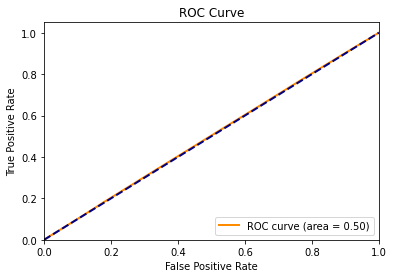

In [0]:
y_score = nn_prediction.select(vector_to_array("probability")[1]).rdd.keys().collect()
y_true = nn_prediction.select("DEP_DEL15").rdd.keys().collect()

fpr, tpr, thresholds = roc_curve(y_true, y_score)
roc_auc = auc(fpr, tpr)

plt.figure()
lw = 2
plt.plot(
    fpr,
    tpr,
    color="darkorange",
    lw=lw,
    label="ROC curve (area = %0.2f)" % roc_auc,
)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()

## Results

Our pipeline process took around 10 to 20 minutes for baseline models and 10 minutes to an hour depending on the hyperparameter. To improve the training process, we implemented a threading process as a form of parallelization to improve the processing power of our model. Threads can be thought of as worker nodes such that each thread finishes tasks and the main program will command the worker to shut off once complete. Then, we can take the resulting metrics, recall, in this case, and report results.

The results of each of our experients are listed below along with its discussion.

### Logistic Regression

| Experiment Number | Max Iterations | Regularization Prameter | Elastic Net Parameter | Engineered Features | Recall |
| ----------------- | -------------- | ----------------------- | --------------------- | ------------------- | ------ |
| 1 | 10             | 0.3                     | 0.8                   | ["PageRank"]        | 0      |
| 2 | 10             | 0.1                     | 0.8                   | ["PageRank"]        | 0      |
| 3 | 10             | 0.3                     | 0.1                   | ["Holiday"]         | 0      |
| 4 | 10             | 0.1                     | 0.1                   | ["Holiday"]         | 0      |


After running a few experiments, changing parameters such as "Regularization Parameter", "Elastic Net Parameter" and our "Engineered Features", we saw recall values of 0 across the board. This was because it was trained on a lot of fields and some of them were noisy. Because of this, we were unsure which hyperparameter would yield the best results. To increase our recall, we could attempt to remove feature that have 0 to no correlation to the output variable.

### Decision Trees

| Experiment Number | Max Depth | Max Bins | Engineered Features | Recall |
| ----------------- | --------- | -------- | ------------------- | ------ |
| 1 | 5         | 32       | ["PageRank"]        | 0.00015       |
| 2 | 10        | 32       | ["PageRank"]        | 0.05739       | 
| 3 | 20        | 100      | ["PageRank"]        | 0.26158       |
| 4 | 20        | 200      | ["PageRank"]        | 0.25873       |
| 5 | 10        | 32      | []        | 0.03753       |

After running our experiments we were able to determine a few things with regards to our decision tree models. When trying to identify the ideal "Max Depth" parameter, we noticed that increasing the complexity and value of "Max Depth" would result in higher recall values. When looking at the "Max Bins" value, we noticed that increasing the value would result in higher recall, but also found that the "sweet spot" would fall somewhere between 100 to 200 bins. To get a sense of how our new graph based PageRank feature affects the results, we ran a 5th experiment holding all hyperparameters from the 2nd experiment equal and removing the PageRank feature. We saw a decrease in the recall value from 0.05739 to 0.03573 after the PageRank feature was removed. Based on all of our experiments, the 3rd experiment gave us the best recall value where the hyperparameters used was Max Depth = 20 and Max Bins = 100.

### Neural Network Model (Multilayer Perceptrons)
#### Architecture 1 - MLP-15 - Sigmoid - Sigmoid - 2 Softmax

| Experiment Number | Layers | Block Size | Max Iterations | Engineered Features | Recall |
| ----------------- | --------- | --------- | -------- | ------------------- | ------ |
| 1 | [15, 10, 5, 2] | 128         | 100       | ["PageRank", "Holiday"]        | 0.00211       |
| 2 | [15, 10, 5, 2] | 256        | 100       | ["PageRank", "Holiday"]        | 0.00067       | 
| 3 | [15, 10, 5, 2] | 512        | 100      | ["PageRank", "Holiday"]        | 0.00334       |
| 4 | [15, 10, 5, 2] | 128        | 200      | ["PageRank", "Holiday"]        | 0.00173       |
| 5 | [15, 10, 5, 2] | 256        | 200      | ["PageRank", "Holiday"]        | 0.00439       |
| 6 | [15, 10, 5, 2] | 512        | 200      | ["PageRank", "Holiday"]        | 0.00343       |

After running our experiments we were able to determine a few things with regards to our neural network models. For our parameters, we set the value of "tol"(convergence tolerance) = 1e-06, "seed"(random seed) = 1234, "stepSize" = 0.03 and solver = "l-bfgs". Our first neural network had an input layer of 15 nodes, there were 2 hidden layers each with 10 and 5 nodes. The output layer had 2 nodes which represents whether there was a delay or not. When trying to identify the ideal "Block Size" parameter, we noticed that increasing the value of "Block Size" would result in higher recall values and decreasing it gave a lower recall value but longer run times. When looking at the "Max Iterations" value, we noticed that increasing the value would also result in higher recall. However, the MLP Classifier from the PySpark ML Library doesn't give us the history for the iterations that it goes through, therefore we can't identify the 'sweet spot' or the ideal parameter value. From our experiments in the first architecture, the best recall value that we had was for experiment #5 where the layer was set to [15,10,5,2], block size of 256 and max iterations of 200. There was an improvement of 0.00439 in the recall value compared to the best recall value for our baseline (logistic regression) which was 0.
#### Architecture 2 - MLP-15 - Sigmoid - 2 Softmax

| Experiment Number | Layers | Block Size | Max Iterations | Engineered Features | Recall |
| ----------------- | --------- | --------- | -------- | ------------------- | ------ |
| 7 | [15, 12, 2] | 128         | 100       | ["PageRank", "Holiday"]        | 0.00030       |
| 8 | [15, 12, 2] | 256        | 100       | ["PageRank", "Holiday"]        | 0.00277       | 
| 9 | [15, 12, 2] | 512        | 100      | ["PageRank", "Holiday"]        | 0.00148       |
| 10 | [15, 12, 2] | 128        | 200      | ["PageRank", "Holiday"]        | 0.00063       |
| 11 | [15, 12, 2] | 256        | 200      | ["PageRank", "Holiday"]        | 0.00206       |
| 12 | [15, 12, 2] | 512        | 200      | ["PageRank", "Holiday"]        | 0.00525       |

We had the same approach for our 2nd architecture for the Neural Network. We set the value of "tol"(convergence tolerance) = 1e-06, "seed"(random seed) = 1234, "stepSize" = 0.03 and solver = "l-bfgs". Our second neural network had an input layer of 15 nodes,  but there was only 1 hidden layers that has 12 nodes. The output layer still had 2 nodes which represents whether there was a delay or not. When trying to identify the ideal "Block Size" parameter, we noticed that increasing the value of "Block Size" also resulted in higher recall values and decreasing it gave a lower recall value but also longer run times. We had the same results when increasing the "Max Iterations". Our hyperparameter configuration that has the highest recall value was from experiment #12, where the layer was set to [15, 12, 2], block size of 512 and max iterations of 200. The value of the recall value was 0.00525 which was better compared to our baseline model and better than the value from the best experiment from our first architecture.

### Evaluation on 2021 dataset

#### Data Decision Tree

| Max Depth | Max Bins | Engineered Features | Recall |
| --------- | -------- | ------------------- | ------ |
| 20         | 100       | ["PageRank", "Holiday"]        | 0.08076 |

We evaluated the 2021 dataset using the same hyperparameter configuration from our best model (3rd experiment for Decision Trees) where the Max Depth = 20, Max Bins = 100 and the PageRank Feature included. We achieve a recall value of 0.08076 which was lower than the calculated average recall (0.26158) from the crossfold-validation. It is however closer to the 5th fold recall value and when we suspect that when we averaged the 5 folds it resulted in having a high recall value for the cross validation.

#### Neural Network

| Layers | Block Size | Max Iterations | Engineered Features | Recall |
| --------- | --------- | -------- | ------------------- | ------ |
| [15, 12, 2] | 512         | 200       | ["PageRank", "Holiday"]        | 0       |

We evaluated the 2021 dataset using the same hyperparameter configuration from our 2nd architecure for the neural network model (12th experiment for Neural Networks) where the layers = [15, 12, 2], Block Size = 512, Max Iterations = 200 and the PageRank Feature included.

## Discussion

### Why is our recall so low?

The recall metric for every experiment is close to zero. Even with every combination of hyper parameters and model algorithms, we could not obtain a decent recall value. There are two reasons why this may have happened.

1. Our features are not correlated or too disperse in relation to our response variable. In our EDA, there were no signs of strong correlation between the input and output variables. Additionally, our models may have not been able to identify the importance of the weather conditions fields.

2. There is also very little weather delay data in comparison to the entire flight data. Out of the 70 million flights, only 680,000 flights were delayed by weather whereas 12,000,000 flight were delayed for other reaons. The imbalanced dataset with extremely low values of flight delays induced by weather may have caused the model to predict them as anomalies. With an extremely low sample size, correctly predicting a flight delay is extremely difficult.

### Time Series Cross Validation

We chose to implement cross validation because we cannot randomly sample from our dataset to build our training and test sets. Data from a future date cannot predict today's results because the goal of our model is to predict future flight delays based on historical data from the past. If this statement is used as a condition for our model, having future data in our train and test sets would violate the conditions for our model to work correctly and output valid results. For example, if we predicted whether or not today's flight would be delayed in a real life scenario, we would not even have access to tomorrow's weather data to feed into our model. And even if we did somehow have access to this future weather data, it would not make sense for us to use that information to predict flight delays for the current day's flights.

### Limitations

We chose to limit our experiments to four per model (8 in total). We only ran a select few experiements because of a couple of factors

- Compute power
  - We were given 10 worker nodes, each with 4-cores and 16GB each. This would take one of our experiments anywhere from 40 minutes to 2 hours to execute depending on the model. If we were not constrained on our cluster configuration, then the training process/time would gradually decrease. 
- Time complexity
  - Since we ran a time-series cross validation, where random sampling was not possible, we could not utilize Spark's parallelization ability to its fullest potential. Therefore, running a sequential cross validation took O(N) time complexity because each fold is evaluated once (where N is the number of folds).
  - Paired with lack of compute power, it was difficult to iterate on numerous models and discover more outcomes.

While training our models, we noticed that there was a large jump in computation time as compared to phase 3. To speed up this process we introduced multi-threaded workers to parallelize each fold. By doing so, we were able to decrease the training time from around 3+ hours to 40 minutes.


### Engineered Features

The engineered features and their impact are listed below.

- Airport PageRank
  - This was our graph-based feature that we implemented to show the importance of an aiports based on flight delays. We were under the assumption that the airports deemed the most important based on delays would contribute to the probability that a flight departing from that airport would be delayed. For both logistic regression and our decision tree model, it was difficult to evaluate whether or not this feature was useful because our recall did not increase. 
- US Holiday Impact
  - Given that US holidays tend to be heavy travel periods, we hypothesized that the increased flyer volume could be linked to increased delays. 
  - We referenced a list of U.S. holidays and performed a left join to our final existing dataframe on features including `MONTH` and `DAY_OF_MONTH`. We then created a new binary field, `IS_US_HOLIDAY`, which took the form of 1 if the date fell on a US holiday and 0 otherwise. We ran a correlation of `IS_US_HOLIDAY` against `DEP_DEL15` to understand if holidays were related to delays. Unfortunately, we observed that holidays were not correlated (-0.00196) to flight delays. We hypothesize that this relationship exists because travelers typically travel prior to and after U.S. holidays so as to be able to celebrate with family and friends on U.S. holidays. Nevertheless, it was worthwhile to pursue given the logic. As a next step, we plan to expand the U.S. holiday marker to a 7-day window before and after U.S. holidays to explore this hypothesis.
    
Overall, our pipeline process took around 10 to 20 minutes for baseline models and 10 minutes to an hour depending on the hyperparameter. To improve the training process, we implemented a threading process as a form of parallelization to improve the processing power of our model. Threads can be thought of as worker nodes such that each thread finishes tasks and the main program will command the worker to shut off once complete. Then, we can take the resulting metrics, recall, in this case, and report results.

#### Performance and Scalability Issues

During our EDA, we had many instances of performance issues where visualizations were running for an extremely long time due to the sheer amount of data. For example, creating correlation heatmaps and histogram aggregations can be computationally expensive. To resolve this issue, we downsized the data by randomly sampling the dataset. This will still give us a good approximation of the data from a visual standpoint.

With big data sets, there were often scalability issues too. Additionally, for every new engineered feature and join, the Spark driver had to process many more actions, especially after cleaning the dataset. A solution that we enacted was to save the dataset into a blob storage. Once written, it will be written  into the Azure cloud storage such that it can be read at any moment to retrieve the latest dataframe even if the cluster shuts down. We’ve also created checkpoints by creating different versions of the same dataframe so that we can refer to different datasets.

Lastly, our models often took a hit in performance since they’re trained on large datasets even with distributed frameworks like Spark. Therefore, we decided to run our experiments and different hyperparameters on smaller datasets. Similar to the EDA, we down sampled our dataset since the likelihood of the model converging before reading in all of the data is high.

In our initial phase, we thought that creating a timeframe of weather readings before and after the flight departure would let our model learn patterns in weather based on time. However, this approach required specific model algorithms tailored for time series dependent flights. By changing our flight records from a timeframe to point-in-time, we were able to decrease the size of our dataset by tenfold.

### Data Leakage

Data leakage occurs in machine learning when a predictive model's training set contains "leaked" data- which means information that should not have been available at the time of prediction. Data leakage will cause skewed and over-estimated success metrics for the model which will not translate to brand new data if the model were ever pushed to production. In the context of this project, data leakage would occur if flight/weather data from any date after the day of a flight-to-be-predicted were present in the training set for the model. For example, data leakage would occur if flight/weather data from December 10th, 2022 were used to predict a flight delay for a flight on December 5th, 2022. Of course because we are using large dataset with records ranging over 5+ years, this is a serious concern as any future data used to predict a flight would completely invalidate the success metrics we get from our mdoels.

One tactic to help us avoid data leakage was the specfic way that we split our data. Instead of pulling random data from the entire raw dataset of information from 2015-2021, we did a time-based split by year. This ensures that our training data was not contaminated by any future data that we had access to. We also avoided using A common spot in the data pipeline for data leakage is during the normalization phase. However, because of our unique data splitting technique, we were able to to run un-compromised data through our pipeline every time. If we had random sampled our training set, the L1 norm that we leveraged would've taken from values occuring after our prediction dates, which would have invalidated our results. 

One instance where we may have violated a cardinal sin of ML is the I.I.D (independent and identically distributed) property within our final joined dataframe. Some of our data points in our final joined dataframe may not be independent of each other. Even though the data was provided with labels regarding delays, those labels were not set under the circumstance that weather features would be the only factors affecting the delays. The flight in reality could have been delayed for a reason having nothing to with weather such as mechanical failures or flight crew problems. When we made the decision to only focus on weather data, we overlooked how I.I.D would be affected as now there can be flights within our dataset that have been delayed because a previous inbound flight was delayed, omitting the fact that all the data points are independent.

#### Gap Analysis

| Pipeline Owner | Eval Metrics | Cross Fold Validation Performance | Test Performance | Train Time | Blind Test Time | Model Architecture | Features | Hyperparameters |
| -------------- | -------------------- | ---------------- | ---------------- | ---------- | --------------- | ---------------- | -------- | -----------|
| Best Performing Pipeline on Leaderboard | Recall| 0.5665 | 0.6053 |  | | GBT |  | maxDepth = 5, numTrees = 100, subsamplingRate = 0.9, stepSize = 0.1
| Our Best Performing Pipeline | Recall| 0.26158 | 0.08076 | 44.85 Minutes | 40.08 Minutes | Decision Tree | PageRank (Decision Tree) | maxDepth = 20, maxBins = 100
| Our Best Performing Pipeline (Neural Network) | Recall| 0.00525 | 0 | 14.72 Minutes | 24.03 Minutes | Multilayer Perceptron (MLP) Neural Network  | PageRank + Holiday| layers = [15,12,2], blockSize = 512, maxIter = 200

##### Suboptimal Results and Strategies

We saw a decrease in the recall value when we removed the PageRank feature in one of our experiments for our data decision tree model. We see PageRank as a significant feature in building our models. 

We also saw a decrease in the execution time of our models since we reduced our input features from 47 to 15 and number of rows from over 210 million to over 42 million after we did our feature engineering and feature sampling. We also sampled on 10% of our data when we performed our hyperparameter tuning to find the best parameter configurations. This had a significant improvement in our run times and reduced it by at least 2-fold.

##### Steps for Improvement

One thing that can be used to improve our model is to perform Synthetic Minority Oversampling Technique(SMOTE) on our dataset. Since we have an imbalanced dataset, we suspect that our models are not given enough data to train on flights that have delays caused by the weather. SMOTE will introduce some randomness in creating synthetic minority instances with our dataset which will help in increasing the number of cases that have delays in a balanced way. However, applying this technique is extremely difficult since increasing the size of delayed flights will double the size of the data records, often causing our clusters to crash.

In addition to this, we also look into creating more features that are more inline with the weather data. For example, creating a new categorical feature that indicates if there is a severe weather condition like a thunderstorm if the value exceeds a particular threshold on the wet_bulb_temperature and wind_speed attributes. We are also looking into creating another feature that pertains to the geolocation, as this can also have an effect on predicting delays based on the weather. For example, the flights from the south are more susceptible to delays compared to flights from the northeast if we're talking about a drop in temperature. The airports in the northeast are more likely accustomed to lower temperature and have more anti-freezing measures for their runways compared to the airports from the south.

## Conclusion

#### Importance of Project

The focus of the project is to help the FAA set regulations to mitigate the impact of airline delays caused by weather. Inclement weather is an uncontrollable factor of airline delay in which humans have no control over unlike late arrivals or government airspace temporary restrictions. Not only can it decrease customer satisifaction, revenue, and long-term economic growth given that aviation contributes about 5% to U.S. GDP, but it's also a natural recurring cause which can devastate our profits long term. 

#### Our Hypothesis, Goals, and Approach

We hope that by using machine learning models including decision trees and logistic regression as well as custom features, we can better predict future flight delays as well as minimize fatal accidents caused by weather. In doing so, we hypothesize that we can increase customer satisication and increase revenues for airlines. In summary, when creating machine learning models, we cleaned the data for missing values, duplicates, and unnecessary data, performed Exploratory Data Analysis, joined three dataframes into a final dataframe to train, performed feature selection and engineering, ran the models, and optimized them by exploring hyper-parameter tuning. 

#### Gap Analysis

Against other groups, our model did not perform anywhere near as well. Some of the features others incorporated into their model were new features based on weather 4 hours, 3 hours, and 2 hours before departure time. This feature would be great for us as it would be able to detect whether or not hazardous weather will approach. Other teams seemed to use gradient boosted trees whereas we used neural networks to find key patterns.

#### Result Significance

Among all of our models, our best model is the decision tree with a max depth of 20, 100 bins, and PageRank feature which trained for about 45 minutes. Despite this being our best model, our recall metric was close to 8%. A reason why our model may not have worked is due to the imbalanced dataset and uncorrelated features with weather.

#### Next Steps

Since we were not able to create a sufficient model to accurately predict flight delays based on weather, changing flight regulations based on delay would be difficult. It would be unwise to create specific regulations based on delay type and it would be better to keep the status quo of setting 15 minutes as the standard rule for flight delays.

If we decide to continue with our current problem statement in depth, then we should explore ensemble models such as XGBoost, improve on them with additional hyper-parameter tuning, and expand our custom feature set. Revisiting EDA to look at data subsets may also improve model performance. We can also improve custom features like creating a categorical variable based on weather data to identify different types of severe weather or create clustering features based on US regions. We may also need to sample more data from airlines to determine the effects of weather on flight delays as we may not have enough records.

## Team 10
## Section 3 Group 2

| Team Member | E-Mail Address |
| ----------- | -------------- |
| Justin Chan | justinchan@berkeley.edu |
| Matt Rubino | rubinomq@berkeley.edu |
| Job Eliezek Bangayan | job.eliezek@berkeley.edu |
| Steven Sung |sysung98@berkeley.edu |


## Credit Assignment
| Task | Estimated Improvement | Hours Spent | Start Date | End Date | Team Member
| ---- | --------------------- | ----------- | ---------- | -------- | ----------- |
| Refined Airlines EDA by removing cells and using PySpark | 0     | 2 | 11/30 | 11/30 | Steven Sung |
| Remove early and late limit timeframe for departure      | 0  | 0.5 | 11/30 | 11/30 | Steven Sung |
| Remove destination airport                               | -0.06  | 0.5 | 11/30 | 11/30 | Steven Sung |
| Add data lineage column within data dictionary           | 0     | 1   | 12/2 | 12/2 | Steven Sung |
| Added pie chart of Weighted % of Delays by Carrier to EDA  | 0     | 2   | 12/1 | 12/1 |  Matt Rubino |
| Implemented a Multilayer Perceptron (MLP) Neural Network (NN) model | 0.001 | 2 | 12/2 | 12/2 | Job Bangayan |
| Added function to create confusion matrix | 0     | 2   | 12/3 | 12/3 |  Matt Rubino |
| Added written section for clustering feature  | 0     | 0.5   | 12/3 | 12/3 |  Steven Sung |
| Hyperparameter Tuning on the Neural Network models | 0.005 | 12 | 12/3 | 12/5 | Job Bangayan |
| Added extra data to augment holiday feature | 0.01 | 0.5 | 12/4 | 12/4 | Justin Chan |
| Reimagined business case and clarified project goals | 0 | 1.5 | 12/4 | 12/4 | Justin Chan |
| Re-coded the custom holidays feature to account for differences in dates by year  | 0.01     | 4 | 12/4 | 12/4 |  Matt Rubino |
| Added pipeline family features and logistic regression section  | 0     | 2   | 12/5 | 12/5 |  Steven Sung |
| Added written section on Data Leakage and explored model pipelines for occurances | 0.01 | 2 | 12/6 | 12/6 | Justin Chan |
| Revised discussion and conclusion based on current status | 0     | 2   | 12/6 | 12/6 |  Steven Sung |
| Added EDA on customized features | 0     | 2   | 12/6 | 12/6 |  Matt Rubino |
| Built out presentation skeleton | 0     | 0.75   | 12/6 | 12/6 |  Justin Chan |
| Edited and re-wrote the final research report  | 0     | 20   | 12/3 | 12/6 |  Team |